In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
project_dir = '/content/drive/MyDrive/AI/deepface' #change this as needed

Convert Video to Frames

In [ ]:
import cv2
challenge_type = "mask"



In [ ]:
vidcap = cv2.VideoCapture(project_dir + '/videos/mask.mp4')
success,image = vidcap.read()
count = 0

In [ ]:
while success:
  cv2.imwrite(project_dir + '/frames/' + challenge_type + '/frame%d.jpg' % count, image)     # save frame as JPG file      
  success,image = vidcap.read()
  count += 1

# Extract faces from the frames using Face Detector

In [ ]:
!pip install retina-face

In [ ]:
#FACE DETECTION
from retinaface import RetinaFace
import os
import matplotlib.pyplot as plt
frame_dir = project_dir + '/frames/' + challenge_type
frames = os.listdir(frame_dir)
detectedFaces = {}

for frame in frames:
  
  img_path = frame_dir + "/" + frame
  resp = RetinaFace.detect_faces(img_path)
  if type(resp) == dict:
    faces = {}
    for k in resp:
      faces[frame.split('.')[0] + "_" + k] = [int(i) for i in resp[k]["facial_area"]]
    detectedFaces[ frame.split('.')[0] ] = faces

    faces_extract = RetinaFace.extract_faces(img_path = img_path, align = True)
    count = 1
    for face in faces_extract:
        save_path =  project_dir + '/extracted_faces/' +challenge_type + "/" + frame.split('.')[0] + '_face_' + str(count) + '.jpg'
        cv2.imwrite(save_path, cv2.cvtColor(face, cv2.COLOR_RGB2BGR))
        count +=1


In [ ]:
import json

json = json.dumps(detectedFaces)

with open(project_dir + "/" + challenge_type +  "_faces.json", "w") as f:

  f.write(json)


# Verify your results

In [ ]:
!pip install deepface

In [ ]:
#Recognition
from deepface import DeepFace


In [ ]:
# cosine, euclidean, euclidean_l2

#Query images
# img_path = '/content/drive/MyDrive/AI/deepface/queries/100053648_Mask_Glasses_Ghutra_WhiteBackground_front.jpg'
# img_path = '/content/drive/MyDrive/AI/deepface/queries/100053648_Glasses_Ghutra_Morning_front.jpg'
img_path = "/content/drive/MyDrive/AI/deepface/queries/100053648_Glasses_Ghutra_Morning_left.jpg"

#Faces Directory
db_path = '/content/drive/MyDrive/AI/deepface/extracted_faces/random' 

#Recognition happens here 
y = DeepFace.find(img_path, db_path, model_name ="ArcFace", distance_metric = 'cosine', model = None, enforce_detection = False, detector_backend = 'retinaface', align = True, prog_bar = True, normalization = 'base', silent=False)
y

1/1 [==============================] - 0s 228ms/step


In [ ]:
import os
len(os.listdir('/content/drive/MyDrive/AI/deepface/extracted_faces/intruder' ))

12037

In [ ]:
paths = y["identity"]
values = y["ArcFace_cosine"]
positives = []
negatives = []
threshold = 0.65

#DF parser
for i in range(len(paths)):

  name = paths[i].split("/")[-1].split(".")[0]
  
  if values[i] <= threshold:
    positives.append((name,values[i]))
    
  else:
    negatives.append((name,values[i]))


NameError: ignored

# Load in old data


In [ ]:
#load detected faces
import json
challenge_type = "mask"
result_dir = project_dir + "/" + challenge_type + "_results/" + challenge_type

with open(result_dir + "_faces.json") as f:
  detectedFaces = json.load(f)


In [ ]:
#load positives and negatives
positives = []
negatives = []
import json
result_dir = project_dir + "/" + challenge_type + "_results/" + challenge_type

with open(result_dir + "_positives.json") as f:
  positives_dict = json.load(f)
  for key, value in positives_dict.items():
    positives.append((key,value))

with open(result_dir + "_negatives.json") as f:
  negatives_dict = json.load(f)
  for key, value in negatives_dict.items():
    negatives.append((key,value))


## Used for adjusting threshold

In [ ]:
#adjusting threshold

#new split 
identities = [i for i, k in positives] + [i for i, k in negatives]
values = [k for i, k in positives] + [k for i, k in negatives]
y = pd.DataFrame(
    {'identity': identities,
     'ArcFace_cosine': values
    })

positives = []
negatives = []
threshold = 0.65

#DF parser
for i in range(len(identities)):

  if values[i] <= threshold:
    positives.append((identities[i],values[i]))
    
  else:
    negatives.append((identities[i],values[i]))


# Validation

In [ ]:
!pip install xmltodict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import xmltodict
import matplotlib.pyplot as plt

with open(project_dir + "/xml_files/" + challenge_type +"_annotations.xml") as file:
    file_data = file.read() # read file contents
    
    # parse data using package
    dict_data = xmltodict.parse(file_data)

image_list  =[]
items = dict_data["annotations"]["track"]["box"]

In [ ]:
#check false and true positives
true_positives = []
false_positives = []
positive_holder = []

for i in items:
  framenum = "frame" + i["@frame"]
  try:
    detectedFaces[framenum]
  except:
        continue
  else: #match found
    for k, j in positives:
      try:
        detectedFaces[framenum][k]
      except:
        # count+=1
        continue
      else:
        value = detectedFaces[framenum][k]
        detected_x = float(i["@xtl"])
        detected_y = float(i["@ybr"])
        annotated_x = value[0]
        annotated_y = value[3]
        x_error = abs(annotated_x - detected_x)
        y_error = abs(annotated_y - detected_y)
        if x_error < 20 and y_error < 20 :
          true_positives.append([k, (x_error, y_error), j])
          positive_holder.append([k, (x_error, y_error), j])
        else:
          false_positives.append([k, (x_error, y_error), j])
          positive_holder.append([k, (x_error, y_error), j])

found = False

for i,j in positives:
  found = False
  for k,q,l in positive_holder:
    if i == k:
      found = True
    
  if not found:
      false_positives.append([i, (1000, 1000), j])
        


In [ ]:
#check false and true negatives
true_negatives = []
false_negatives = []
negative_holder = []
for i in items:
  framenum = "frame" + i["@frame"]
  try:
    detectedFaces[framenum]
  except:
        continue
  else: #match found
    for k, j in negatives:
      try:
        detectedFaces[framenum][k]
      except:
        continue
      else:
        value = detectedFaces[framenum][k]
        detected_x = float(i["@xtl"])
        detected_y = float(i["@ybr"])
        annotated_x = value[0]
        annotated_y = value[3]
        x_error = abs(annotated_x - detected_x)
        y_error = abs(annotated_y - detected_y)
        if x_error < 20 and y_error < 20 :
          false_negatives.append([k, (x_error, y_error), j])
          negative_holder.append([k, (x_error, y_error), j])
        else:
          true_negatives.append([k, (x_error, y_error), j])
          negative_holder.append([k, (x_error, y_error), j])
          

found = False

for i,j in negatives:
  found = False
  for k,q,l in negative_holder:
    if i == k:
      found = True
    
  if not found:
      true_negatives.append([i, (1000, 1000), j])

Alansari Results for Testing

In [ ]:
total_positives = len(positives)
total_negatives = len(negatives)
total_true_positives = len(true_positives)
total_false_positives = len(false_positives)
total_true_negatives = len(true_negatives)
total_false_negatives = len(false_negatives)

In [ ]:
print("total_positives: ", total_positives)
print("total_negatives: ", total_negatives)
print("total_true_positives: ", total_true_positives)
print("total_false_positives: ", total_false_positives)
print("total_true_negatives: ", total_true_negatives)
print("total_false_negatives: ", total_false_negatives)

total_positives:  5275
total_negatives:  19
total_true_positives:  290
total_false_positives:  4985
total_true_negatives:  19
total_false_negatives:  0


In [ ]:
try:
  recall = (total_true_positives/ (total_true_positives + total_false_negatives)) * 100
except: 
  recall = "-"

try:
  precision = (total_true_positives / (total_true_positives + total_false_positives)) * 100
except:
  precision = "-"

try:
  accuracy = ((total_true_positives + total_true_negatives)/(total_true_negatives + total_false_positives +  total_false_negatives + total_true_positives)) * 100
except:
  accuracy = "-"
try:
  f1 = (2 * (precision * recall) / (precision + recall))
except:
  f1 = "-"
print("Precision: ", precision," %")
print("Recall: ", recall, " %")
print("F1 score: ", f1, " %")
print("Accuracy: ", accuracy, " %")



Precision:  5.497630331753554  %
Recall:  100.0  %
F1 score:  10.422282120395327  %
Accuracy:  5.836796373252739  %


# Saving the Data

In [ ]:
with open(project_dir + "/" + challenge_type + "_results/" +  challenge_type +  "_results.txt", "w") as f:
  f.write("Precision: " + str(precision) +"%\n")
  f.write("Recall: " + str(recall) + "%\n")
  f.write("F1 score " + str(f1) + "%\n")
  f.write("Accuracy: " + str(accuracy) + "%\n\n")

  f.write("total_positives: " + str(total_positives) + "\n" )
  f.write("total_negatives: " + str(total_negatives) + "\n" )
  f.write("total_true_positives: " + str(total_true_positives) + "\n" )
  f.write("total_false_positives: " + str(total_false_positives) + "\n" )
  f.write("total_true_negatives: " + str(total_true_negatives) + "\n" )
  f.write("total_false_negatives: " + str(total_false_negatives) + "\n" )


obj = {}

for i,j,k in false_positives:
  obj[i] = (k,j)
import json
# create json object from dictionary
json = json.dumps(obj)

# open file for writing, "w" 
f = open(project_dir + "/" + challenge_type + "_results/" +  challenge_type + "_false_positives.json", "w")

# write json object to file
f.write(json)

# close file
f.close()
#################################################################################
obj = {}

for i,j,k in true_positives:
  obj[i] = (k,j)
import json
# create json object from dictionary
json = json.dumps(obj)

# open file for writing, "w" 
f = open(project_dir + "/" + challenge_type + "_results/" +  challenge_type+  "_true_positives.json", "w")

# write json object to file
f.write(json)

# close file
f.close()
#################################################################################

obj = {}
for i,j,k in true_negatives:
  obj[i] = (k,j)

import json
# create json object from dictionary
json = json.dumps(obj)

# open file for writing, "w" 
f = open(project_dir + "/" + challenge_type + "_results/" +  challenge_type +  "_true_negatives.json", "w")

# write json object to file
f.write(json)

# close file
f.close()
#################################################################################

obj = {}
for i,j,k in false_negatives:
  obj[i] = (k,j)

import json
# create json object from dictionary
json = json.dumps(obj)

# open file for writing, "w" 
f = open(project_dir + "/" + challenge_type + "_results/" +  challenge_type +  "_false_negatives.json", "w")

# write json object to file
f.write(json)

# close file
f.close()
#################################################################################

obj = {}
for i,j in positives:
  obj[i] = j

import json
# create json object from dictionary
json = json.dumps(obj)

# open file for writing, "w" 
f = open(project_dir + "/" + challenge_type + "_results/" +  challenge_type +  "_positives.json", "w")

# write json object to file
f.write(json)

# close file
f.close()
#################################################################################

obj = {}
for i,j in negatives:
  obj[i] = j

import json
# create json object from dictionary
json = json.dumps(obj)

# open file for writing, "w" 
f = open(project_dir + "/" + challenge_type + "_results/" +  challenge_type +  "_negatives.json", "w")

# write json object to file
f.write(json)

# close file
f.close()

# **Plotting**

In [ ]:
!pip install retina-face

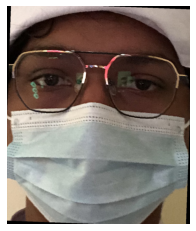

In [ ]:
import matplotlib.image as mpimg
from retinaface import RetinaFace
# img_path = '/content/drive/MyDrive/AI/deepface/queries/100053648_Glasses_Ghutra_Morning_front.jpg'
img_path = '/content/drive/MyDrive/AI/deepface/queries/100053648_Mask_Glasses_Ghutra_WhiteBackground_front.jpg'
faces_extract = RetinaFace.extract_faces(img_path = img_path, align = True)
for face in faces_extract:
    save_path =  project_dir + "/mask_query" +  '_face.jpg'
    cv2.imwrite(save_path, cv2.cvtColor(face, cv2.COLOR_RGB2BGR))
img = mpimg.imread(save_path)
plt.axis('Off')
plt.imshow(img)
plt.show()

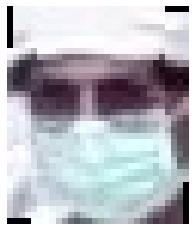

frame13_face_4
0.06564783031453647
(3.230000000000018, 1.1299999999999955)


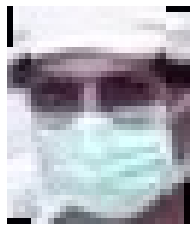

frame14_face_3
0.06240024639663766
(2.6700000000000728, 0.17999999999994998)


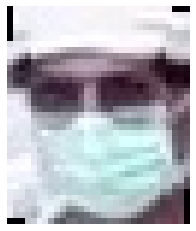

frame15_face_3
0.06052982399459894
(2.1099999999999, 0.10000000000002274)


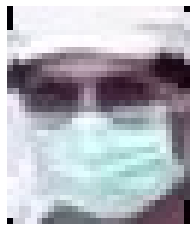

frame16_face_2
0.06102107672412349
(1.9300000000000637, 0.20000000000004547)


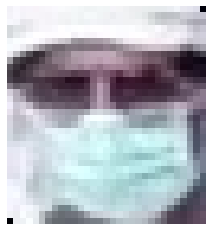

frame22_face_3
0.06539896965967995
(1.650000000000091, 1.1200000000000045)


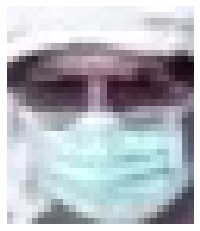

frame23_face_2
0.06493932821848203
(1.0699999999999363, 0.8799999999999955)


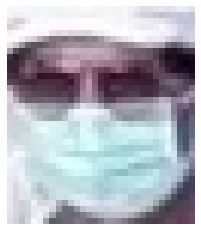

frame40_face_4
0.059309524407393566
(1.1099999999999, 0.20000000000004547)


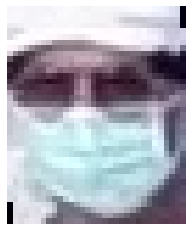

frame44_face_9
0.06550673022871156
(0.6900000000000546, 1.240000000000009)


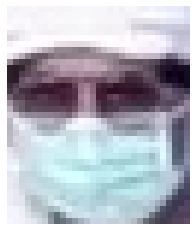

frame46_face_1
0.07190769914037709
(0.4800000000000182, 1.4800000000000182)


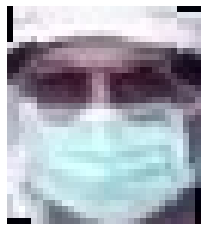

frame49_face_5
0.062486553505554765
(2.0299999999999727, 1.2200000000000273)


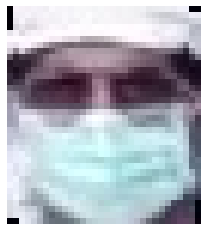

frame50_face_5
0.07062475797460199
(1.6199999999998909, 1.7999999999999545)


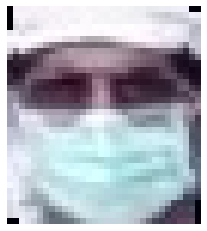

frame51_face_5
0.06831936222905055
(1.2300000000000182, 1.8400000000000318)


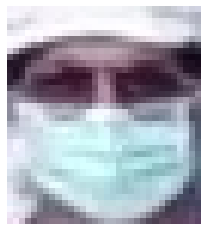

frame53_face_4
0.07663623408802167
(1.2300000000000182, 2.169999999999959)


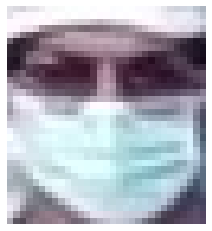

frame60_face_3
0.062181272395029796
(0.09999999999990905, 1.6000000000000227)


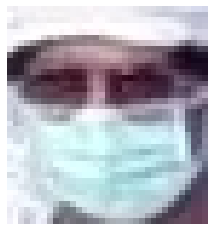

frame83_face_3
0.059414524452055306
(1.7799999999999727, 0.44000000000005457)


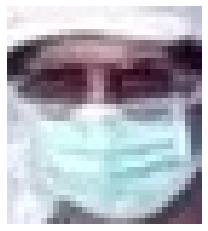

frame84_face_7
0.05685544068553705
(1.4700000000000273, 0.12000000000000455)


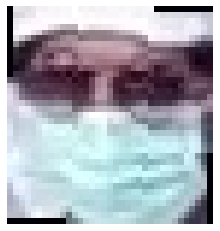

frame110_face_11
0.06582928939204047
(2.0699999999999363, 3.2000000000000455)


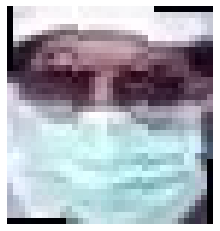

frame111_face_12
0.06578431526071038
(1.009999999999991, 3.4400000000000546)


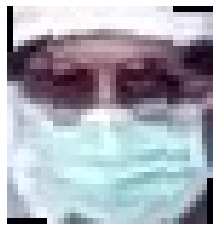

frame112_face_12
0.058620651449696415
(1.9500000000000455, 2.8099999999999454)


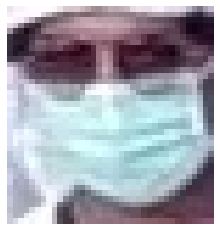

frame113_face_7
0.058216170528699096
(2.8900000000001, 2.830000000000041)


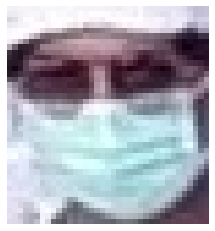

frame114_face_6
0.05610209184283932
(2.0299999999999727, 0.15999999999996817)


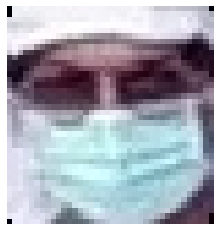

frame118_face_5
0.059746044642927765
(2.6400000000001, 1.1900000000000546)


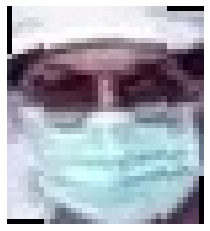

frame119_face_3
0.06593888806199921
(2.7000000000000455, 1.25)


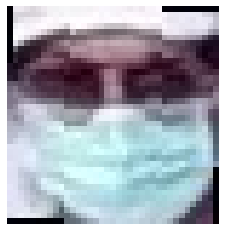

frame120_face_11
0.06517124920633444
(1.7699999999999818, 2.2999999999999545)


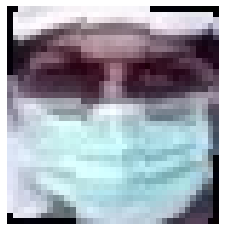

frame121_face_9
0.0591761305924694
(1.6300000000001091, 1.7200000000000273)


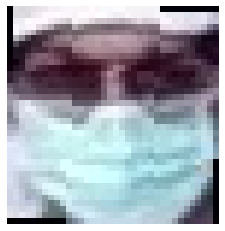

frame122_face_10
0.06254479158261539
(0.7100000000000364, 2.4400000000000546)


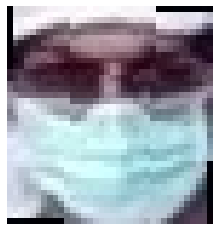

frame123_face_11
0.05932367990141585
(0.900000000000091, 1.490000000000009)


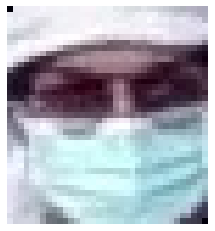

frame125_face_12
0.06486388239915997
(2.5699999999999363, 4.399999999999977)


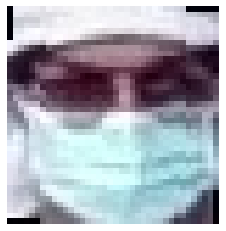

frame126_face_3
0.06060822395185139
(2.9300000000000637, 4.029999999999973)


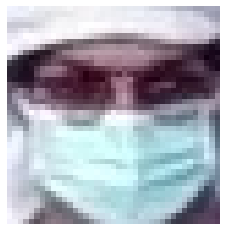

frame127_face_5
0.06735288265846451
(3.2899999999999636, 3.6499999999999773)


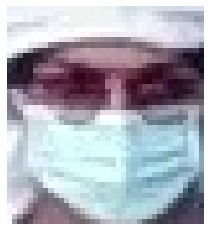

frame128_face_8
0.05976508658255364
(2.650000000000091, 2.2799999999999727)


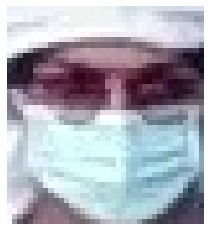

frame129_face_8
0.05976508658255364
(2.9600000000000364, 2.1399999999999864)


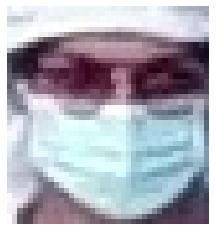

frame130_face_9
0.05951898022014468
(2.869999999999891, 0.20000000000004547)


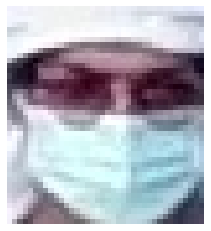

frame131_face_11
0.06358240453377773
(2.380000000000109, 2.580000000000041)


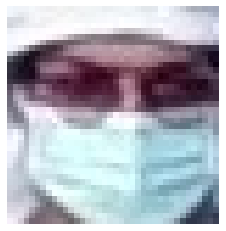

frame132_face_8
0.06216993998903175
(2.1800000000000637, 4.509999999999991)


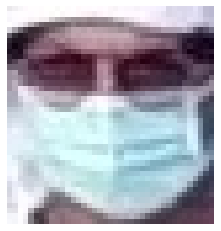

frame142_face_6
0.0552000766968237
(0.5199999999999818, 0.32000000000005)


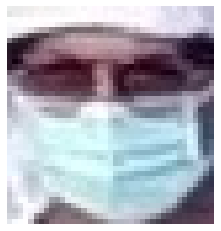

frame143_face_6
0.05618145246261541
(0.07999999999992724, 1.6100000000000136)


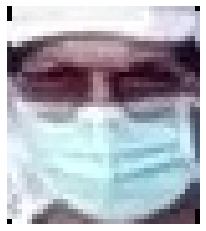

frame144_face_10
0.05216602978968976
(0.6400000000001, 0.9099999999999682)


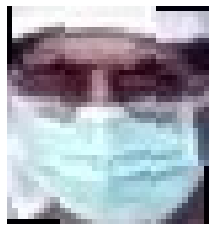

frame145_face_12
0.0536971203757346
(0.7000000000000455, 2.7000000000000455)


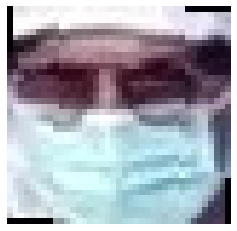

frame146_face_12
0.05534600941418255
(0.849999999999909, 3.8600000000000136)


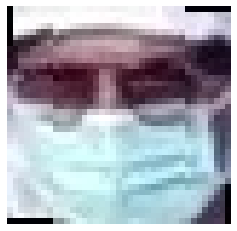

frame147_face_12
0.06068916681012915
(0.599999999999909, 5.019999999999982)


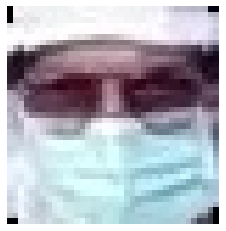

frame148_face_8
0.05292148569352395
(0.5299999999999727, 6.17999999999995)


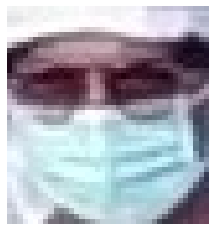

frame149_face_9
0.05491511910261959
(1.3299999999999272, 2.340000000000032)


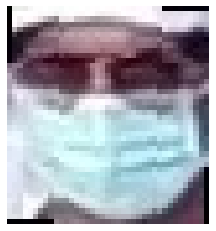

frame150_face_8
0.05394059491835379
(0.20000000000004547, 0.5)


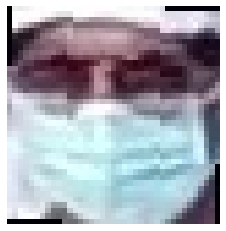

frame151_face_12
0.05722201313469888
(0.31999999999993634, 1.919999999999959)


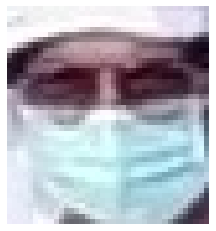

frame152_face_13
0.0633619352477851
(1.3299999999999272, 2.5399999999999636)


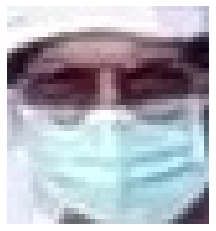

frame153_face_13
0.06189564583648721
(1.7200000000000273, 2.5)


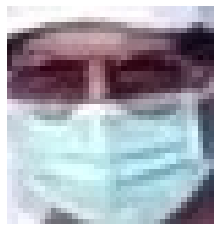

frame154_face_9
0.053217681893824365
(1.2899999999999636, 2.0499999999999545)


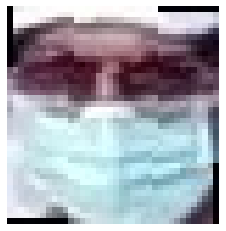

frame155_face_7
0.0642388985269029
(0.2999999999999545, 3.6000000000000227)


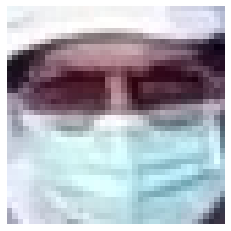

frame157_face_6
0.05852238657084152
(2.5699999999999363, 4.909999999999968)


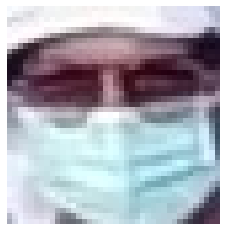

frame158_face_8
0.06181774104493276
(1.009999999999991, 3.1100000000000136)


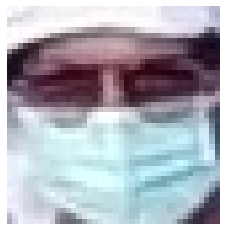

frame159_face_8
0.06151218043881168
(0.25, 3.7999999999999545)


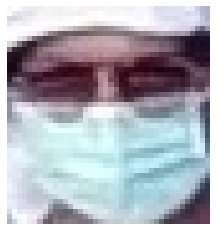

frame160_face_9
0.0620375561212444
(0.5, 2.0)


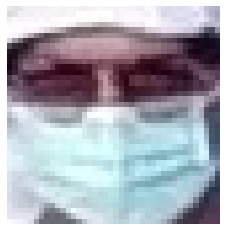

frame161_face_4
0.058818675148618826
(0.43000000000006366, 4.1200000000000045)


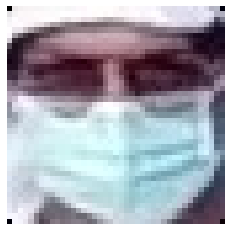

frame162_face_15
0.06076312163925368
(0.6400000000001, 3.240000000000009)


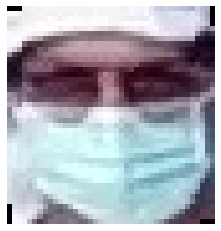

frame163_face_13
0.0572297476078889
(0.7100000000000364, 3.3600000000000136)


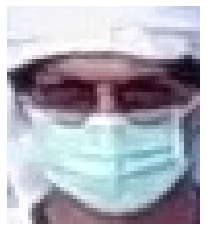

frame166_face_10
0.05583409719889132
(3.400000000000091, 1.080000000000041)


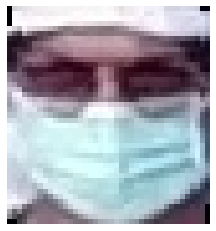

frame167_face_5
0.05967008598672652
(0.7200000000000273, 1.240000000000009)


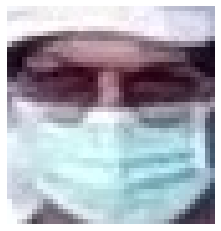

frame170_face_10
0.055813236398571386
(0.900000000000091, 3.2000000000000455)


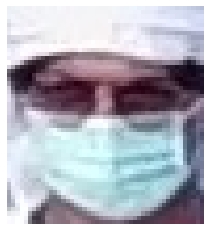

frame171_face_10
0.057797975333635954
(3.4400000000000546, 1.240000000000009)


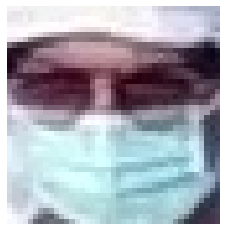

frame173_face_14
0.05700666057821979
(0.7799999999999727, 4.919999999999959)


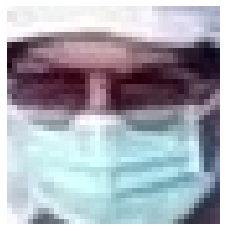

frame174_face_12
0.05106252177088577
(2.089999999999918, 4.659999999999968)


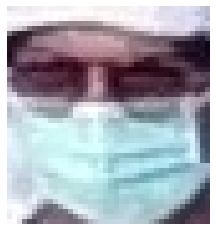

frame175_face_11
0.055843019319277376
(1.400000000000091, 2.3999999999999773)


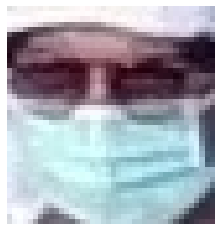

frame176_face_15
0.05045187996155531
(0.08999999999991815, 3.4700000000000273)


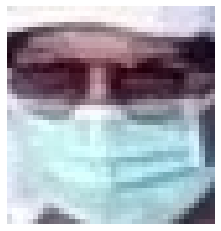

frame177_face_15
0.05189424609904947
(0.7799999999999727, 3.5399999999999636)


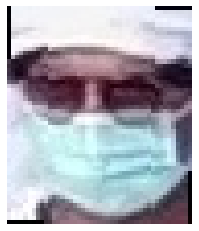

frame178_face_12
0.06331835131714803
(2.9500000000000455, 0.13999999999998636)


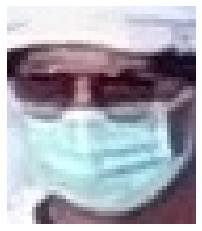

frame179_face_13
0.04741129565331814
(0.6700000000000728, 0.82000000000005)


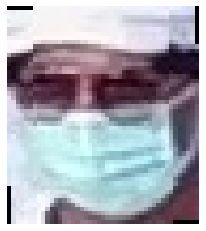

frame180_face_9
0.045693209774043564
(1.400000000000091, 0.5)


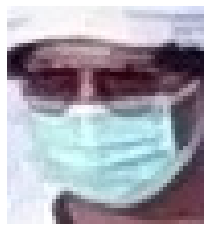

frame182_face_10
0.049384768910997745
(5.289999999999964, 5.110000000000014)


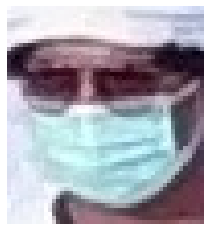

frame183_face_10
0.04809462714442947
(3.240000000000009, 3.419999999999959)


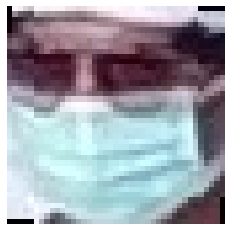

frame184_face_14
0.057038716820863034
(1.7300000000000182, 2.6900000000000546)


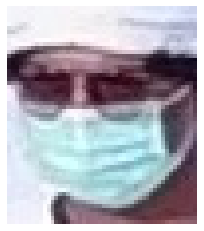

frame185_face_11
0.049853794235890314
(2.2999999999999545, 3.2000000000000455)


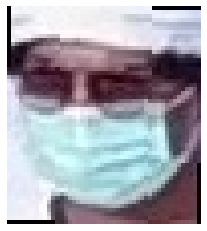

frame187_face_14
0.056092456917291034
(2.130000000000109, 2.7000000000000455)


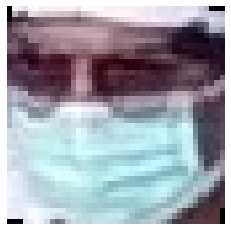

frame188_face_13
0.058180322762882875
(1.240000000000009, 3.1000000000000227)


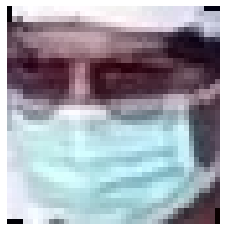

frame189_face_13
0.05831897927975549
(1.1199999999998909, 2.8500000000000227)


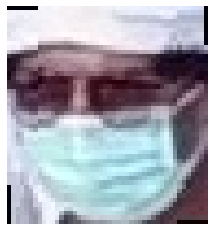

frame190_face_10
0.05480073484380499
(1.0, 0.7999999999999545)


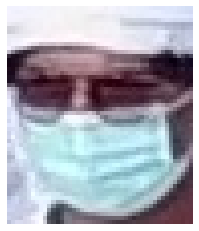

frame196_face_14
0.05337627202810413
(1.759999999999991, 1.3600000000000136)


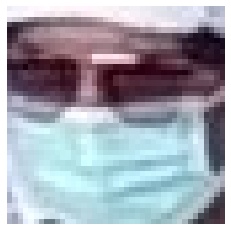

frame199_face_11
0.060822423086777544
(1.759999999999991, 4.639999999999986)


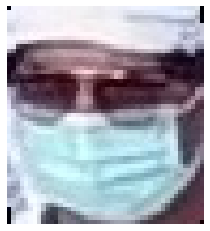

frame200_face_10
0.052350056727508476
(0.40000000000009095, 0.39999999999997726)


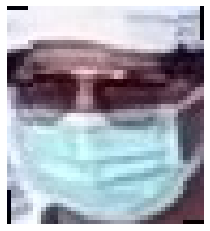

frame201_face_9
0.05250683876098505
(0.11999999999989086, 0.34000000000003183)


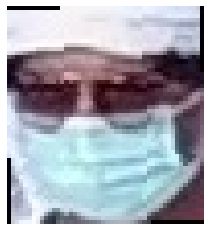

frame203_face_6
0.051434661964145034
(0.05999999999994543, 1.4700000000000273)


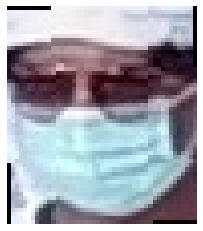

frame204_face_10
0.05370348703469763
(1.5299999999999727, 1.4700000000000273)


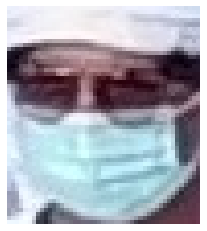

frame205_face_12
0.05297343872902982
(2.0, 0.6000000000000227)


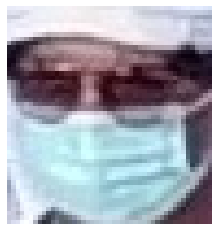

frame206_face_9
0.05653551330420181
(2.5599999999999454, 1.82000000000005)


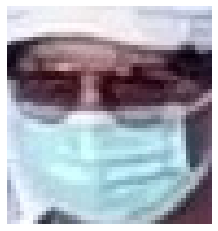

frame207_face_8
0.05711807183476669
(2.0699999999999363, 2.4400000000000546)


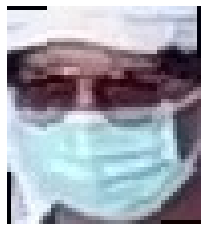

frame208_face_11
0.055068053569993225
(1.3099999999999454, 0.4700000000000273)


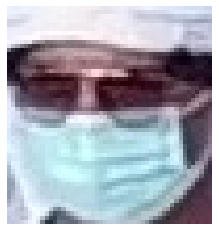

frame209_face_13
0.05539707033672314
(0.5599999999999454, 1.6100000000000136)


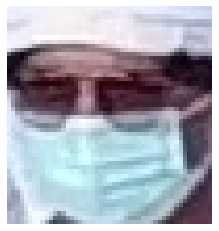

frame210_face_10
0.05557780696341308
(0.20000000000004547, 3.7000000000000455)


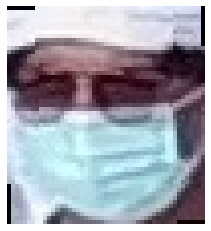

frame211_face_8
0.04878496716199565
(0.18000000000006366, 0.10000000000002274)


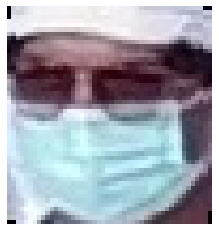

frame212_face_13
0.050499044303399354
(0.14000000000010004, 1.1200000000000045)


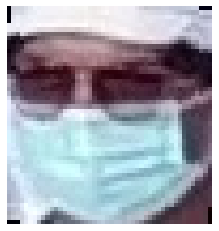

frame213_face_13
0.04993614797135171
(0.5399999999999636, 2.1499999999999773)


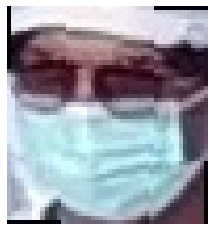

frame214_face_11
0.05557161097350083
(0.4800000000000182, 0.6200000000000045)


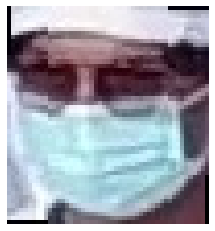

frame215_face_7
0.05035990771301213
(1.5, 0.8999999999999773)


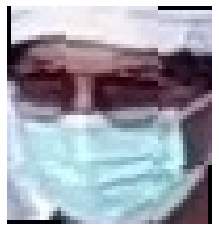

frame216_face_6
0.05275711407352468
(0.4500000000000455, 2.669999999999959)


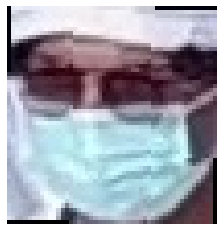

frame217_face_3
0.05564968634024914
(2.3900000000001, 1.25)


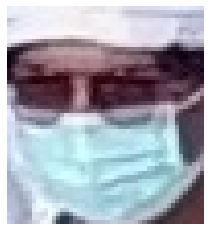

frame218_face_12
0.05289393423936106
(0.33999999999991815, 1.82000000000005)


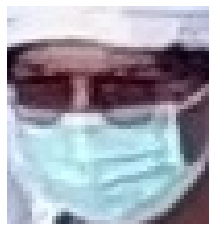

frame219_face_12
0.051787040477247914
(1.2699999999999818, 1.3600000000000136)


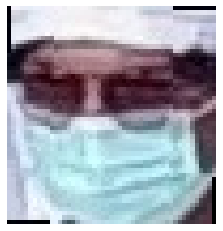

frame221_face_9
0.05189712602308405
(2.019999999999982, 4.07000000000005)


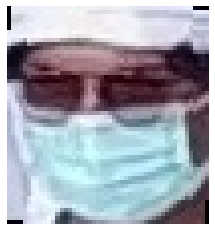

frame222_face_8
0.049945786956932414
(2.1400000000001, 1.8400000000000318)


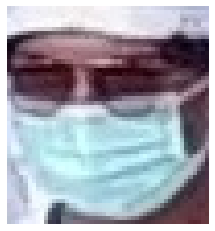

frame223_face_11
0.05179293264616025
(0.9100000000000819, 0.2699999999999818)


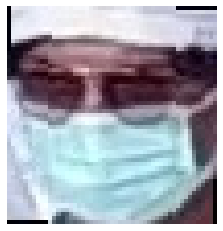

frame224_face_3
0.05498722745224771
(0.0, 1.7699999999999818)


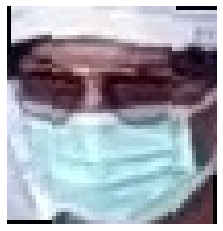

frame225_face_3
0.05651756062141955
(1.400000000000091, 2.3999999999999773)


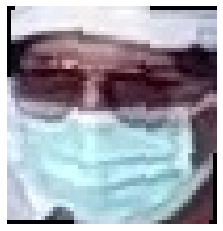

frame226_face_5
0.04534258303054528
(0.2799999999999727, 2.2000000000000455)


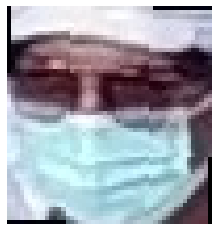

frame227_face_7
0.05090561875407762
(0.03999999999996362, 2.3999999999999773)


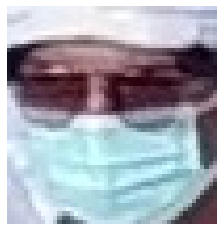

frame228_face_8
0.049464509720054006
(0.5, 3.269999999999982)


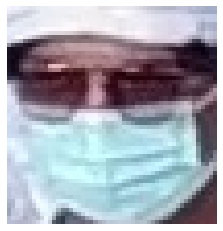

frame229_face_5
0.05171525572808955
(1.900000000000091, 1.5299999999999727)


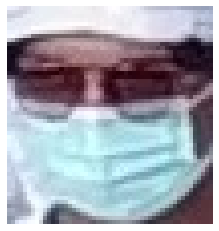

frame230_face_7
0.05520738910100842
(1.2999999999999545, 0.6000000000000227)


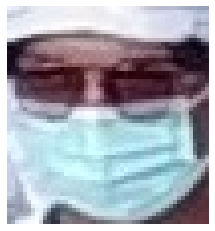

frame231_face_7
0.049755912767969535
(1.0599999999999454, 0.37999999999999545)


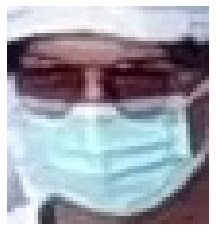

frame232_face_3
0.05673045756833439
(1.4700000000000273, 1.1900000000000546)


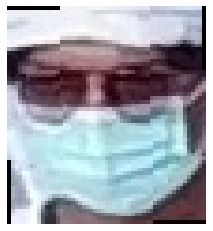

frame233_face_1
0.05486407949007399
(2.5799999999999272, 1.2899999999999636)


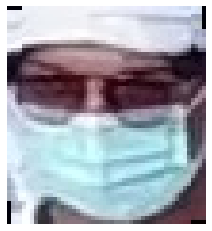

frame234_face_2
0.05647429542199167
(1.8399999999999181, 1.1000000000000227)


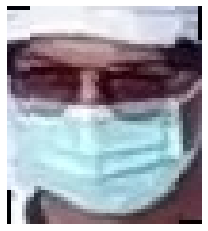

frame235_face_7
0.04748012096741083
(0.09999999999990905, 1.5)


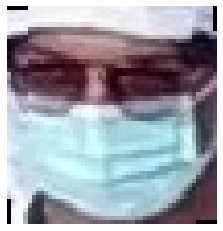

frame236_face_9
0.053785783779061624
(0.30999999999994543, 2.3799999999999955)


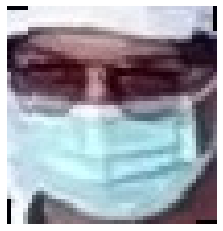

frame237_face_9
0.053337190822991154
(0.4800000000000182, 0.2599999999999909)


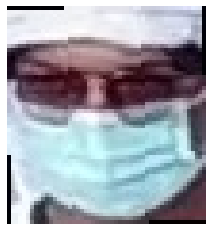

frame238_face_2
0.05249510906005406
(1.8099999999999454, 0.36000000000001364)


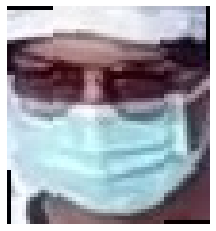

frame239_face_5
0.0463624950227316
(1.1099999999999, 1.0199999999999818)


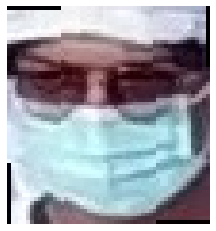

frame240_face_3
0.05336392009337254
(1.400000000000091, 0.39999999999997726)


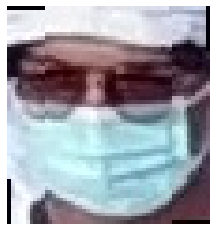

frame241_face_3
0.05005326828149337
(1.1199999999998909, 0.22000000000002728)


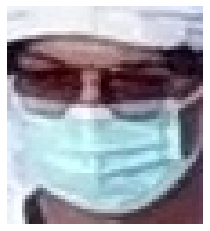

frame242_face_3
0.05610075974002615
(1.1400000000001, 1.6599999999999682)


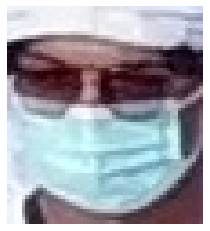

frame243_face_3
0.05357609725213286
(0.9300000000000637, 2.5399999999999636)


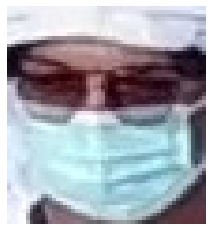

frame244_face_3
0.050601239107505025
(1.259999999999991, 0.2699999999999818)


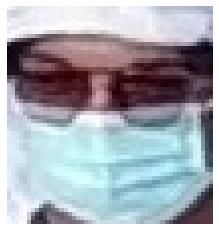

frame245_face_5
0.053326572586355314
(0.599999999999909, 3.0)


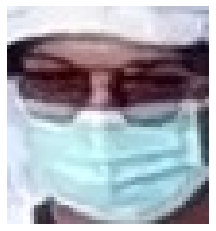

frame246_face_6
0.05018549844032261
(2.119999999999891, 1.0499999999999545)


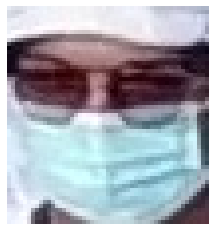

frame247_face_6
0.050719058414948615
(0.6400000000001, 1.830000000000041)


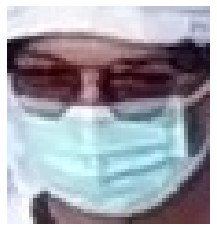

frame248_face_6
0.052953656144987815
(1.150000000000091, 2.3899999999999864)


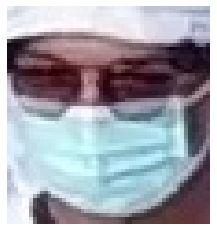

frame249_face_6
0.05332707982865936
(0.32999999999992724, 1.6100000000000136)


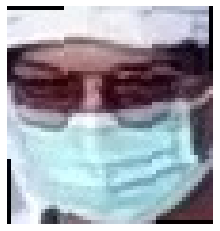

frame250_face_9
0.053187189890882
(1.1900000000000546, 1.240000000000009)


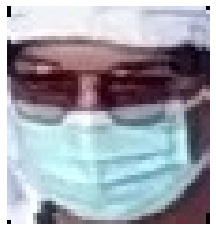

frame251_face_7
0.0539351318738398
(0.14000000000010004, 0.7899999999999636)


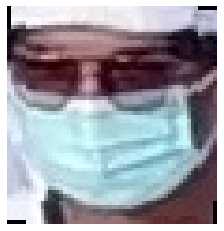

frame252_face_3
0.05438450156031538
(0.4800000000000182, 2.659999999999968)


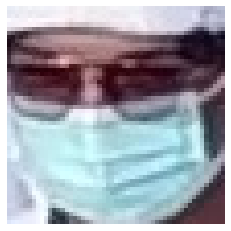

frame253_face_5
0.061967228784228
(1.8199999999999363, 1.8899999999999864)


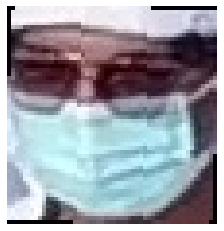

frame254_face_5
0.05229408900089527
(0.44000000000005457, 0.8999999999999773)


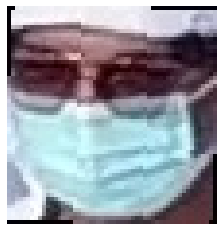

frame255_face_5
0.05159424930546341
(1.6600000000000819, 0.5)


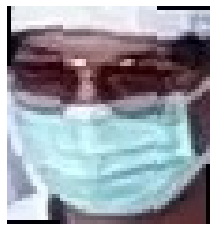

frame256_face_4
0.05397992968669829
(1.0499999999999545, 0.9199999999999591)


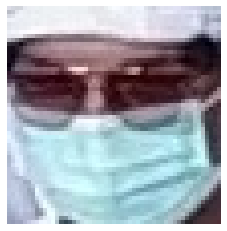

frame257_face_8
0.053753017391933944
(0.44000000000005457, 3.659999999999968)


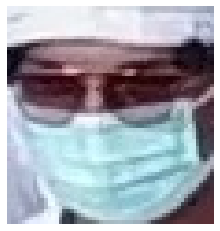

frame258_face_4
0.0567796083573292
(0.9200000000000728, 1.8400000000000318)


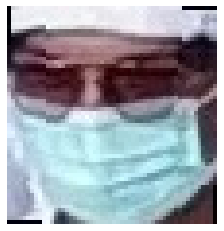

frame259_face_3
0.062219401204105074
(0.42000000000007276, 1.6199999999998909)


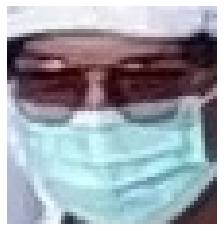

frame260_face_3
0.058738423089708
(1.240000000000009, 3.400000000000091)


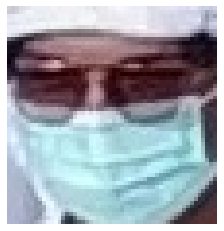

frame261_face_3
0.06048063813661886
(1.5, 3.519999999999982)


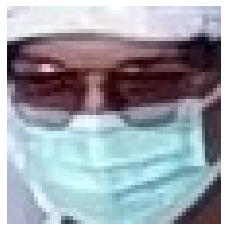

frame262_face_5
0.056380898849293426
(1.5199999999999818, 3.509999999999991)


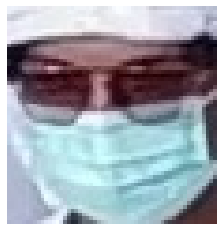

frame263_face_6
0.05611364488773851
(3.5399999999999636, 2.509999999999991)


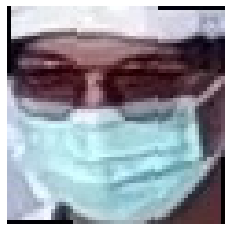

frame264_face_7
0.05567603134509691
(0.5599999999999454, 1.5)


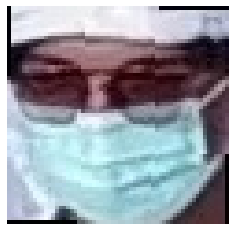

frame265_face_9
0.04830728908246684
(0.03999999999996362, 2.5)


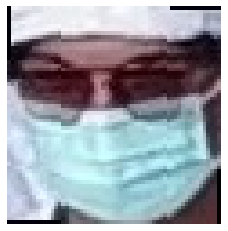

frame266_face_4
0.051288737856501565
(2.240000000000009, 1.4800000000000182)


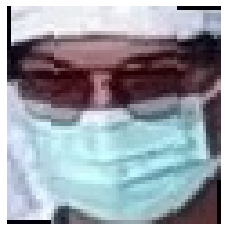

frame267_face_5
0.05273475578888742
(1.0399999999999636, 0.8599999999999)


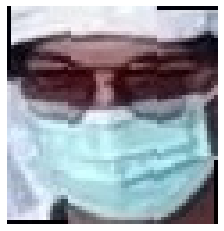

frame268_face_7
0.052367362472938384
(2.8599999999999, 0.41000000000008185)


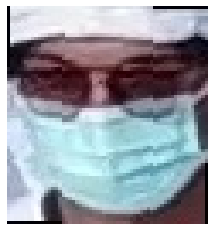

frame269_face_4
0.04831693641926649
(2.6700000000000728, 2.0499999999999545)


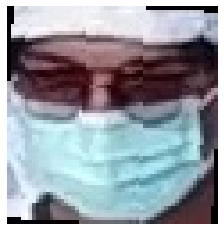

frame270_face_3
0.05087599328335424
(1.0399999999999636, 0.40000000000009095)


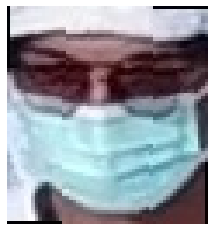

frame271_face_3
0.05105469640537086
(1.0199999999999818, 2.519999999999982)


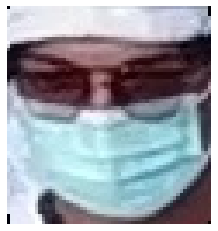

frame272_face_3
0.058236000744121275
(2.400000000000091, 3.740000000000009)


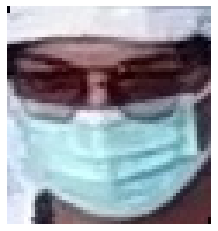

frame273_face_3
0.05405855008920335
(0.7799999999999727, 0.9600000000000364)


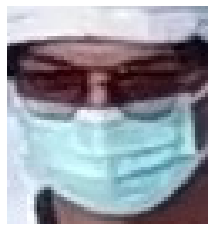

frame274_face_1
0.05452706659631035
(1.3599999999999, 1.0799999999999272)


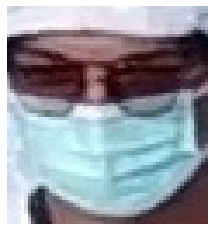

frame275_face_2
0.04907454094420416
(1.0599999999999454, 1.2000000000000455)


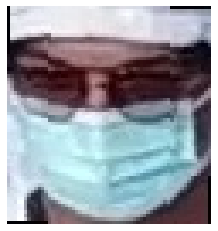

frame276_face_3
0.055169406983574865
(0.009999999999990905, 0.33999999999991815)


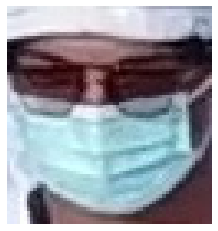

frame277_face_3
0.0731305052040171
(0.2799999999999727, 2.2899999999999636)


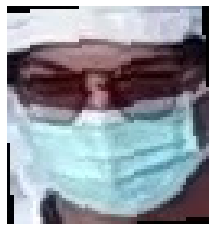

frame278_face_2
0.0494811308041605
(1.7100000000000364, 1.099999999999909)


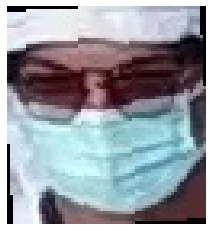

frame279_face_2
0.04935258304824641
(2.009999999999991, 2.25)


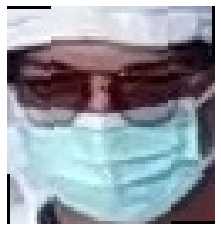

frame280_face_1
0.04829074127493005
(1.7000000000000455, 1.0)


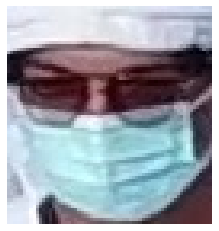

frame281_face_1
0.06037240727148452
(1.8299999999999272, 0.33999999999991815)


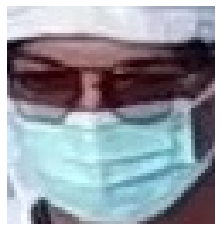

frame282_face_2
0.05104338146978937
(1.0499999999999545, 0.31999999999993634)


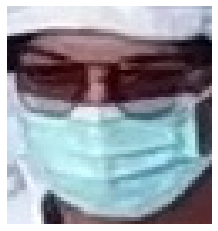

frame283_face_6
0.0623124773491569
(1.009999999999991, 1.1700000000000728)


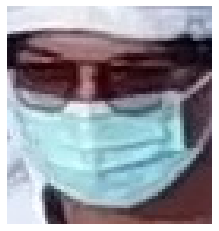

frame284_face_6
0.05906723572974837
(1.0699999999999363, 4.660000000000082)


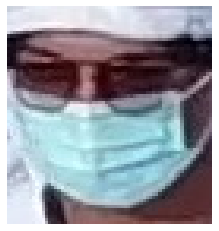

frame285_face_7
0.05965622202236609
(0.5799999999999272, 4.7000000000000455)


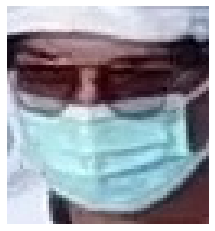

frame286_face_6
0.05202836727572058
(0.15000000000009095, 2.5799999999999272)


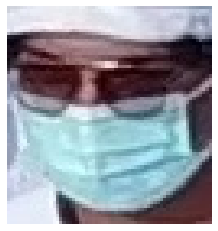

frame287_face_2
0.05622066731685493
(0.10999999999989996, 3.259999999999991)


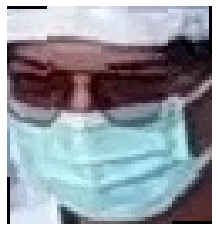

frame288_face_7
0.049101618580533746
(2.3299999999999272, 0.44000000000005457)


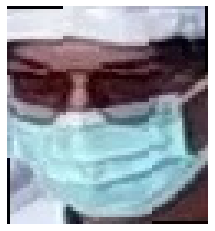

frame289_face_4
0.04960105190394326
(1.759999999999991, 0.849999999999909)


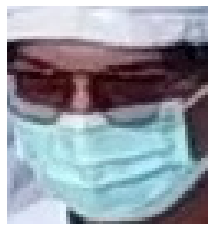

frame290_face_3
0.04700171612702386
(1.099999999999909, 0.09999999999990905)


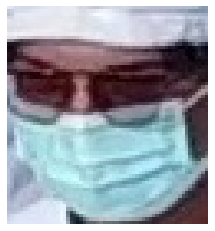

frame291_face_3
0.04624151662886555
(2.0799999999999272, 0.01999999999998181)


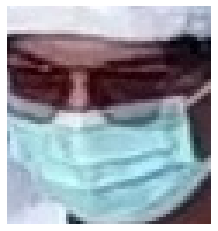

frame292_face_6
0.05058081291250782
(3.6800000000000637, 0.6300000000001091)


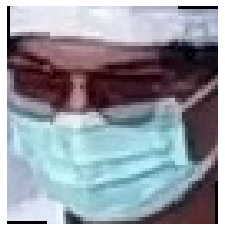

frame293_face_8
0.05784640769106242
(3.869999999999891, 0.35999999999989996)


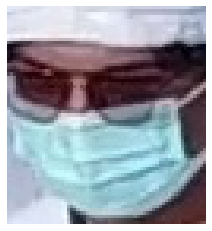

frame294_face_4
0.04845347748385176
(3.0599999999999454, 0.9100000000000819)


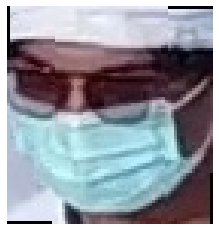

frame295_face_2
0.05301761414779582
(2.259999999999991, 2.1800000000000637)


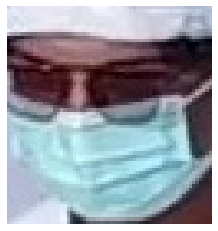

frame296_face_6
0.060352555212564774
(4.930000000000064, 0.6800000000000637)


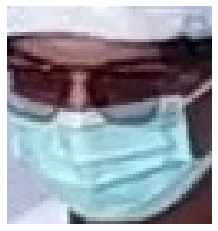

frame297_face_6
0.059216303702335105
(5.319999999999936, 0.6199999999998909)


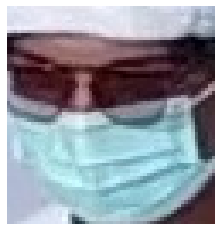

frame298_face_2
0.05730679184506593
(3.9600000000000364, 0.7100000000000364)


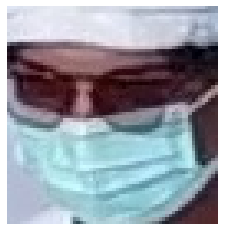

frame299_face_4
0.05225521491973051
(1.5, 2.630000000000109)


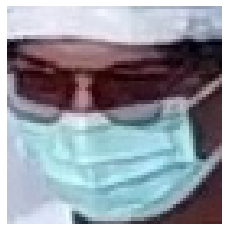

frame300_face_6
0.05603447351583468
(1.0499999999999545, 1.5499999999999545)


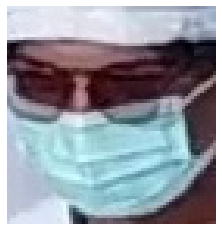

frame301_face_9
0.05739285429674257
(2.4500000000000455, 0.22000000000002728)


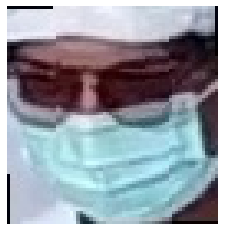

frame302_face_12
0.05565370132012948
(1.740000000000009, 2.009999999999991)


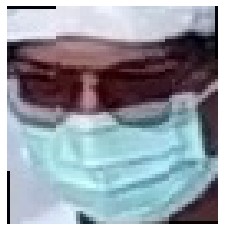

frame303_face_12
0.055439562805558285
(1.2899999999999636, 1.240000000000009)


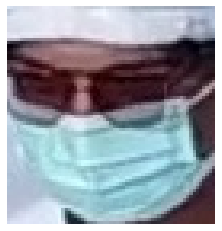

frame304_face_4
0.05131279069431216
(2.150000000000091, 0.9700000000000273)


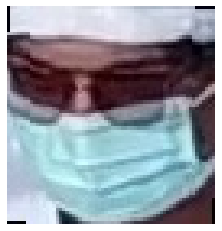

frame305_face_6
0.06285310847846015
(3.009999999999991, 0.7100000000000364)


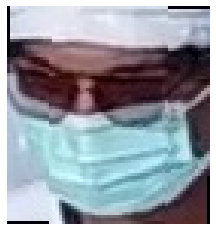

frame306_face_5
0.05568899377630798
(1.4300000000000637, 1.2799999999999727)


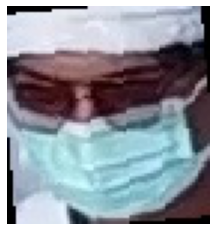

frame307_face_1
0.044783132572277506
(1.2999999999999545, 0.22000000000002728)


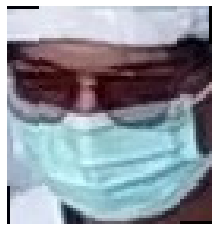

frame308_face_2
0.05638562179001605
(2.159999999999968, 0.2799999999999727)


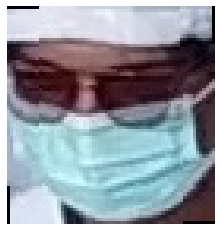

frame309_face_2
0.05596027751447863
(3.1100000000000136, 1.259999999999991)


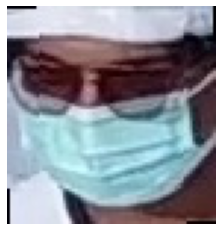

frame310_face_3
0.06678999582729428
(0.4700000000000273, 4.2000000000000455)


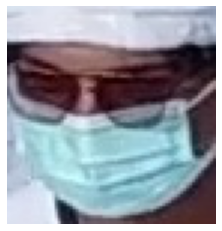

frame311_face_5
0.05234929732767657
(0.049999999999954525, 0.20000000000004547)


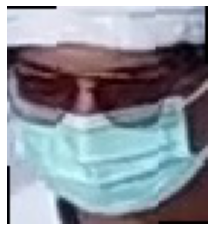

frame312_face_2
0.054570284056692286
(0.8899999999999864, 1.7699999999999818)


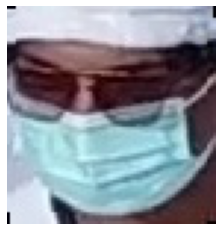

frame313_face_3
0.05685082046703127
(1.4500000000000455, 2.5399999999999636)


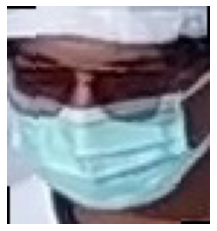

frame314_face_4
0.05783776830431486
(2.009999999999991, 4.309999999999945)


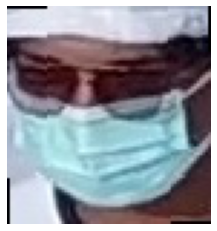

frame315_face_3
0.04867414354129307
(0.12999999999999545, 5.0)


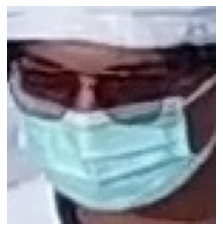

frame316_face_5
0.05661170218177447
(0.4800000000000182, 3.5)


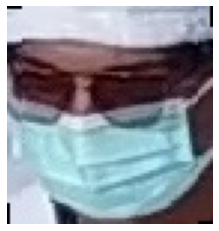

frame317_face_7
0.05336127488817133
(2.3799999999999955, 0.7999999999999545)


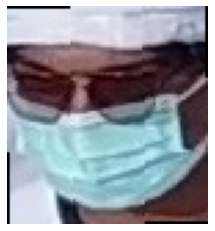

frame318_face_4
0.05096950225729413
(2.0, 4.25)


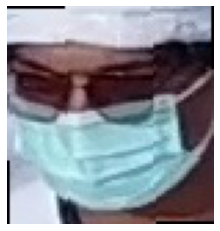

frame319_face_9
0.058448415150355815
(2.6200000000000045, 3.7000000000000455)


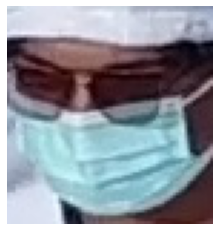

frame320_face_5
0.07210989541792368
(1.2300000000000182, 1.400000000000091)


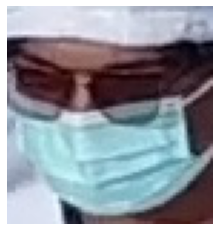

frame321_face_5
0.07027532685714666
(1.5499999999999545, 1.6900000000000546)


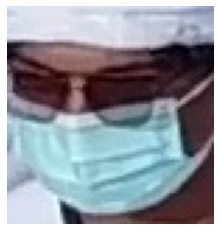

frame322_face_4
0.07072259977525985
(3.7100000000000364, 1.6099999999999)


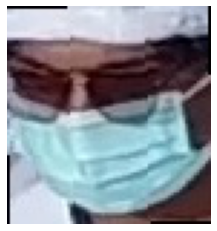

frame323_face_4
0.057907608319959336
(3.509999999999991, 2.2999999999999545)


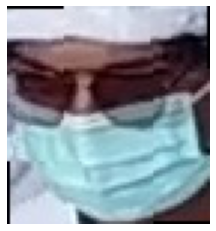

frame324_face_4
0.05507006706586992
(2.8500000000000227, 0.8199999999999363)


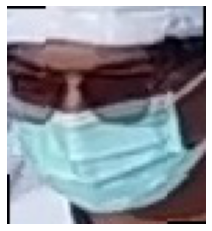

frame325_face_5
0.05626261197131477
(4.2000000000000455, 3.0599999999999454)


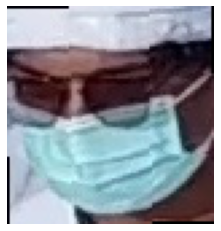

frame326_face_5
0.06057960549645047
(0.5599999999999454, 6.569999999999936)


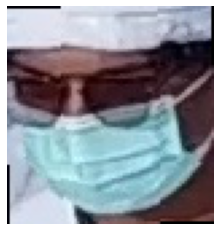

frame327_face_5
0.06056797152179749
(3.6900000000000546, 2.0799999999999272)


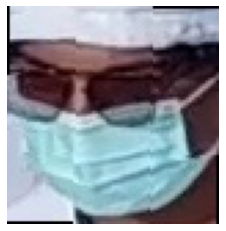

frame328_face_6
0.05432725336874622
(3.419999999999959, 1.9400000000000546)


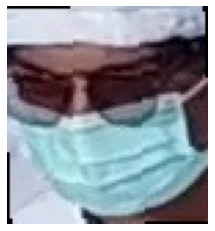

frame329_face_5
0.04580571170524739
(3.330000000000041, 1.4700000000000273)


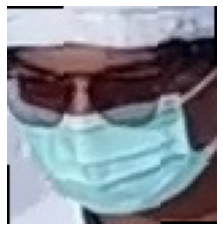

frame330_face_3
0.05028004117580176
(1.2300000000000182, 2.0)


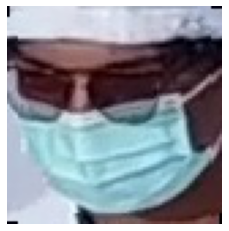

frame331_face_7
0.05620848442472082
(3.5, 3.3199999999999363)


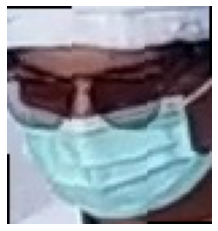

frame332_face_4
0.05192712865848981
(2.1399999999999864, 1.0899999999999181)


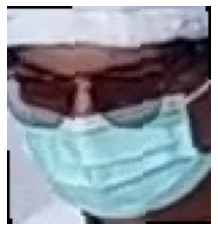

frame333_face_3
0.04890297809144073
(1.3500000000000227, 1.259999999999991)


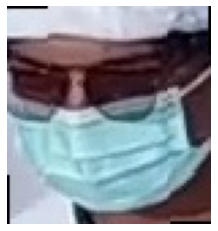

frame334_face_3
0.05503594037108217
(4.149999999999977, 3.2000000000000455)


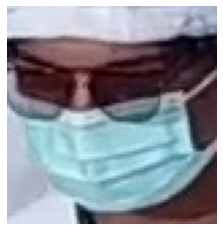

frame335_face_5
0.061463803157441266
(2.9600000000000364, 3.599999999999909)


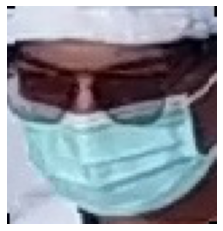

frame336_face_8
0.06293563611635489
(1.6299999999999955, 2.0799999999999272)


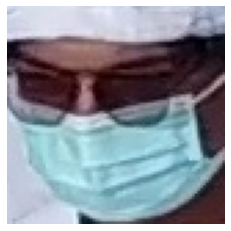

frame337_face_6
0.06506459672359277
(3.269999999999982, 0.2599999999999909)


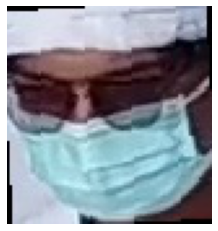

frame338_face_4
0.05765804578048628
(3.6299999999999955, 0.4800000000000182)


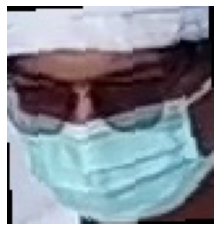

frame339_face_4
0.06404351989477197
(3.1299999999999955, 1.2200000000000273)


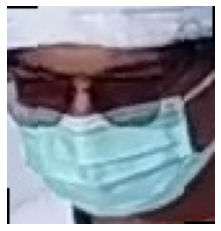

frame340_face_5
0.054087155841838985
(2.909999999999968, 0.7999999999999545)


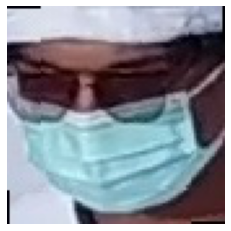

frame341_face_8
0.0689178977222259
(2.7200000000000273, 1.8199999999999363)


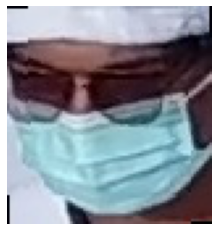

frame342_face_8
0.066452235800458
(5.330000000000041, 0.7000000000000455)


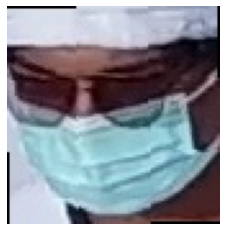

frame343_face_8
0.06265843532311521
(3.9400000000000546, 1.5699999999999363)


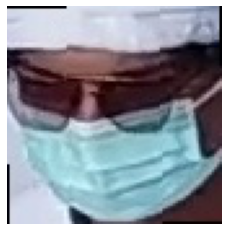

frame344_face_6
0.05180408489501909
(2.6399999999999864, 0.25)


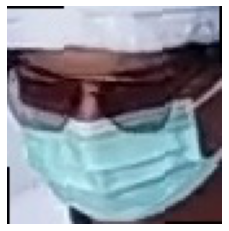

frame345_face_6
0.05578214299326889
(0.5499999999999545, 1.0799999999999272)


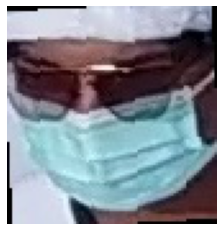

frame346_face_9
0.05784809032823057
(1.2300000000000182, 3.259999999999991)


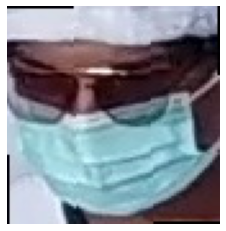

frame347_face_7
0.051653668227904403
(2.4700000000000273, 1.8199999999999363)


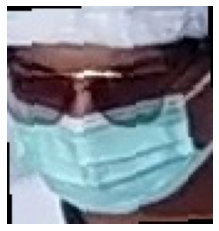

frame348_face_6
0.05296060855314444
(2.7100000000000364, 3.3900000000001)


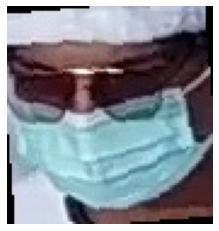

frame349_face_7
0.054450358382814756
(1.2300000000000182, 6.190000000000055)


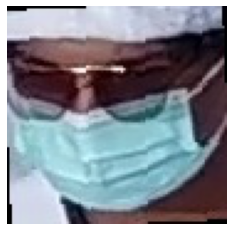

frame350_face_9
0.05617644705237956
(1.75, 4.0)


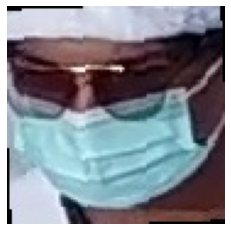

frame351_face_9
0.05659752812186958
(2.3700000000000045, 4.819999999999936)


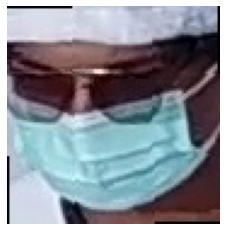

frame352_face_8
0.05837199294959983
(4.080000000000041, 3.7000000000000455)


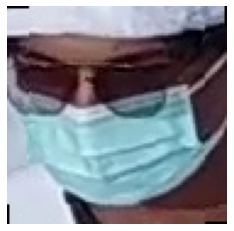

frame353_face_10
0.05826828294222741
(4.07000000000005, 6.099999999999909)


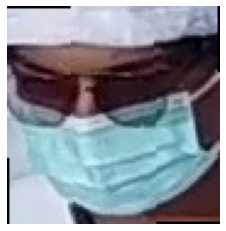

frame354_face_9
0.05674303241822032
(4.059999999999945, 2.5)


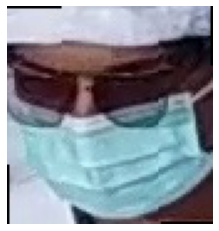

frame355_face_10
0.05749645354678834
(3.0499999999999545, 0.900000000000091)


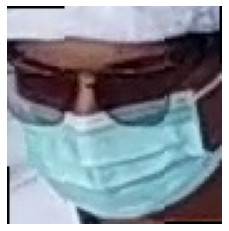

frame356_face_13
0.0658863132901496
(3.730000000000018, 0.7599999999999909)


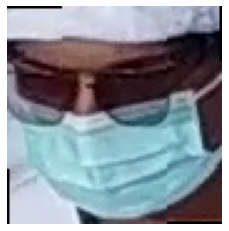

frame357_face_13
0.0680003514116615
(5.3700000000000045, 1.5799999999999272)


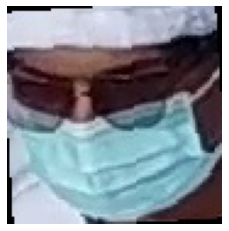

frame358_face_11
0.06243686441881091
(5.399999999999977, 0.2799999999999727)


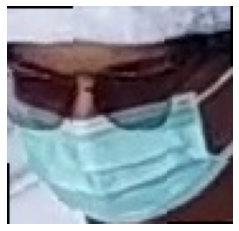

frame359_face_13
0.06380426557058638
(5.42999999999995, 1.1400000000001)


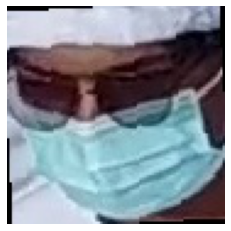

frame360_face_13
0.05371436866900936
(1.4700000000000273, 0.20000000000004547)


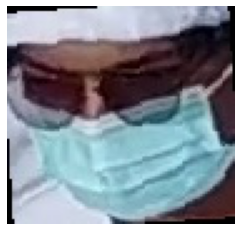

frame361_face_14
0.06059021140010068
(1.32000000000005, 0.049999999999954525)


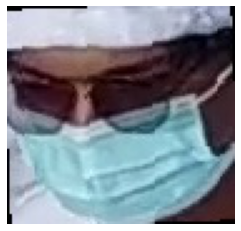

frame362_face_12
0.05673833832471009
(6.169999999999959, 1.2999999999999545)


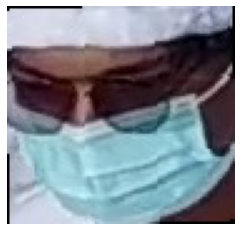

frame363_face_12
0.060932191855678663
(5.470000000000027, 2.630000000000109)


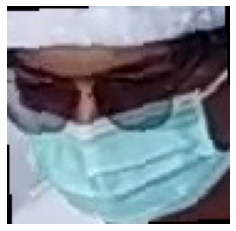

frame364_face_12
0.0493543296233353
(4.590000000000032, 2.349999999999909)


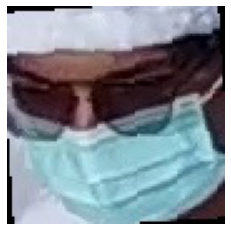

frame365_face_11
0.05752144028416828
(5.710000000000036, 4.059999999999945)


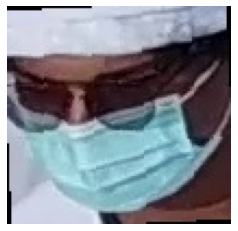

frame366_face_12
0.05850384249354812
(3.9400000000000546, 3.2200000000000273)


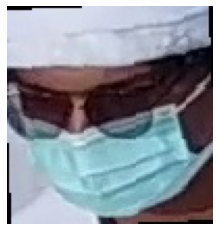

frame367_face_15
0.05255981704173962
(3.3500000000000227, 1.5599999999999454)


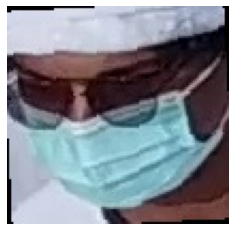

frame368_face_12
0.06374950819702785
(4.9500000000000455, 4.990000000000009)


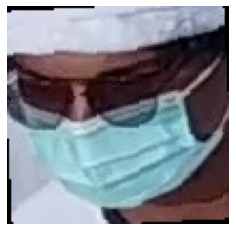

frame369_face_12
0.06576198222443552
(3.159999999999968, 5.880000000000109)


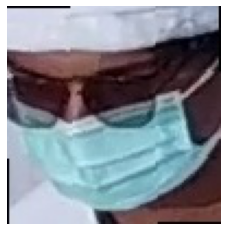

frame370_face_13
0.06143197296421932
(6.3700000000000045, 5.059999999999945)


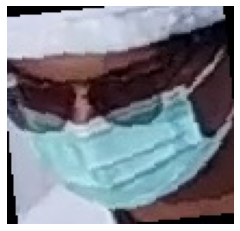

frame371_face_12
0.05795109039429758
(6.580000000000041, 6.339999999999918)


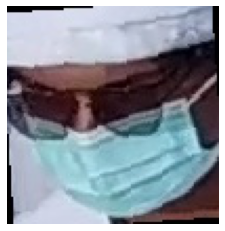

frame372_face_9
0.054897871571710666
(5.82000000000005, 2.0499999999999545)


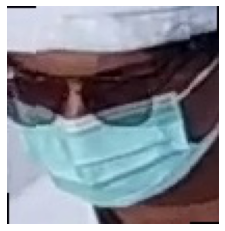

frame373_face_8
0.05792429161655521
(9.740000000000009, 7.7000000000000455)


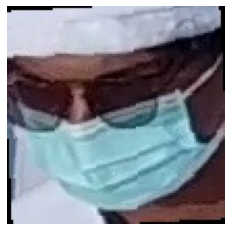

frame374_face_5
0.058969316692883966
(8.139999999999986, 5.2999999999999545)


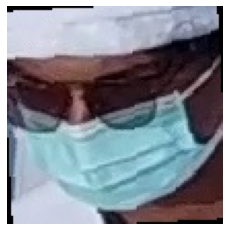

frame375_face_4
0.05633665498386753
(7.580000000000041, 6.059999999999945)


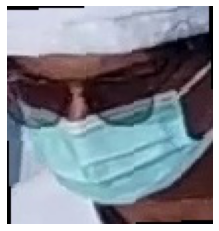

frame376_face_7
0.05655816550914616
(5.389999999999986, 9.279999999999973)


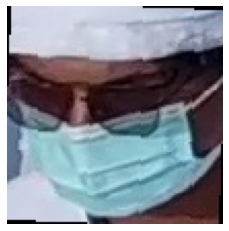

frame377_face_7
0.0670302695972862
(4.809999999999945, 2.0699999999999363)


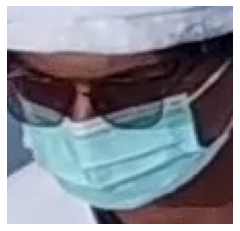

frame378_face_7
0.06971253477147454
(7.269999999999982, 4.7000000000000455)


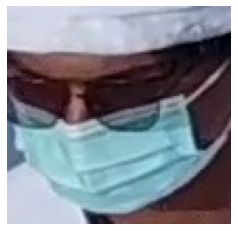

frame379_face_6
0.08293883609876729
(11.100000000000023, 2.2999999999999545)


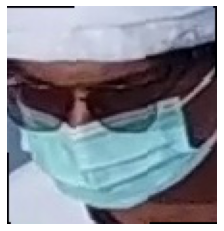

frame380_face_2
0.0618648075678534
(6.919999999999959, 6.900000000000091)


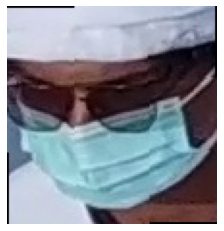

frame381_face_2
0.06223881023208799
(7.360000000000014, 5.970000000000027)


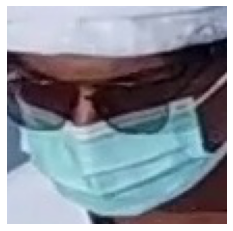

frame382_face_7
0.06421372502487066
(7.5, 1.6800000000000637)


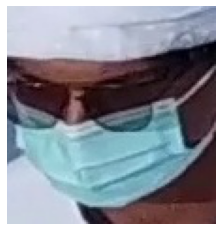

frame383_face_5
0.05680475276904251
(9.5, 7.559999999999945)


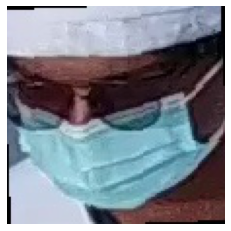

frame384_face_3
0.05857640800924879
(8.990000000000009, 6.279999999999973)


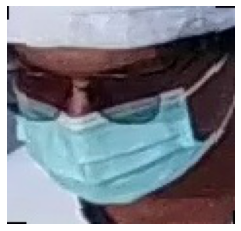

frame385_face_3
0.05516078645161704
(10.049999999999955, 9.0)


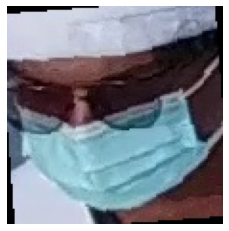

frame386_face_4
0.05051789062571943
(8.769999999999982, 6.480000000000018)


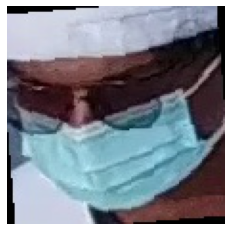

frame387_face_4
0.05177787471646511
(8.539999999999964, 5.920000000000073)


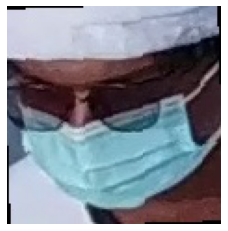

frame388_face_2
0.054788675982176405
(8.350000000000023, 6.569999999999936)


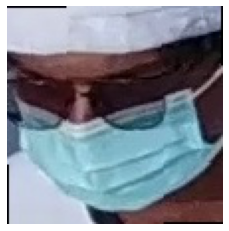

frame389_face_5
0.05461913591923262
(11.45999999999998, 5.1400000000001)


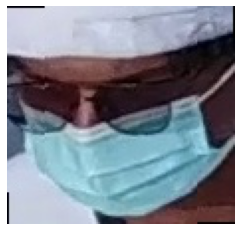

frame390_face_8
0.06184617588217034
(8.569999999999993, 2.7100000000000364)


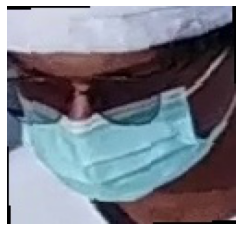

frame391_face_3
0.07485739006306247
(10.069999999999993, 10.36999999999989)


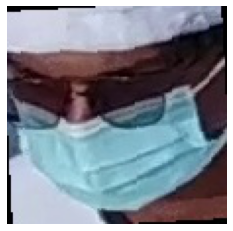

frame392_face_3
0.056987525778406045
(12.579999999999984, 5.039999999999964)


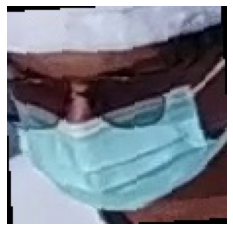

frame393_face_3
0.05629641481028236
(12.629999999999995, 5.069999999999936)


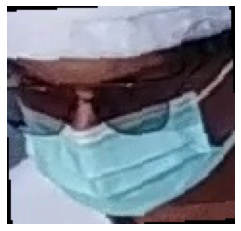

frame394_face_5
0.05657456706443653
(10.410000000000025, 2.4400000000000546)


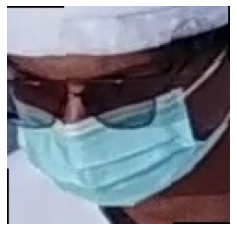

frame395_face_7
0.06467547521675632
(14.199999999999989, 8.809999999999945)


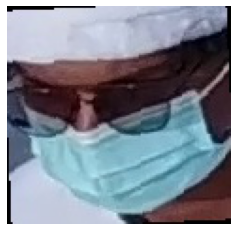

frame396_face_2
0.05732175729101374
(9.509999999999991, 4.019999999999982)


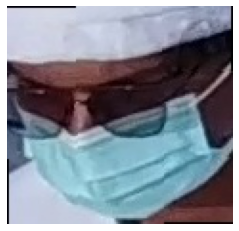

frame397_face_8
0.06832298803205716
(12.819999999999993, 2.230000000000018)


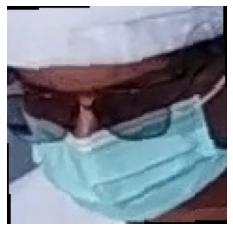

frame398_face_4
0.05948310029966042
(10.079999999999984, 0.6199999999998909)


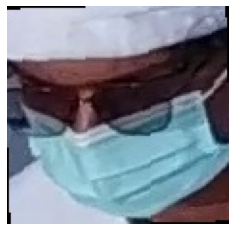

frame399_face_4
0.060456571209351884
(10.639999999999986, 2.2799999999999727)


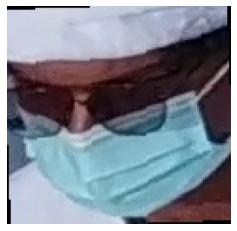

frame400_face_8
0.0604007215455018
(13.519999999999982, 1.900000000000091)


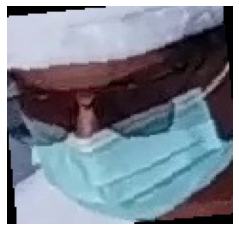

frame401_face_13
0.05336318441910137
(11.220000000000027, 0.21000000000003638)


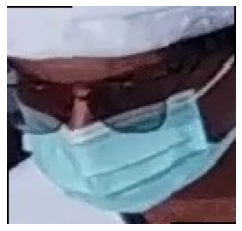

frame402_face_7
0.051895040400578574
(12.120000000000005, 4.990000000000009)


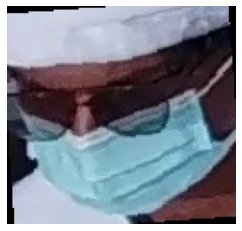

frame403_face_5
0.05186667356647767
(11.45999999999998, 3.230000000000018)


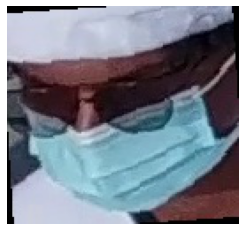

frame404_face_12
0.0460284456660488
(9.800000000000011, 5.480000000000018)


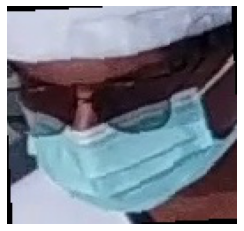

frame405_face_12
0.04829076033857371
(10.850000000000023, 5.699999999999818)


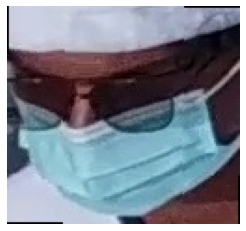

frame406_face_12
0.049702637078859135
(15.430000000000007, 3.150000000000091)


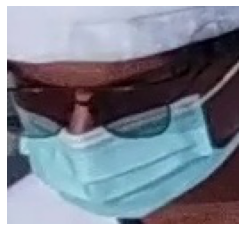

frame407_face_12
0.06223917879818108
(15.680000000000007, 1.3200000000001637)


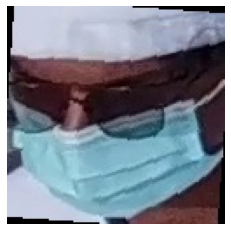

frame408_face_10
0.07050914192827751
(18.639999999999986, 1.8299999999999272)


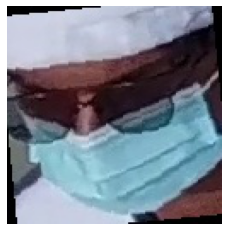

frame409_face_7
0.050113803131193735
(11.800000000000011, 3.1599999999998545)


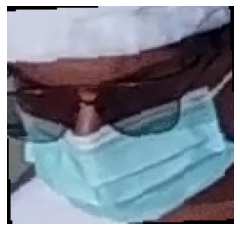

frame410_face_11
0.0530940993788247
(14.719999999999999, 0.5)


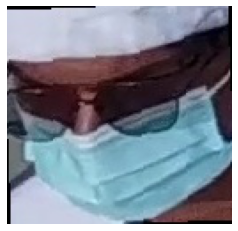

frame411_face_11
0.053497156162168324
(14.22999999999999, 0.6100000000001273)


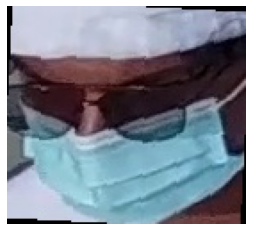

frame412_face_12
0.05665973791901291
(14.310000000000002, 3.3299999999999272)


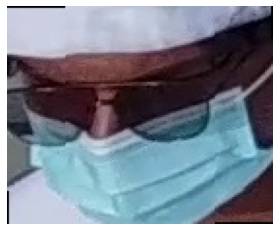

frame413_face_11
0.05619302083968292
(11.52000000000001, 3.0)


In [ ]:
import matplotlib.image as mpimg
for i,j,k in true_positives:
  img = mpimg.imread(project_dir +"/extracted_faces/" + challenge_type + "/"+ i + ".jpg")
  plt.axis('Off')
  plt.imshow(img)
  plt.show()
  print(i)
  print(k)
  print(j)

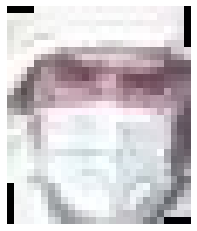

frame0_face_1
0.06441270985025682
(457.8900000000001, 86.04999999999995)


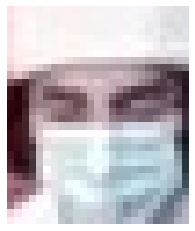

frame1_face_2
0.06078501798030245
(195.8599999999999, 53.57000000000005)


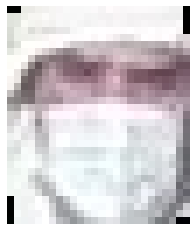

frame1_face_1
0.0642269290871107
(457.8599999999999, 86.57000000000005)


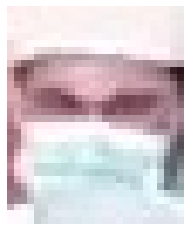

frame1_face_3
0.06549262001579137
(585.8599999999999, 45.57000000000005)


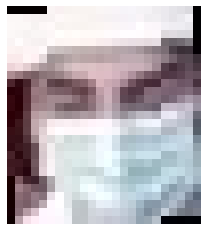

frame2_face_2
0.0670885487810935
(195.83999999999992, 54.08000000000004)


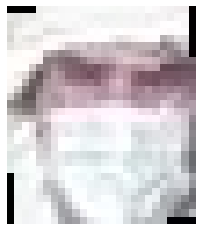

frame2_face_1
0.06733943475891635
(457.8399999999999, 87.08000000000004)


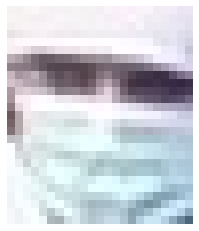

frame3_face_3
0.06502508644963301
(89.19000000000005, 54.60000000000002)


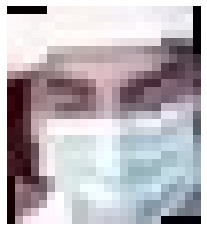

frame3_face_2
0.06650059167230005
(196.80999999999995, 55.60000000000002)


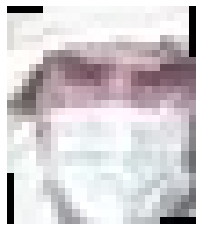

frame3_face_1
0.06713785374960757
(458.80999999999995, 88.60000000000002)


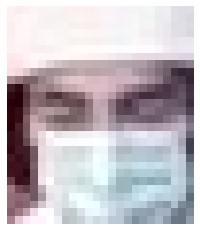

frame4_face_2
0.06551328438720261
(197.20000000000005, 57.35000000000002)


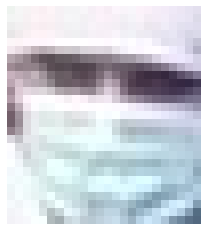

frame4_face_4
0.06668545243956037
(87.79999999999995, 56.35000000000002)


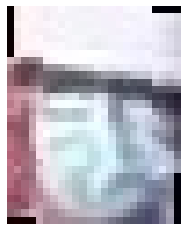

frame4_face_3
0.06987318971910428
(33.799999999999955, 88.35000000000002)


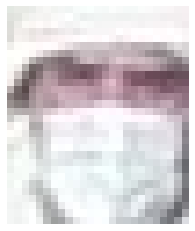

frame4_face_1
0.07584713818401001
(460.20000000000005, 88.35000000000002)


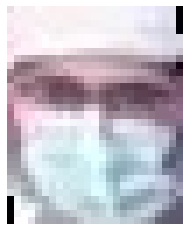

frame5_face_1
0.06120233449171619
(161.41000000000008, 75.10000000000002)


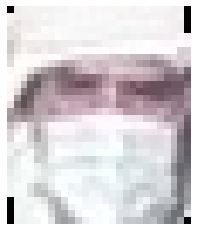

frame5_face_2
0.06954006779595434
(459.5899999999999, 88.10000000000002)


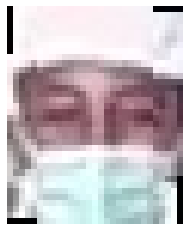

frame6_face_2
0.05949547295315405
(276.78999999999996, 6.519999999999982)


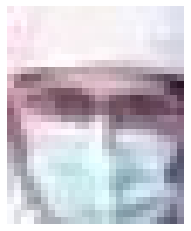

frame6_face_1
0.06568954615213818
(161.21000000000004, 76.51999999999998)


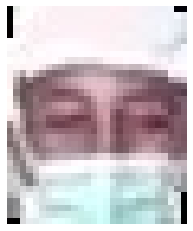

frame7_face_1
0.05660563028365517
(278.0899999999999, 9.240000000000009)


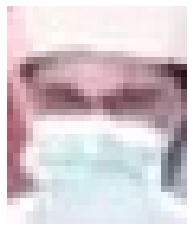

frame7_face_3
0.0628806860515374
(592.0899999999999, 48.24000000000001)


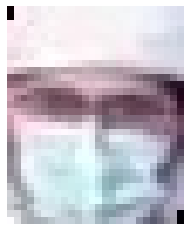

frame7_face_2
0.07070523401760742
(157.91000000000008, 76.24000000000001)


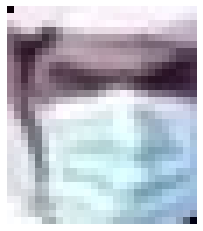

frame8_face_1
0.06733032917021986
(311.5, 59.889999999999986)


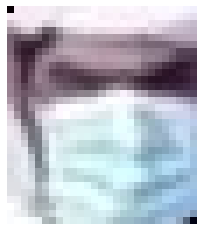

frame9_face_1
0.06876687577564344
(310.0799999999999, 60.549999999999955)


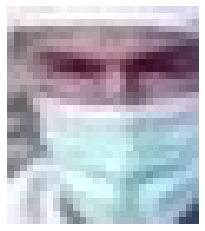

frame10_face_5
0.05766844202608867
(396.4100000000001, 1.2999999999999545)


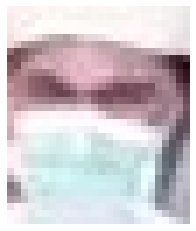

frame10_face_4
0.05918786322190106
(599.5899999999999, 47.700000000000045)


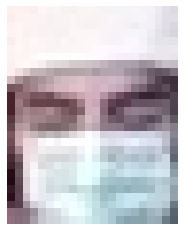

frame10_face_2
0.06031930949958664
(204.58999999999992, 64.70000000000005)


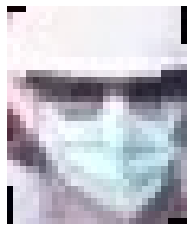

frame10_face_3
0.0614530256917688
(309.5899999999999, 36.700000000000045)


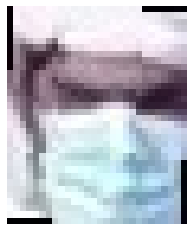

frame10_face_1
0.06212337484128261
(307.4100000000001, 59.700000000000045)


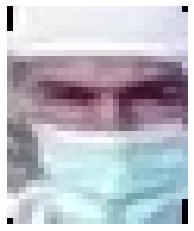

frame11_face_3
0.05702912261410087
(397.1500000000001, 1.1499999999999773)


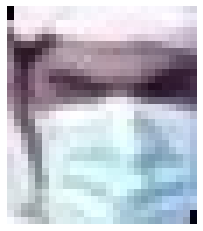

frame11_face_1
0.061147801508018684
(305.1500000000001, 59.14999999999998)


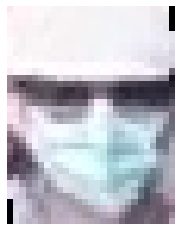

frame11_face_2
0.06509185878776169
(311.8499999999999, 36.14999999999998)


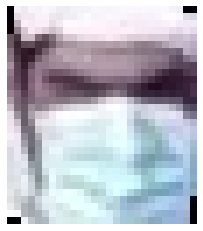

frame12_face_1
0.058899080659965186
(303.8900000000001, 58.60000000000002)


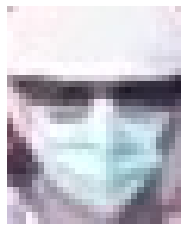

frame12_face_4
0.06580667896338355
(312.1099999999999, 35.60000000000002)


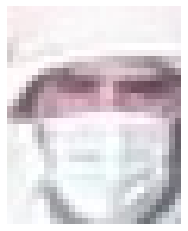

frame12_face_2
0.06894191894369106
(463.1099999999999, 85.60000000000002)


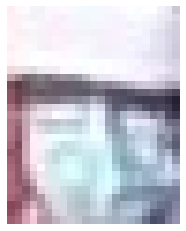

frame12_face_3
0.07100616433080176
(25.8900000000001, 94.60000000000002)


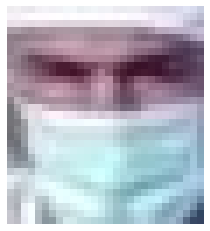

frame13_face_3
0.055662181609921646
(395.23, 1.8700000000000045)


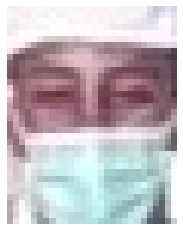

frame13_face_2
0.05873220233142473
(282.77, 5.8700000000000045)


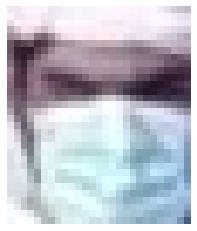

frame13_face_1
0.0633074255025784
(302.23, 57.129999999999995)


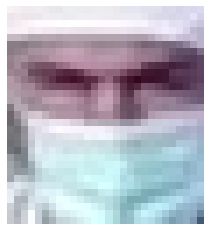

frame14_face_7
0.055195662620773245
(395.6700000000001, 2.17999999999995)


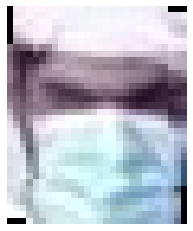

frame14_face_2
0.05935565019292921
(301.6700000000001, 56.82000000000005)


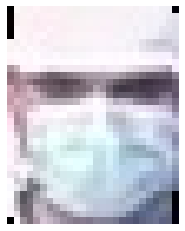

frame14_face_4
0.0624455435549236
(84.32999999999993, 62.82000000000005)


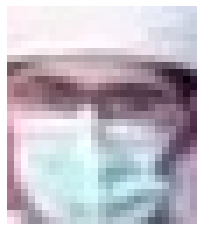

frame14_face_6
0.06576211173285074
(146.67000000000007, 73.82000000000005)


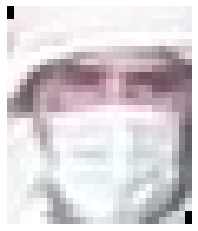

frame14_face_5
0.06716857215569327
(465.3299999999999, 85.82000000000005)


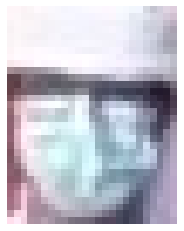

frame14_face_1
0.07242229554585311
(23.670000000000073, 86.82000000000005)


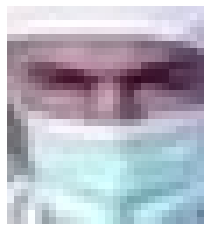

frame15_face_7
0.055918416301986795
(395.1099999999999, 1.8999999999999773)


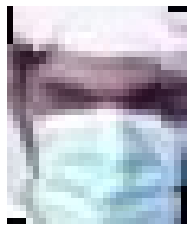

frame15_face_2
0.0600250084709647
(301.1099999999999, 57.10000000000002)


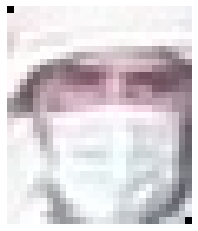

frame15_face_5
0.06629234067587364
(465.8900000000001, 86.10000000000002)


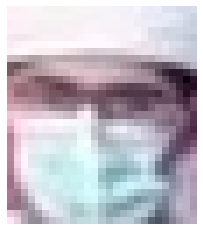

frame15_face_6
0.0666453137826839
(146.1099999999999, 74.10000000000002)


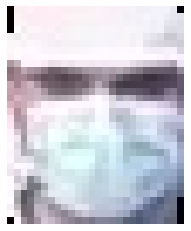

frame15_face_4
0.06856193937757415
(84.8900000000001, 63.10000000000002)


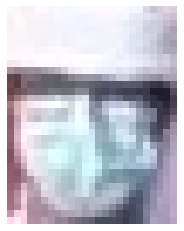

frame15_face_1
0.07102008445137764
(23.1099999999999, 87.10000000000002)


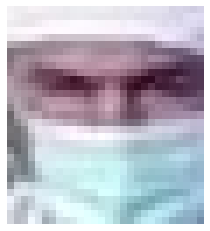

frame16_face_6
0.05352708127377459
(396.93000000000006, 3.2000000000000455)


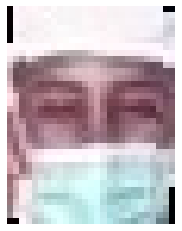

frame16_face_7
0.062269079929157534
(280.06999999999994, 6.2000000000000455)


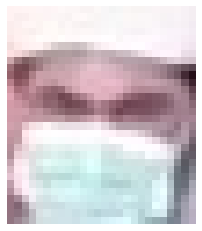

frame16_face_4
0.06250148067654426
(600.0699999999999, 46.799999999999955)


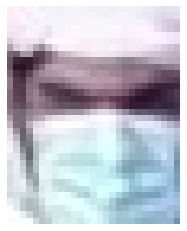

frame16_face_1
0.06432076923553443
(301.93000000000006, 56.799999999999955)


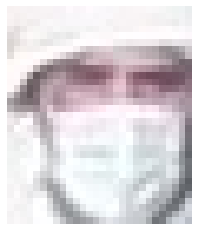

frame16_face_3
0.06525978775507923
(465.06999999999994, 85.79999999999995)


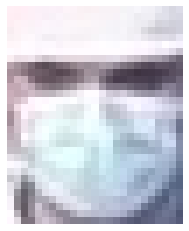

frame16_face_5
0.07097082483302941
(85.06999999999994, 61.799999999999955)


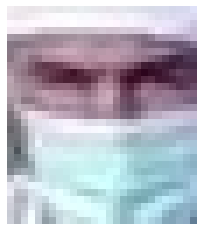

frame17_face_2
0.05444522783480743
(397.25, 5.669999999999959)


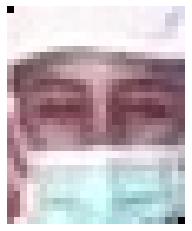

frame17_face_7
0.06069200190275481
(278.75, 4.669999999999959)


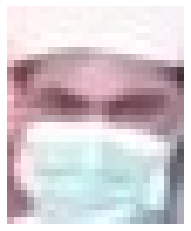

frame17_face_5
0.06258437986962018
(599.75, 46.33000000000004)


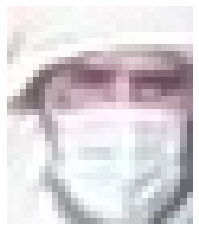

frame17_face_4
0.06261454600551475
(464.75, 86.33000000000004)


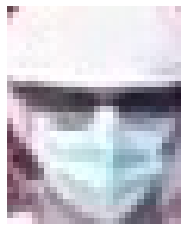

frame17_face_6
0.06493982785278918
(314.75, 34.33000000000004)


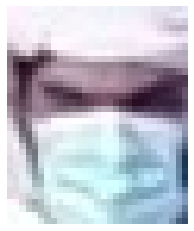

frame17_face_1
0.06545286400581596
(303.25, 56.33000000000004)


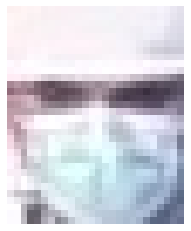

frame17_face_3
0.06581393201460195
(82.75, 63.33000000000004)


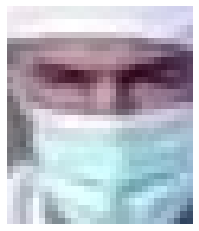

frame18_face_1
0.05862152069713
(399.24, 8.080000000000041)


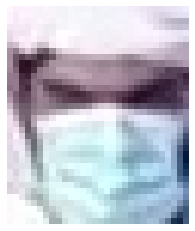

frame18_face_2
0.061315499907395266
(305.24, 55.91999999999996)


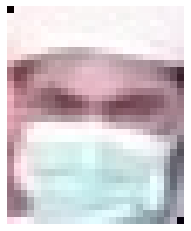

frame18_face_5
0.0624240445114681
(599.76, 47.91999999999996)


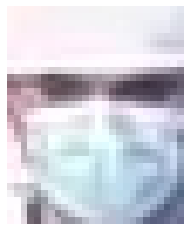

frame18_face_4
0.06290477295692865
(80.75999999999999, 62.91999999999996)


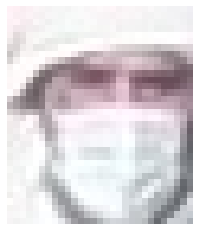

frame18_face_3
0.0633509404997703
(464.76, 87.91999999999996)


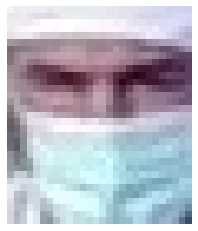

frame19_face_1
0.05592665948791553
(399.22, 7.490000000000009)


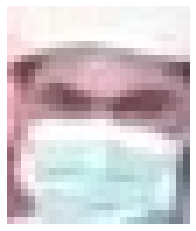

frame19_face_4
0.05995860089174132
(598.78, 49.50999999999999)


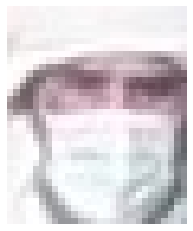

frame19_face_2
0.06593349793338243
(465.78, 89.50999999999999)


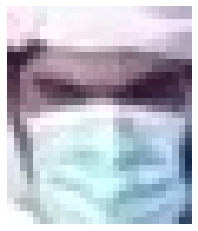

frame19_face_3
0.06862048039624369
(305.22, 57.50999999999999)


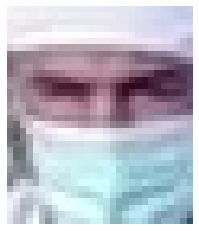

frame20_face_2
0.05399087110380818
(400.21000000000004, 6.899999999999977)


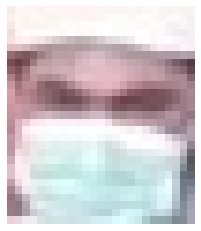

frame20_face_3
0.05774072005113362
(599.79, 51.10000000000002)


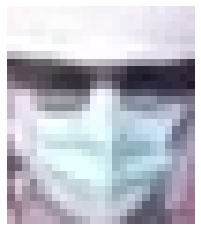

frame20_face_4
0.05793016479090807
(316.78999999999996, 35.10000000000002)


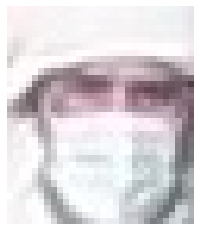

frame20_face_1
0.06190780203017865
(464.78999999999996, 90.10000000000002)


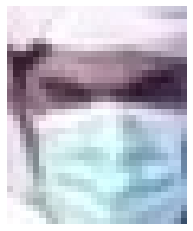

frame20_face_5
0.06873323907748896
(308.21000000000004, 57.10000000000002)


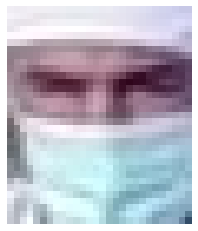

frame21_face_2
0.054495628200050716
(399.3299999999999, 6.639999999999986)


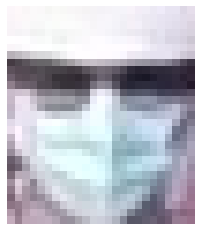

frame21_face_4
0.05738916101960523
(316.6700000000001, 35.360000000000014)


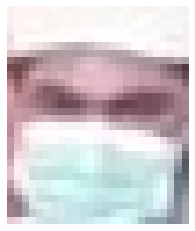

frame21_face_3
0.06237261898688229
(599.6700000000001, 51.360000000000014)


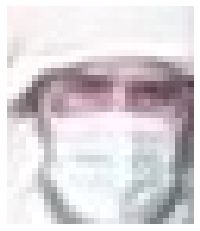

frame21_face_1
0.06253398514452135
(464.6700000000001, 90.36000000000001)


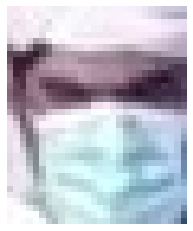

frame21_face_5
0.06853780790750452
(308.3299999999999, 57.360000000000014)


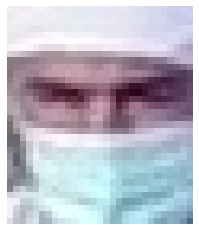

frame22_face_2
0.052375169667919996
(400.6500000000001, 3.8799999999999955)


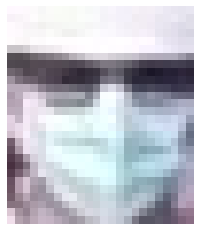

frame22_face_1
0.061682390360682904
(315.3499999999999, 36.120000000000005)


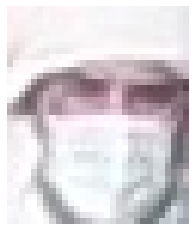

frame22_face_4
0.06279320416427459
(464.3499999999999, 91.12)


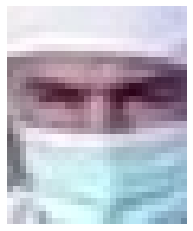

frame23_face_3
0.05360650974788428
(401.06999999999994, 1.1200000000000045)


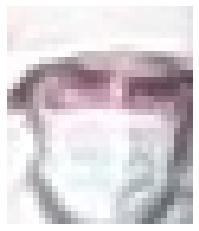

frame23_face_5
0.06443107297501849
(464.93000000000006, 91.88)


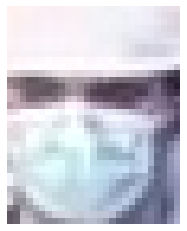

frame23_face_4
0.06727009250604477
(72.93000000000006, 65.88)


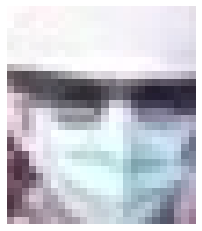

frame23_face_1
0.07454037403790836
(312.93000000000006, 37.879999999999995)


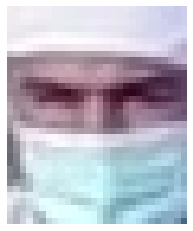

frame24_face_1
0.05321605799175777
(401.94000000000005, 1.6399999999999864)


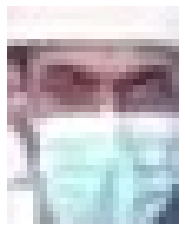

frame24_face_5
0.05693197926666094
(417.05999999999995, 34.639999999999986)


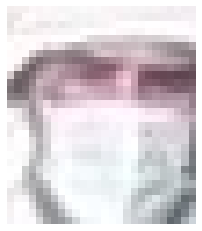

frame24_face_4
0.06450573048602826
(465.05999999999995, 93.63999999999999)


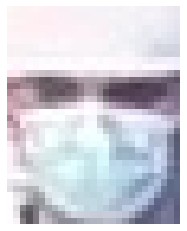

frame24_face_3
0.06769075789020906
(67.05999999999995, 68.63999999999999)


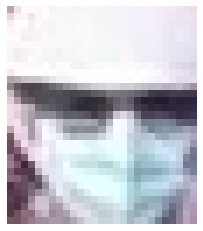

frame24_face_2
0.06884511718763842
(311.05999999999995, 39.639999999999986)


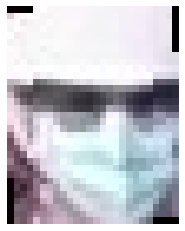

frame25_face_5
0.06073215140531063
(310.19000000000005, 39.39999999999998)


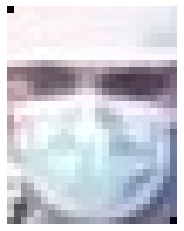

frame25_face_2
0.061582135066164834
(65.19000000000005, 71.39999999999998)


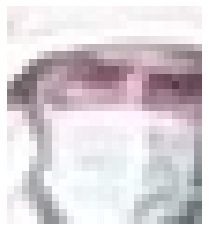

frame25_face_1
0.06217398351333081
(464.19000000000005, 95.39999999999998)


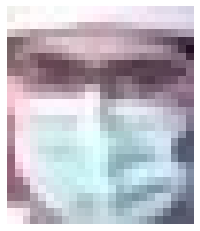

frame25_face_3
0.06360739096644852
(162.80999999999995, 79.39999999999998)


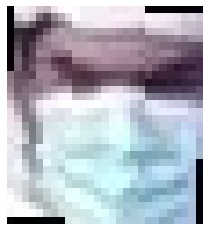

frame25_face_4
0.06489838781155233
(320.80999999999995, 61.39999999999998)


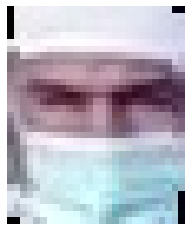

frame26_face_5
0.05508522536446825
(406.19000000000005, 5.600000000000023)


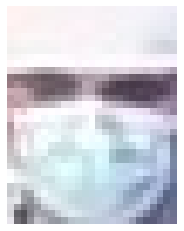

frame26_face_3
0.06139022921429371
(62.809999999999945, 72.60000000000002)


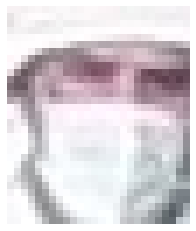

frame26_face_4
0.06312127729488715
(464.80999999999995, 91.60000000000002)


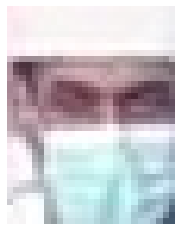

frame26_face_1
0.06330246704342746
(412.80999999999995, 37.60000000000002)


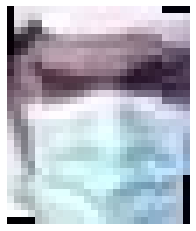

frame26_face_2
0.06835492854076275
(323.19000000000005, 60.60000000000002)


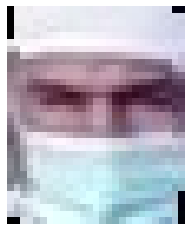

frame27_face_5
0.05644577151412067
(406.56999999999994, 5.7999999999999545)


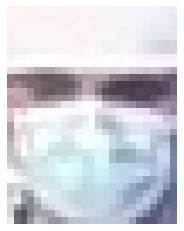

frame27_face_2
0.060478498460645014
(62.430000000000064, 72.79999999999995)


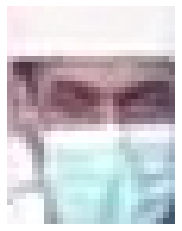

frame27_face_1
0.06323798696652805
(412.43000000000006, 37.799999999999955)


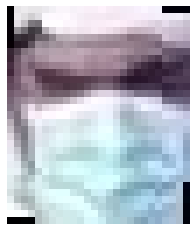

frame27_face_3
0.06518998942483523
(323.56999999999994, 60.799999999999955)


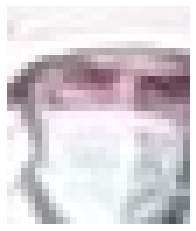

frame27_face_4
0.06655760112760267
(464.43000000000006, 92.79999999999995)


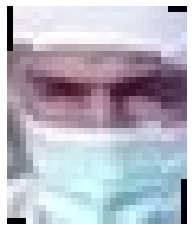

frame28_face_1
0.05353505935154501
(408.6500000000001, 4.0)


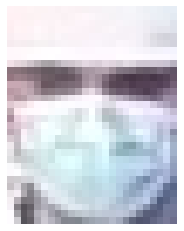

frame28_face_6
0.056456383495712026
(60.34999999999991, 72.0)


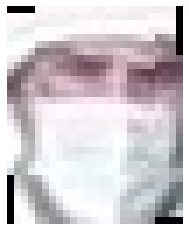

frame28_face_4
0.06333621345792795
(466.3499999999999, 90.0)


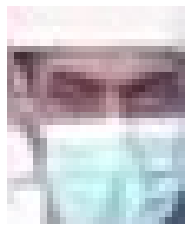

frame28_face_3
0.06341343765233609
(412.3499999999999, 37.0)


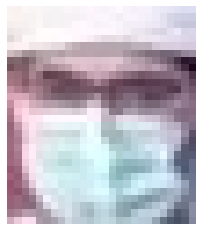

frame28_face_2
0.06461981023769248
(170.6500000000001, 79.0)


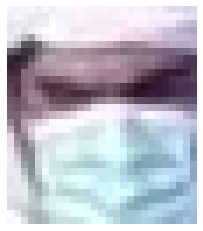

frame28_face_5
0.06772994099438656
(327.6500000000001, 62.0)


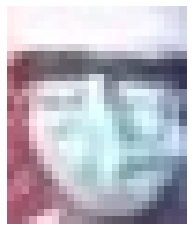

frame28_face_7
0.0723382539167744
(34.65000000000009, 97.0)


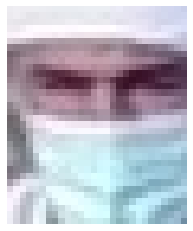

frame29_face_7
0.055551934952700055
(410.73, 2.2000000000000455)


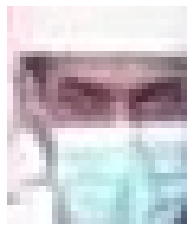

frame29_face_4
0.059032070182940766
(410.27, 36.200000000000045)


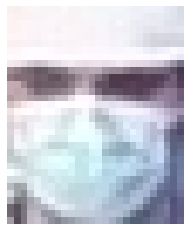

frame29_face_3
0.06172206521819845
(60.26999999999998, 72.20000000000005)


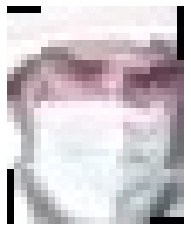

frame29_face_1
0.062467239207239955
(467.27, 89.20000000000005)


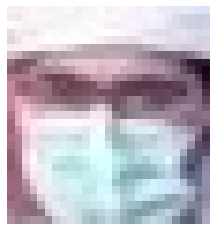

frame29_face_2
0.06500906076687774
(173.73000000000002, 80.20000000000005)


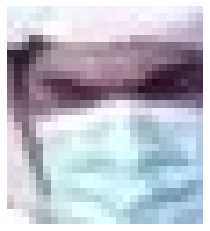

frame29_face_5
0.06613453993777885
(331.73, 62.200000000000045)


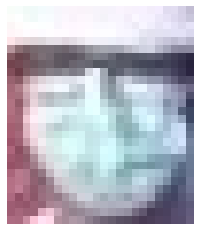

frame29_face_6
0.07268171607471752
(34.73000000000002, 96.20000000000005)


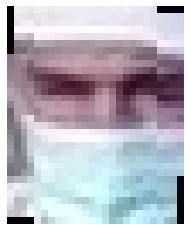

frame30_face_4
0.05421054544382198
(411.80999999999995, 3.3999999999999773)


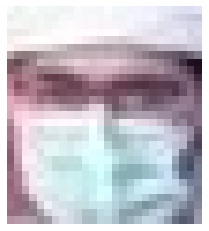

frame30_face_5
0.05971607500385334
(175.80999999999995, 80.39999999999998)


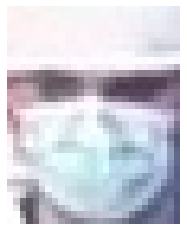

frame30_face_2
0.06012157942222285
(57.190000000000055, 71.39999999999998)


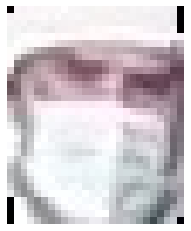

frame30_face_1
0.07100609219247633
(468.19000000000005, 89.39999999999998)


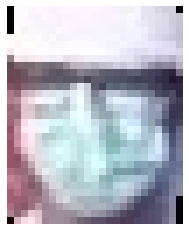

frame30_face_3
0.07510949439290893
(34.809999999999945, 95.39999999999998)


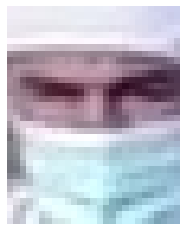

frame31_face_5
0.05291543667581511
(413.06999999999994, 1.080000000000041)


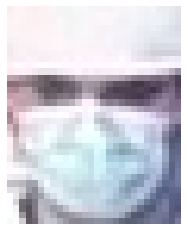

frame31_face_4
0.06439616825491168
(55.930000000000064, 70.08000000000004)


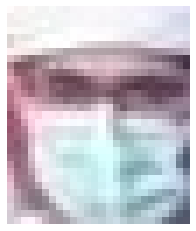

frame31_face_1
0.0647727679644513
(180.06999999999994, 79.08000000000004)


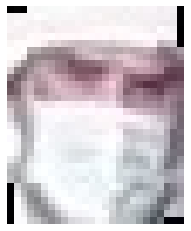

frame31_face_3
0.06542039623155405
(467.93000000000006, 89.08000000000004)


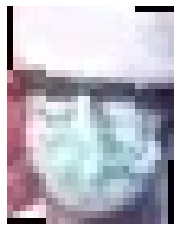

frame31_face_2
0.08587934382177675
(37.069999999999936, 93.08000000000004)


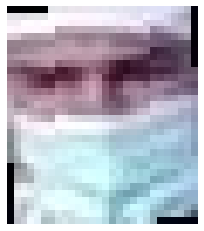

frame32_face_8
0.05505337527460119
(413.68000000000006, 1.990000000000009)


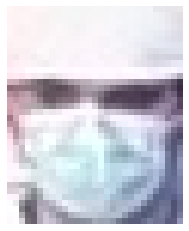

frame32_face_4
0.05608796963672524
(55.319999999999936, 69.00999999999999)


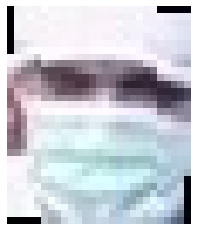

frame32_face_7
0.05623940135266914
(118.68000000000006, 61.00999999999999)


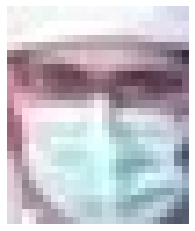

frame32_face_1
0.06292207129254024
(180.68000000000006, 79.00999999999999)


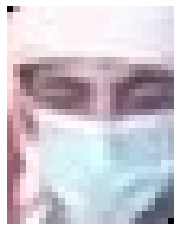

frame32_face_9
0.06328495106628851
(166.31999999999994, 12.009999999999991)


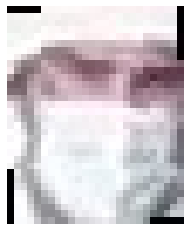

frame32_face_5
0.06354586521497196
(467.31999999999994, 89.00999999999999)


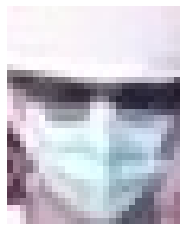

frame32_face_6
0.06501902553926975
(311.31999999999994, 37.00999999999999)


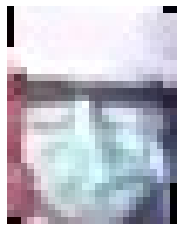

frame32_face_3
0.0780407025808425
(36.680000000000064, 93.00999999999999)


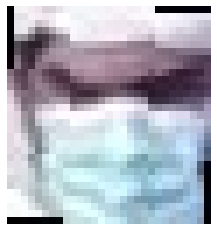

frame32_face_2
0.08063915257075793
(338.68000000000006, 60.00999999999999)


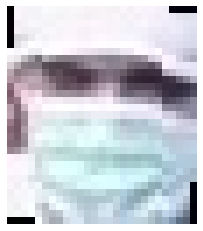

frame33_face_7
0.055873364253806734
(119.08999999999992, 61.00999999999999)


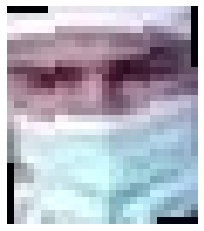

frame33_face_8
0.056135932016490475
(414.0899999999999, 1.990000000000009)


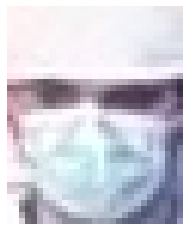

frame33_face_4
0.05717167893343711
(54.91000000000008, 69.00999999999999)


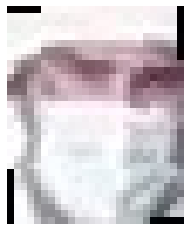

frame33_face_5
0.0626578534364799
(466.9100000000001, 89.00999999999999)


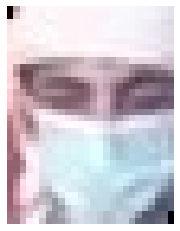

frame33_face_9
0.06269572642400523
(165.91000000000008, 12.009999999999991)


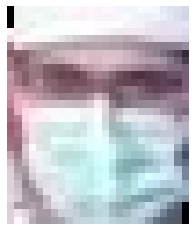

frame33_face_1
0.06343177355837903
(181.08999999999992, 79.00999999999999)


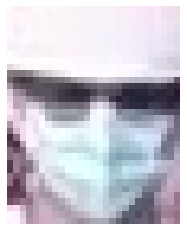

frame33_face_6
0.06708400280943771
(310.9100000000001, 37.00999999999999)


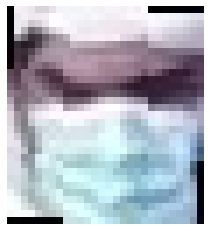

frame33_face_3
0.07427932606846344
(338.0899999999999, 60.00999999999999)


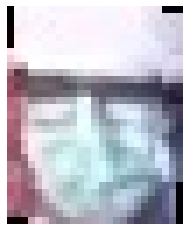

frame33_face_2
0.08261873994309554
(37.08999999999992, 93.00999999999999)


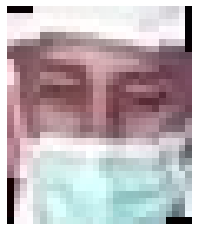

frame34_face_3
0.05992705050008784
(274.9000000000001, 5.100000000000023)


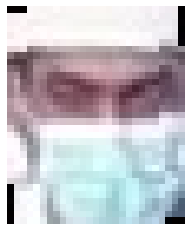

frame34_face_4
0.06181266985879352
(415.9000000000001, 28.899999999999977)


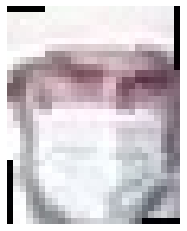

frame34_face_1
0.06368409984205847
(468.9000000000001, 89.89999999999998)


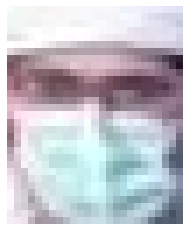

frame34_face_2
0.06422992304111508
(180.0999999999999, 79.89999999999998)


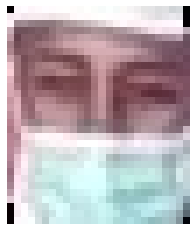

frame35_face_2
0.057736257796232815
(278.8900000000001, 5.2000000000000455)


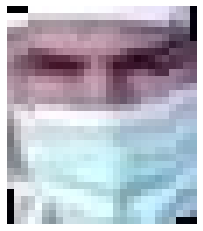

frame35_face_4
0.05885811081220371
(415.1099999999999, 5.2000000000000455)


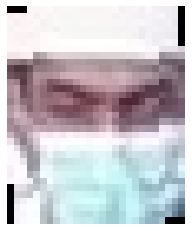

frame35_face_1
0.059797526181884275
(418.8900000000001, 28.799999999999955)


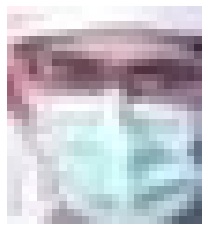

frame35_face_5
0.060536061841543365
(182.1099999999999, 79.79999999999995)


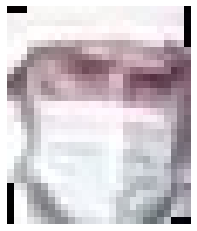

frame35_face_6
0.06397159676626984
(469.8900000000001, 91.79999999999995)


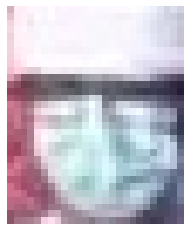

frame35_face_3
0.0749812381778221
(36.1099999999999, 89.79999999999995)


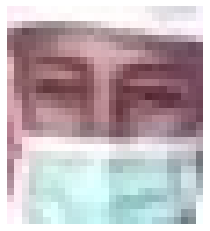

frame36_face_1
0.05779094013527486
(282.3399999999999, 3.019999999999982)


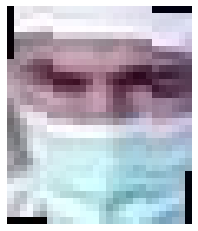

frame36_face_2
0.05896586555823147
(417.6600000000001, 5.019999999999982)


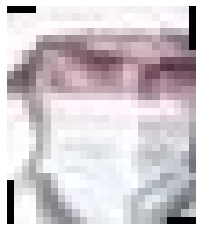

frame36_face_6
0.06103551428173415
(469.3399999999999, 93.98000000000002)


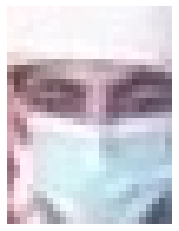

frame36_face_4
0.061796748254101086
(170.33999999999992, 10.980000000000018)


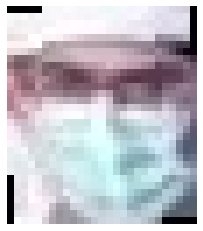

frame36_face_5
0.06243526759158058
(181.66000000000008, 79.98000000000002)


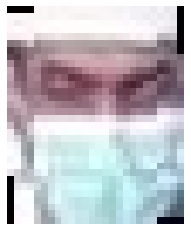

frame36_face_3
0.06471880818754305
(422.3399999999999, 25.980000000000018)


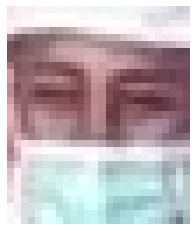

frame37_face_4
0.05300766072000196
(285.78999999999996, 1.8400000000000318)


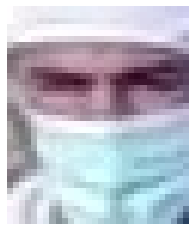

frame37_face_1
0.05764995485967517
(421.21000000000004, 7.840000000000032)


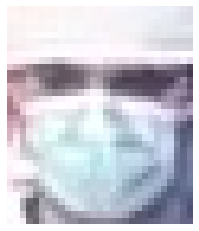

frame37_face_5
0.06373459766342326
(60.789999999999964, 66.15999999999997)


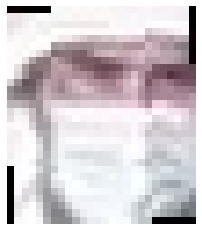

frame37_face_6
0.06428406754583571
(468.78999999999996, 96.15999999999997)


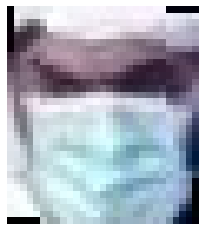

frame37_face_3
0.06627441911901832
(335.21000000000004, 58.15999999999997)


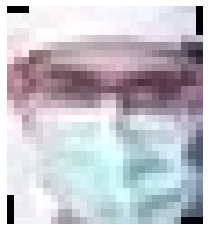

frame37_face_2
0.0662887562987694
(182.21000000000004, 81.15999999999997)


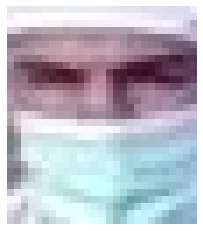

frame38_face_5
0.0514496743128261
(420.76, 5.659999999999968)


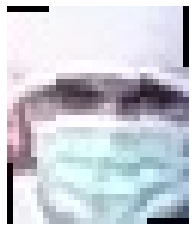

frame38_face_3
0.05778241320640731
(107.75999999999999, 57.34000000000003)


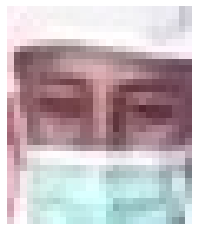

frame38_face_2
0.05961145413983171
(287.24, 0.6599999999999682)


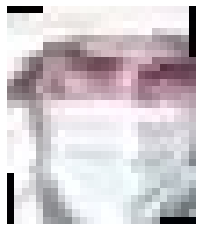

frame38_face_4
0.06176750332890457
(469.24, 96.34000000000003)


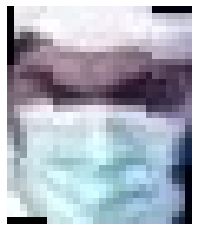

frame38_face_1
0.06278162461308834
(333.76, 59.34000000000003)


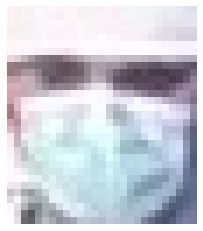

frame38_face_6
0.06379195230742096
(63.24000000000001, 67.34000000000003)


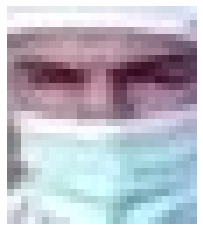

frame39_face_5
0.050379783459144734
(419.30999999999995, 4.480000000000018)


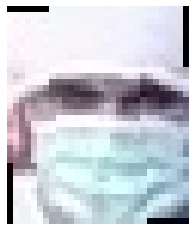

frame39_face_3
0.05473170105495151
(106.30999999999995, 58.51999999999998)


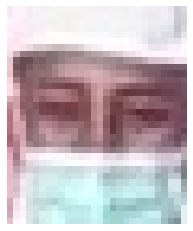

frame39_face_2
0.057581341290051435
(288.69000000000005, 0.5199999999999818)


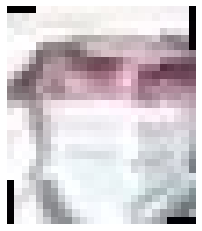

frame39_face_4
0.06215059220308039
(470.69000000000005, 97.51999999999998)


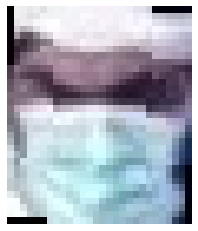

frame39_face_1
0.06515034110110973
(332.30999999999995, 60.51999999999998)


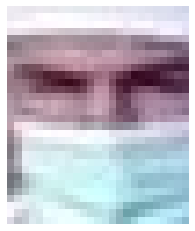

frame40_face_6
0.053518888891262106
(420.1099999999999, 0.7999999999999545)


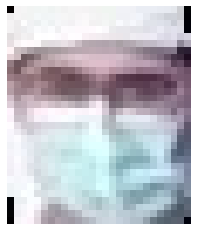

frame40_face_5
0.05723235801151494
(179.1099999999999, 81.20000000000005)


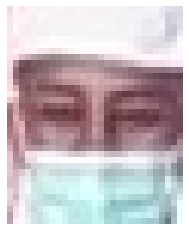

frame40_face_1
0.06065982751167909
(291.8900000000001, 2.2000000000000455)


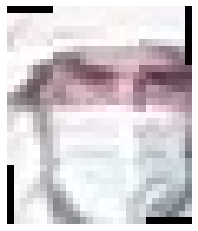

frame40_face_2
0.06314721309401228
(469.8900000000001, 98.20000000000005)


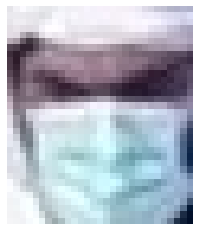

frame40_face_7
0.06365713445433518
(332.1099999999999, 60.200000000000045)


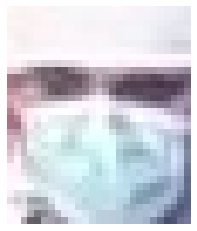

frame40_face_3
0.06600428723889196
(66.8900000000001, 71.20000000000005)


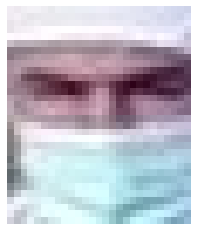

frame41_face_4
0.05259814290160747
(420.49, 1.5399999999999636)


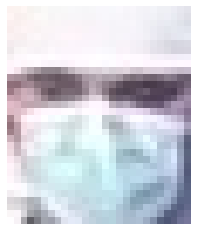

frame41_face_3
0.060026517639280796
(71.50999999999999, 74.53999999999996)


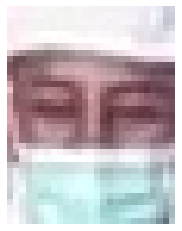

frame41_face_1
0.060772829161810926
(297.51, 4.539999999999964)


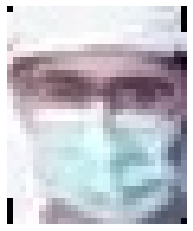

frame41_face_2
0.060837062846697765
(177.49, 81.53999999999996)


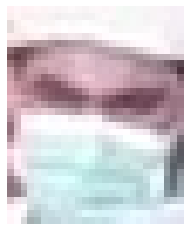

frame41_face_5
0.06149309443283635
(613.51, 58.539999999999964)


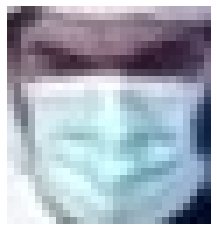

frame41_face_6
0.06322119117731695
(328.49, 59.539999999999964)


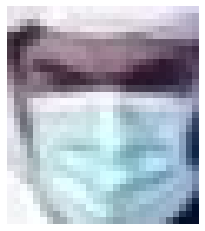

frame42_face_1
0.06119098723785987
(325.04999999999995, 60.83000000000004)


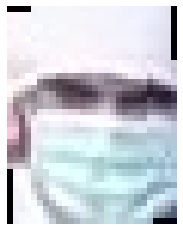

frame42_face_4
0.0626132504073208
(91.04999999999995, 65.83000000000004)


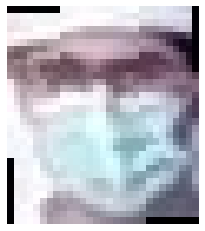

frame42_face_3
0.0638198768202034
(174.04999999999995, 79.83000000000004)


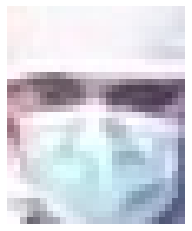

frame42_face_2
0.06386040887763822
(75.95000000000005, 76.83000000000004)


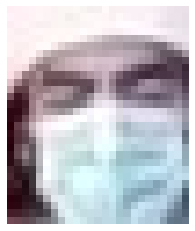

frame42_face_5
0.07042201468208598
(214.95000000000005, 70.83000000000004)


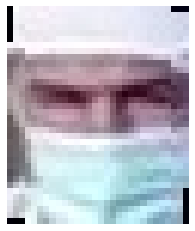

frame43_face_3
0.05199037362238901
(419.6700000000001, 3.6200000000000045)


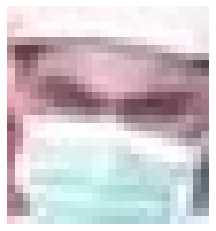

frame43_face_6
0.05937909866152613
(619.3299999999999, 62.620000000000005)


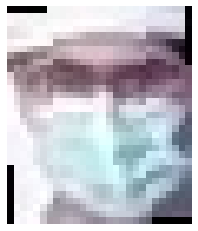

frame43_face_5
0.06176055232602573
(171.67000000000007, 80.62)


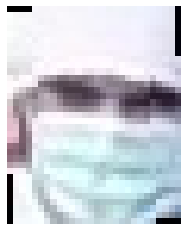

frame43_face_4
0.06309900766306298
(86.67000000000007, 68.62)


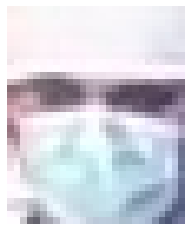

frame43_face_1
0.0632846079678917
(79.32999999999993, 78.62)


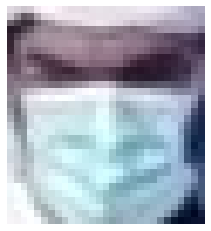

frame43_face_2
0.06401828906590545
(320.6700000000001, 60.620000000000005)


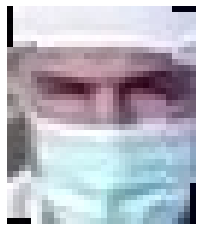

frame44_face_1
0.05409077964282283
(419.69000000000005, 1.759999999999991)


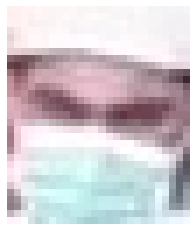

frame44_face_8
0.05560444353597349
(622.31, 60.75999999999999)


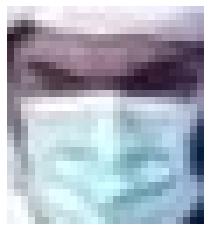

frame44_face_6
0.05928986894417243
(317.69000000000005, 61.75999999999999)


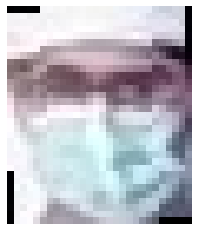

frame44_face_2
0.06218860560288797
(168.69000000000005, 80.75999999999999)


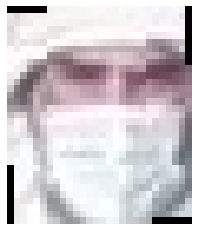

frame44_face_4
0.06266086945333849
(476.30999999999995, 96.75999999999999)


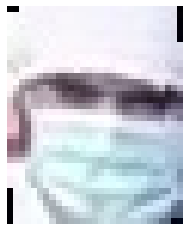

frame44_face_5
0.06379202862459377
(83.69000000000005, 67.75999999999999)


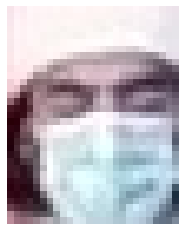

frame44_face_10
0.0651098967315269
(218.30999999999995, 71.75999999999999)


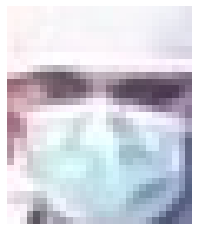

frame44_face_3
0.06943336460209959
(81.30999999999995, 77.75999999999999)


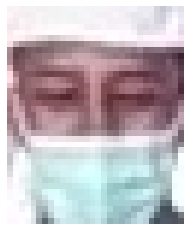

frame44_face_7
0.08539472857259667
(308.30999999999995, 2.759999999999991)


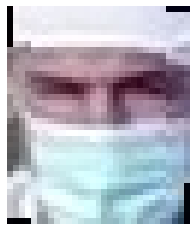

frame45_face_2
0.05370677013214231
(418.51, 1.8999999999999773)


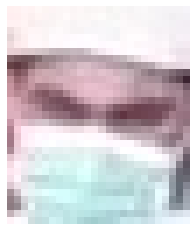

frame45_face_8
0.054533590950281985
(622.49, 60.89999999999998)


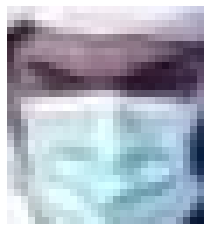

frame45_face_6
0.0604080318689163
(317.51, 61.89999999999998)


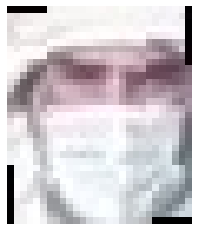

frame45_face_4
0.06175103146062688
(476.49, 96.89999999999998)


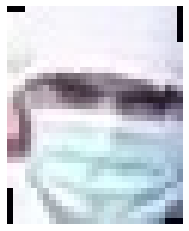

frame45_face_5
0.0631621097896613
(83.50999999999999, 67.89999999999998)


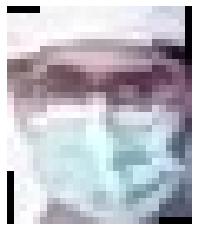

frame45_face_1
0.06358126786045326
(168.51, 80.89999999999998)


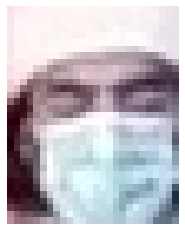

frame45_face_9
0.06561034268212318
(218.49, 71.89999999999998)


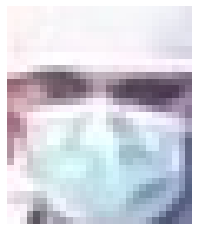

frame45_face_3
0.0685649924704348
(81.49000000000001, 77.89999999999998)


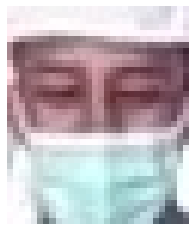

frame45_face_7
0.07124242236627698
(308.49, 2.8999999999999773)


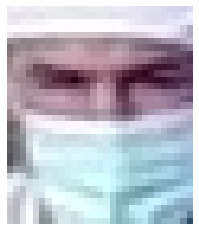

frame46_face_6
0.05068690178829782
(416.48, 1.4800000000000182)


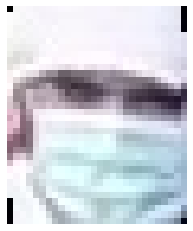

frame46_face_4
0.05841364038235486
(80.48000000000002, 68.48000000000002)


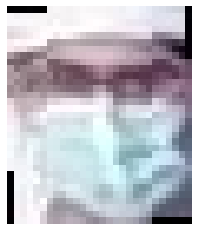

frame46_face_2
0.06251349248101035
(166.48000000000002, 79.48000000000002)


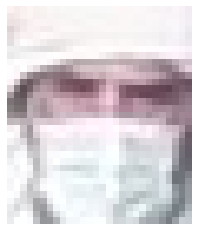

frame46_face_3
0.06398989065804761
(477.52, 96.48000000000002)


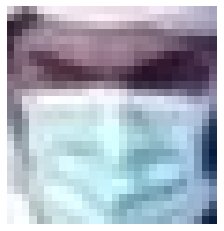

frame46_face_7
0.06498712327206779
(314.48, 61.48000000000002)


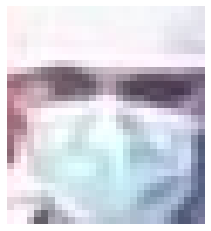

frame46_face_5
0.06806673714983147
(83.51999999999998, 77.48000000000002)


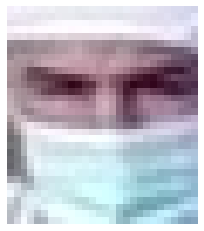

frame47_face_3
0.04604220267291648
(414.45000000000005, 2.0599999999999454)


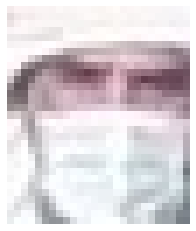

frame47_face_6
0.061219791728028605
(477.54999999999995, 94.05999999999995)


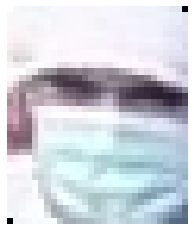

frame47_face_5
0.0613309389358746
(78.45000000000005, 67.05999999999995)


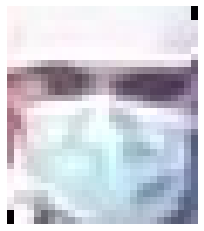

frame47_face_1
0.06184935724693874
(86.54999999999995, 76.05999999999995)


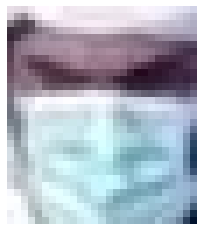

frame47_face_2
0.06206988616055953
(311.45000000000005, 60.059999999999945)


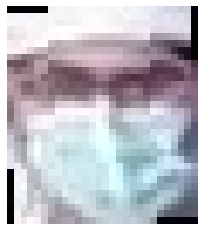

frame47_face_4
0.06655904977611105
(163.45000000000005, 80.05999999999995)


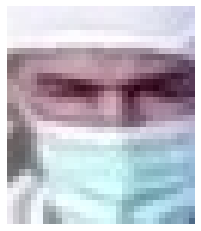

frame48_face_5
0.05012314126618567
(416.44000000000005, 1.3600000000000136)


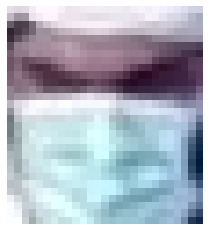

frame48_face_1
0.059524612631887686
(309.44000000000005, 60.639999999999986)


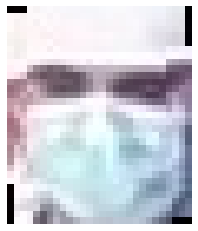

frame48_face_4
0.06060617014297709
(87.55999999999995, 74.63999999999999)


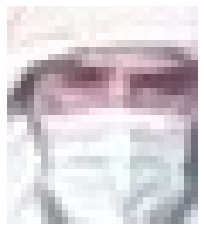

frame48_face_2
0.06361518423612755
(475.55999999999995, 92.63999999999999)


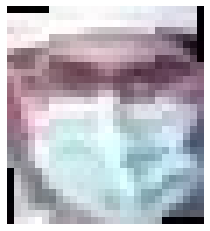

frame48_face_3
0.06951627804911431
(162.44000000000005, 79.63999999999999)


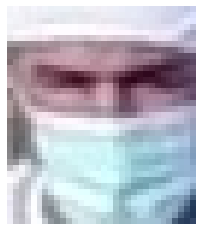

frame49_face_3
0.05480664943925884
(416.03, 5.779999999999973)


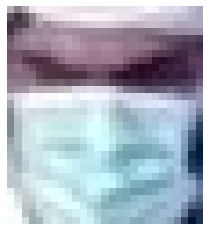

frame49_face_1
0.06113786744059757
(309.03, 59.22000000000003)


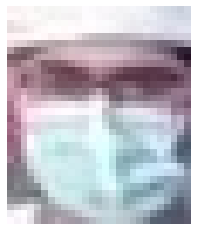

frame49_face_2
0.06236365445313419
(161.02999999999997, 79.22000000000003)


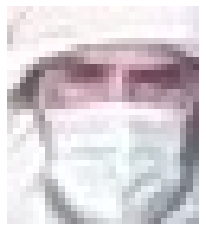

frame49_face_4
0.0629436405804561
(472.97, 90.22000000000003)


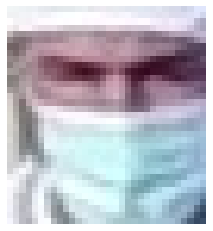

frame50_face_2
0.05477702856766975
(416.6199999999999, 8.200000000000045)


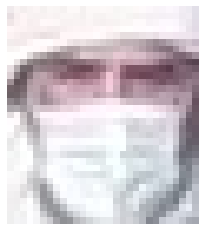

frame50_face_3
0.059420792916009546
(473.3800000000001, 90.79999999999995)


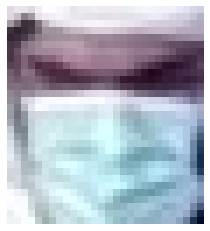

frame50_face_1
0.06134377774156807
(310.6199999999999, 58.799999999999955)


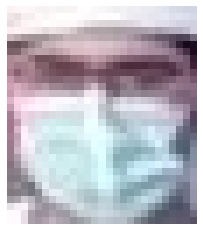

frame50_face_4
0.06394849472492992
(159.6199999999999, 78.79999999999995)


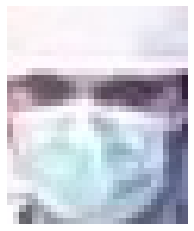

frame50_face_6
0.06530229099061113
(89.38000000000011, 70.79999999999995)


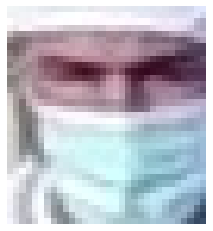

frame51_face_2
0.05712766120535184
(416.23, 8.159999999999968)


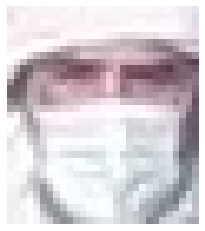

frame51_face_3
0.05942294294805128
(473.77, 90.84000000000003)


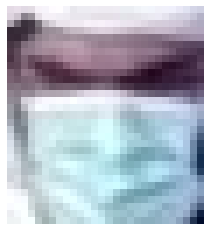

frame51_face_1
0.06099524015385138
(310.23, 58.84000000000003)


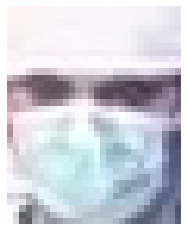

frame51_face_6
0.06279914996447677
(89.76999999999998, 70.84000000000003)


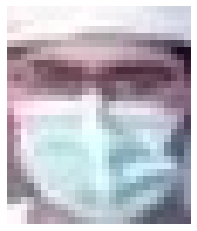

frame51_face_4
0.06448270791450794
(159.23000000000002, 78.84000000000003)


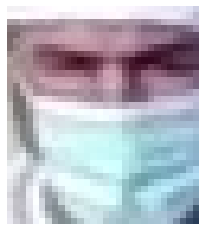

frame52_face_1
0.054736255090468755
(415.73, 10.0)


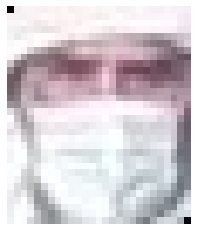

frame52_face_2
0.06291362595069516
(473.27, 93.0)


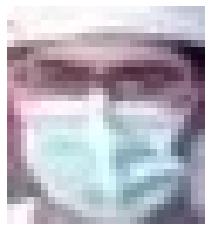

frame52_face_3
0.06364306826963884
(160.73000000000002, 80.0)


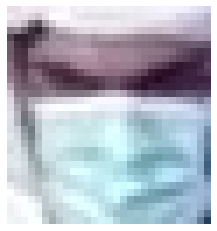

frame52_face_5
0.06369996777492903
(312.73, 60.0)


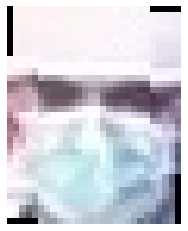

frame52_face_4
0.07168404370689596
(87.26999999999998, 71.0)


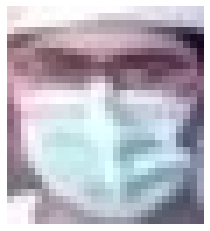

frame53_face_6
0.060464653337750085
(161.23000000000002, 80.16999999999996)


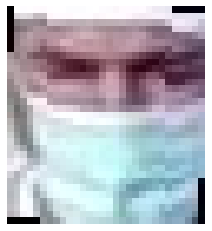

frame53_face_1
0.06201135928116264
(415.23, 9.830000000000041)


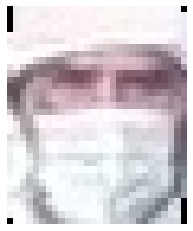

frame53_face_2
0.0640594025870439
(471.77, 95.16999999999996)


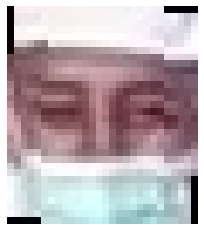

frame53_face_7
0.06525006600957561
(316.77, 3.830000000000041)


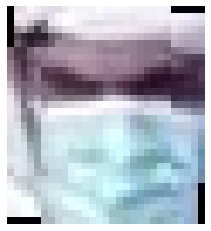

frame53_face_5
0.06543048815460017
(314.23, 60.16999999999996)


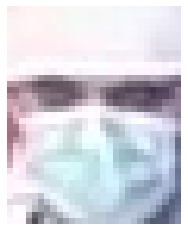

frame53_face_3
0.0689463795101739
(85.76999999999998, 70.16999999999996)


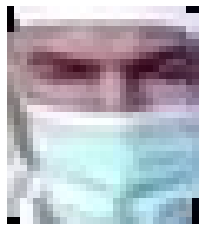

frame54_face_2
0.05611845053415576
(414.72, 10.669999999999959)


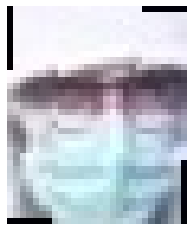

frame54_face_3
0.06284166520575785
(645.28, 8.330000000000041)


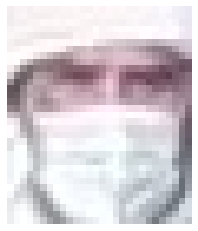

frame54_face_1
0.06381701664916861
(471.28, 97.33000000000004)


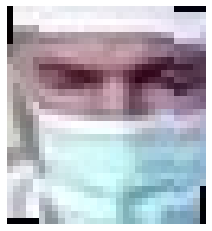

frame55_face_2
0.05813860488870781
(415.21000000000004, 10.5)


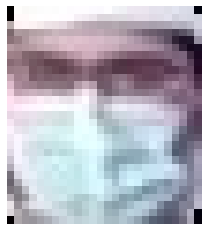

frame55_face_3
0.059284052103161455
(160.21000000000004, 82.5)


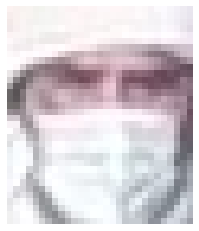

frame55_face_1
0.06868958710860662
(470.78999999999996, 98.5)


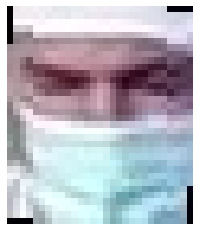

frame56_face_4
0.054661174596910556
(412.79999999999995, 7.899999999999977)


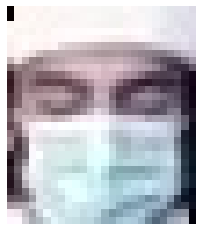

frame56_face_3
0.06093750367913264
(230.20000000000005, 68.10000000000002)


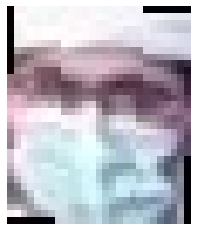

frame56_face_1
0.06683002555663309
(162.79999999999995, 84.10000000000002)


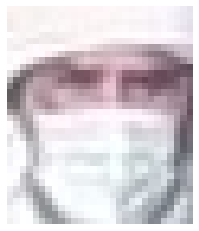

frame56_face_2
0.06683203593350417
(471.20000000000005, 101.10000000000002)


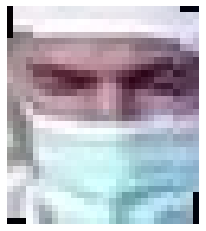

frame57_face_4
0.0541487636893484
(413.81999999999994, 8.120000000000005)


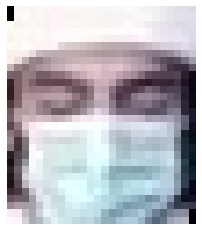

frame57_face_3
0.06143207908277459
(230.18000000000006, 67.88)


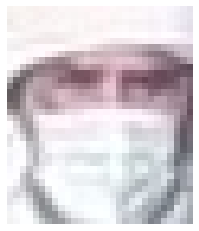

frame57_face_2
0.06678563677994365
(471.18000000000006, 100.88)


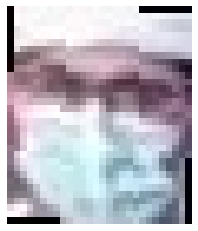

frame57_face_1
0.07434913959706002
(163.81999999999994, 82.88)


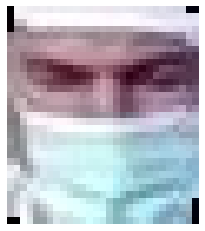

frame58_face_3
0.05187288050180172
(412.8499999999999, 4.980000000000018)


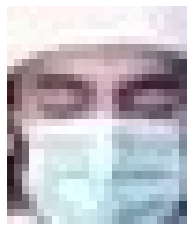

frame58_face_4
0.05969922221902235
(230.1500000000001, 70.01999999999998)


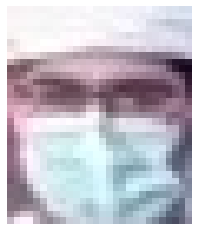

frame58_face_1
0.06330397755882011
(165.8499999999999, 85.01999999999998)


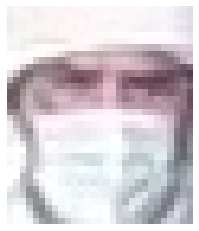

frame58_face_2
0.06570347480190797
(471.1500000000001, 104.01999999999998)


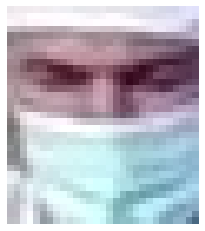

frame59_face_4
0.05535109424020834
(412.8800000000001, 1.6900000000000546)


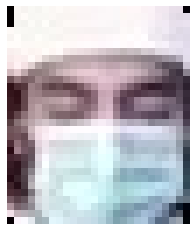

frame59_face_3
0.061219557032876515
(229.1199999999999, 71.30999999999995)


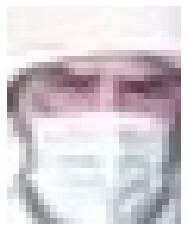

frame59_face_2
0.06325751005413793
(471.1199999999999, 106.30999999999995)


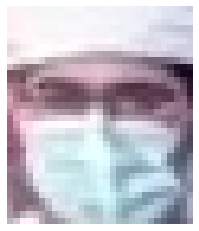

frame59_face_1
0.065619992307549
(168.8800000000001, 86.30999999999995)


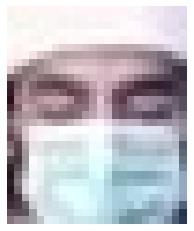

frame60_face_4
0.0610676723972885
(231.0999999999999, 74.60000000000002)


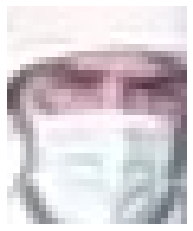

frame60_face_1
0.0646561717262476
(471.0999999999999, 108.60000000000002)


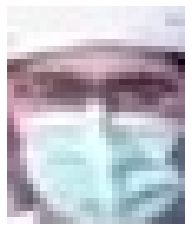

frame60_face_2
0.06510723369395333
(170.9000000000001, 87.60000000000002)


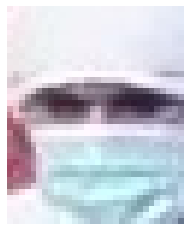

frame61_face_3
0.05750707408373301
(100.07999999999993, 67.48000000000002)


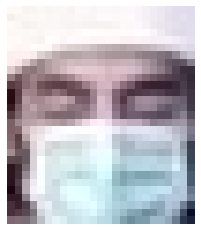

frame61_face_4
0.06139975187098956
(230.92000000000007, 76.48000000000002)


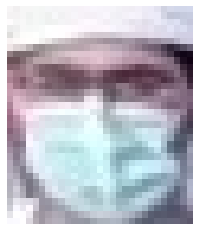

frame61_face_2
0.06157087258602778
(174.07999999999993, 86.48000000000002)


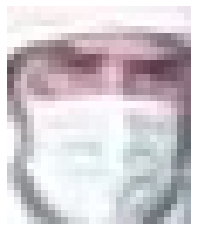

frame61_face_1
0.0642149000300466
(471.9200000000001, 107.48000000000002)


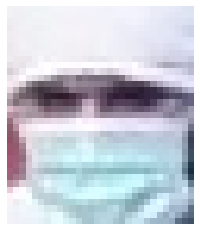

frame62_face_3
0.06090886474523172
(102.5, 67.73000000000002)


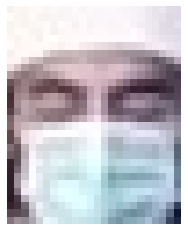

frame62_face_4
0.06188642836810043
(231.5, 76.73000000000002)


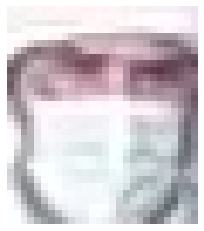

frame62_face_1
0.06359131544453878
(471.5, 105.73000000000002)


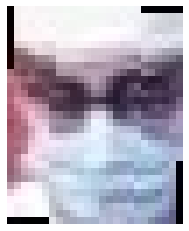

frame62_face_5
0.06681344468716022
(232.5, 112.73000000000002)


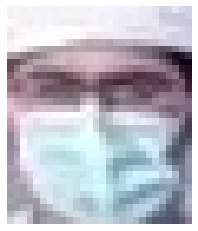

frame62_face_2
0.06731325429554746
(176.5, 87.73000000000002)


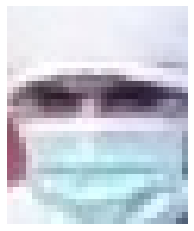

frame63_face_3
0.05712435704446217
(102.92000000000007, 67.98000000000002)


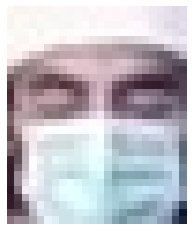

frame63_face_4
0.061914884221286215
(231.07999999999993, 76.98000000000002)


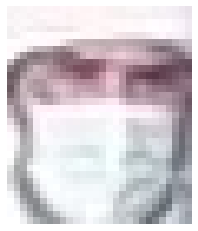

frame63_face_1
0.06308012463180912
(471.0799999999999, 105.98000000000002)


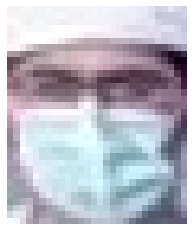

frame63_face_2
0.06483380380856374
(176.92000000000007, 86.98000000000002)


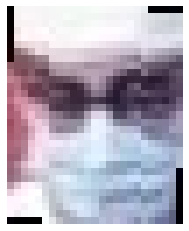

frame63_face_5
0.06500341265578025
(232.92000000000007, 112.98000000000002)


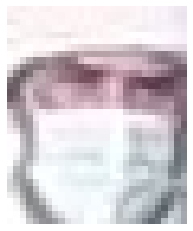

frame64_face_2
0.06529313077217846
(470.6500000000001, 104.23000000000002)


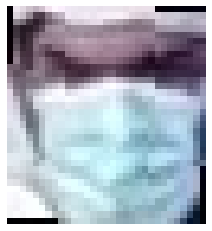

frame64_face_1
0.06569699056261435
(338.3499999999999, 64.23000000000002)


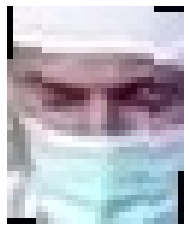

frame65_face_4
0.054072769194508874
(421.77, 0.4800000000000182)


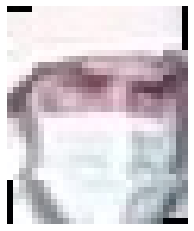

frame65_face_3
0.06202851414534083
(470.23, 102.48000000000002)


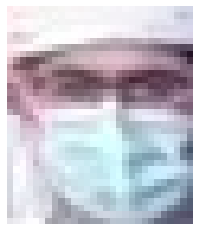

frame65_face_2
0.06382418737067563
(186.76999999999998, 87.48000000000002)


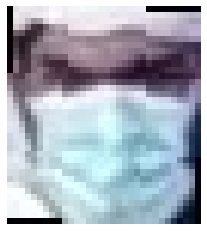

frame65_face_1
0.06557716691827487
(340.77, 64.48000000000002)


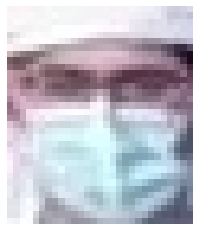

frame66_face_2
0.05845003581969943
(187.3699999999999, 86.70000000000005)


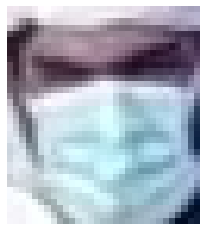

frame66_face_1
0.061794546807961814
(341.3699999999999, 63.700000000000045)


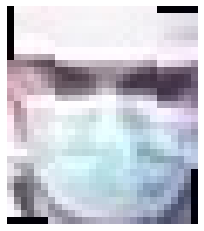

frame66_face_4
0.06203062573052698
(71.63000000000011, 76.70000000000005)


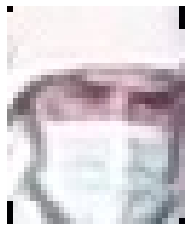

frame66_face_3
0.06332092026782021
(470.6300000000001, 99.70000000000005)


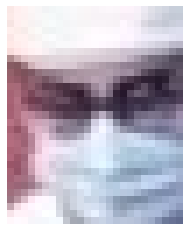

frame66_face_6
0.06383152804977177
(235.3699999999999, 106.70000000000005)


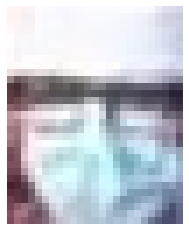

frame66_face_5
0.07971718162413244
(20.36999999999989, 108.70000000000005)


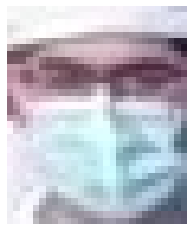

frame67_face_2
0.058719136621670276
(188.95000000000005, 85.82000000000005)


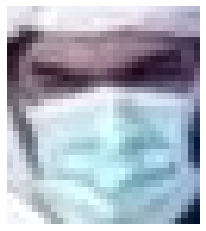

frame67_face_1
0.06551701388918252
(341.95000000000005, 64.82000000000005)


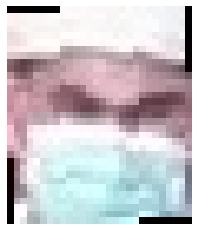

frame67_face_3
0.06950093674746038
(628.05, 59.82000000000005)


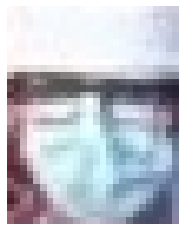

frame67_face_4
0.07905548054554457
(20.950000000000045, 105.82000000000005)


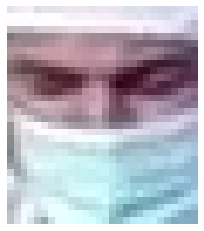

frame68_face_5
0.053117633653582574
(423.52, 6.059999999999945)


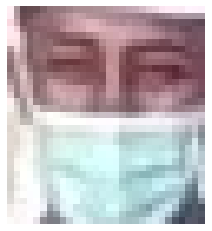

frame68_face_6
0.060484176945582835
(311.48, 7.059999999999945)


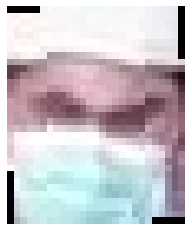

frame68_face_1
0.0632366220192423
(632.48, 58.940000000000055)


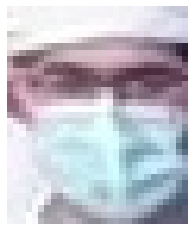

frame68_face_4
0.06335402398688761
(191.51999999999998, 85.94000000000005)


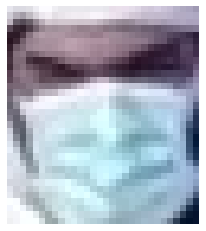

frame68_face_2
0.06473321341476013
(341.52, 63.940000000000055)


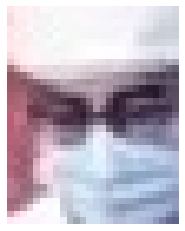

frame68_face_7
0.0654647770985024
(235.51999999999998, 105.94000000000005)


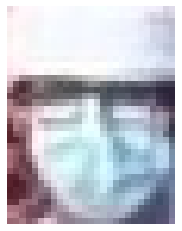

frame68_face_3
0.06966910574249052
(22.519999999999982, 103.94000000000005)


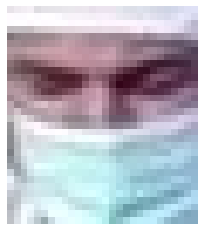

frame69_face_5
0.05210005556415209
(423.0999999999999, 5.940000000000055)


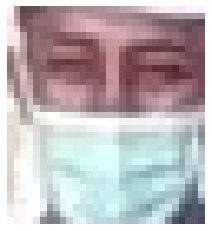

frame69_face_6
0.060077746087515704
(311.9000000000001, 6.940000000000055)


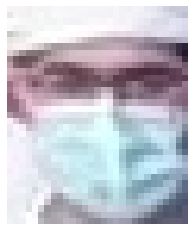

frame69_face_3
0.06280658308178066
(191.0999999999999, 86.05999999999995)


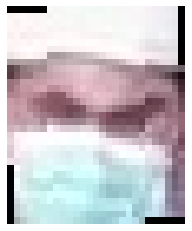

frame69_face_1
0.0632697848455176
(632.9000000000001, 59.059999999999945)


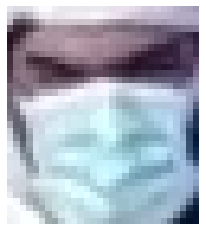

frame69_face_2
0.06421559670294641
(341.0999999999999, 64.05999999999995)


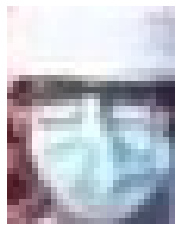

frame69_face_4
0.07418040912544777
(22.09999999999991, 104.05999999999995)


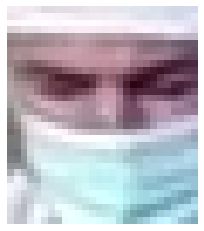

frame70_face_4
0.054375249239136725
(426.27, 7.419999999999959)


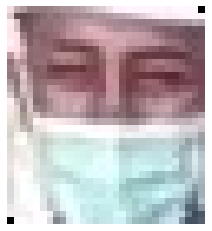

frame70_face_7
0.05521312086354002
(313.73, 7.419999999999959)


Exception ignored in: <function TransformNode.set_children.<locals>.<lambda> at 0x7f7ea169d790>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/matplotlib/transforms.py", line 177, in <lambda>
    ref = weakref.ref(self, lambda ref, sid=id(self),
KeyboardInterrupt: 


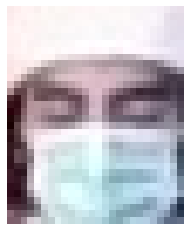

frame70_face_6
0.061756300580746326
(230.73000000000002, 75.58000000000004)


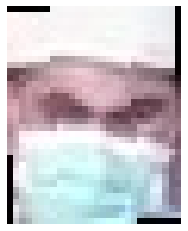

frame70_face_2
0.06219223885182845
(633.73, 57.58000000000004)


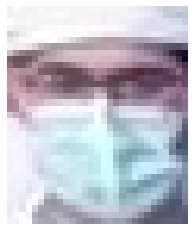

frame70_face_3
0.06240367568909089
(191.26999999999998, 86.58000000000004)


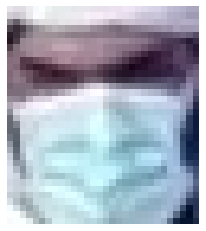

frame70_face_1
0.06783439938021807
(340.27, 64.58000000000004)


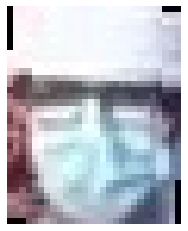

frame70_face_5
0.09266000751068004
(22.269999999999982, 103.58000000000004)


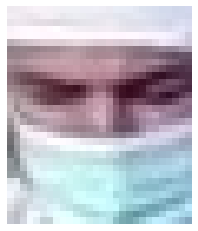

frame71_face_7
0.05088909028723354
(426.20000000000005, 8.419999999999959)


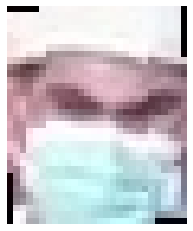

frame71_face_3
0.06314303741953475
(635.8, 57.58000000000004)


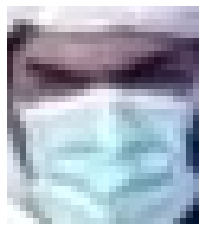

frame71_face_1
0.06360596212658054
(340.20000000000005, 64.58000000000004)


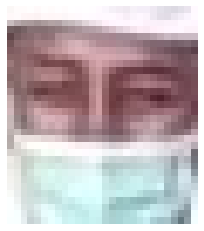

frame71_face_5
0.0636579398828836
(319.79999999999995, 5.419999999999959)


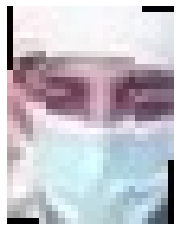

frame71_face_6
0.0642829610829162
(191.79999999999995, 12.580000000000041)


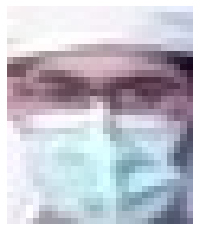

frame71_face_2
0.06770691812726859
(190.20000000000005, 88.58000000000004)


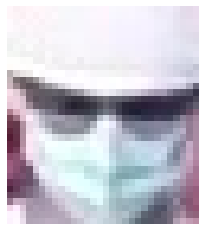

frame71_face_4
0.07021433688531464
(347.79999999999995, 44.58000000000004)


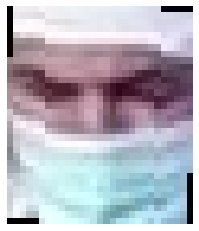

frame72_face_4
0.05693622828709666
(426.1400000000001, 10.409999999999968)


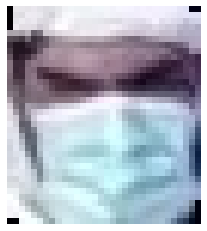

frame72_face_1
0.0611102742088675
(341.1400000000001, 63.59000000000003)


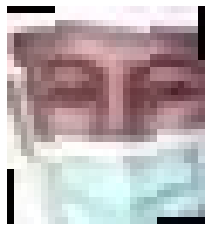

frame72_face_3
0.062418827510999364
(320.8599999999999, 6.409999999999968)


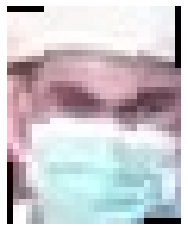

frame72_face_2
0.06666666996140147
(638.8599999999999, 57.59000000000003)


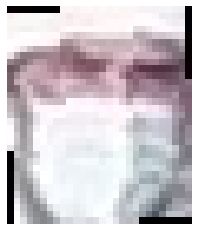

frame72_face_5
0.07058367396046206
(485.8599999999999, 99.59000000000003)


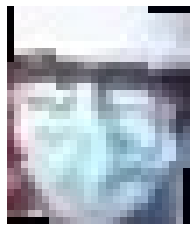

frame72_face_6
0.08013768225092954
(18.1400000000001, 101.59000000000003)


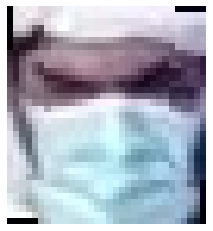

frame73_face_1
0.06125545770116281
(339.06999999999994, 63.59000000000003)


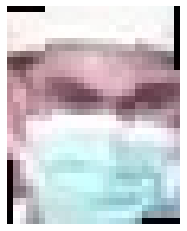

frame73_face_2
0.06422377450887495
(642.9300000000001, 58.59000000000003)


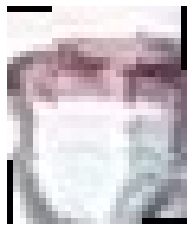

frame73_face_4
0.06608980452610369
(487.93000000000006, 100.59000000000003)


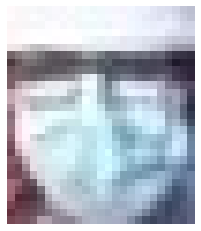

frame73_face_3
0.07310924897456783
(17.069999999999936, 100.59000000000003)


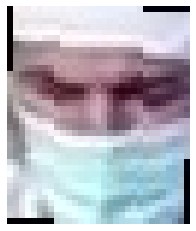

frame74_face_2
0.055590701663398745
(431.0, 12.399999999999977)


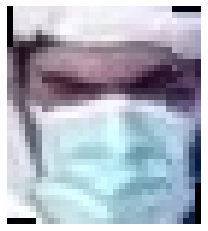

frame74_face_1
0.06036904706871615
(339.0, 61.60000000000002)


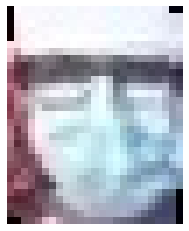

frame74_face_3
0.06807485382788303
(19.0, 98.60000000000002)


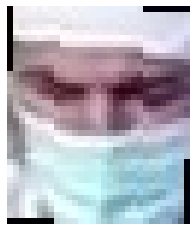

frame75_face_2
0.055898747245830216
(431.3699999999999, 12.220000000000027)


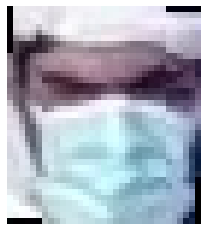

frame75_face_1
0.05966579329513633
(339.3699999999999, 61.77999999999997)


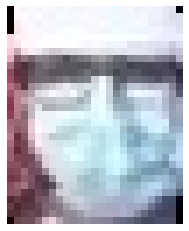

frame75_face_3
0.06669301866513377
(19.36999999999989, 98.77999999999997)


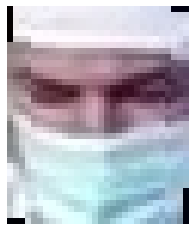

frame76_face_2
0.05318179828900882
(430.3299999999999, 9.700000000000045)


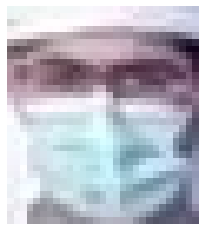

frame76_face_5
0.06039752065331094
(186.32999999999993, 85.29999999999995)


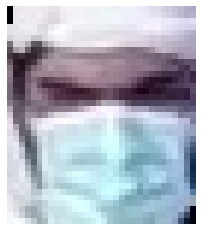

frame76_face_1
0.061471303159049584
(336.3299999999999, 63.299999999999955)


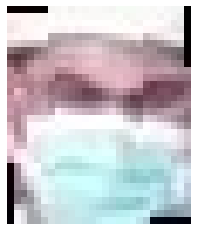

frame76_face_3
0.06406904136612823
(649.6700000000001, 63.299999999999955)


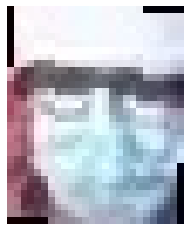

frame76_face_4
0.07402661414895628
(18.329999999999927, 100.29999999999995)


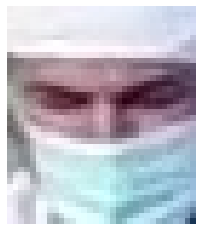

frame77_face_4
0.04903817854800352
(432.28999999999996, 8.169999999999959)


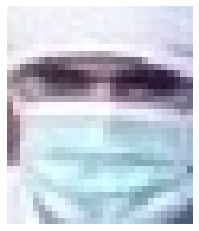

frame77_face_3
0.05213027179476026
(95.28999999999996, 64.83000000000004)


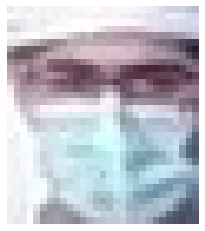

frame77_face_1
0.06059052702338863
(185.28999999999996, 85.83000000000004)


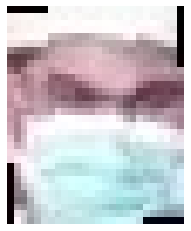

frame77_face_6
0.06154977279944063
(653.71, 65.83000000000004)


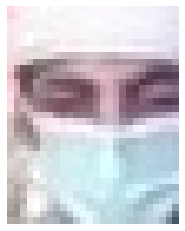

frame77_face_5
0.061883201102055585
(194.71000000000004, 17.83000000000004)


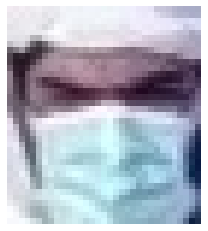

frame77_face_2
0.06324650206204585
(333.28999999999996, 63.83000000000004)


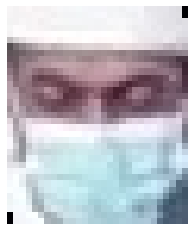

frame77_face_7
0.06451322435685236
(468.71000000000004, 27.83000000000004)


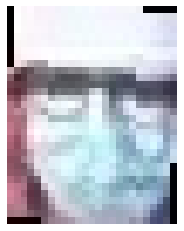

frame77_face_8
0.07677521355443329
(16.289999999999964, 101.83000000000004)


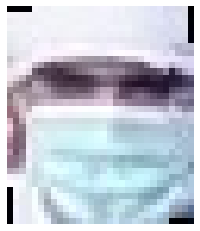

frame78_face_2
0.05136382420440011
(91.42000000000007, 65.35000000000002)


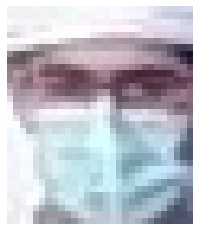

frame78_face_1
0.0564103095545232
(181.42000000000007, 86.35000000000002)


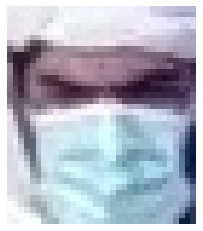

frame78_face_4
0.059008276538860205
(329.4200000000001, 64.35000000000002)


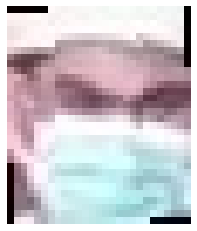

frame78_face_7
0.061123002579786756
(656.5799999999999, 68.35000000000002)


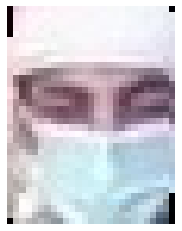

frame78_face_3
0.06583393421984352
(197.57999999999993, 20.350000000000023)


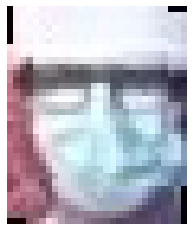

frame78_face_5
0.06829602959745895
(15.420000000000073, 102.35000000000002)


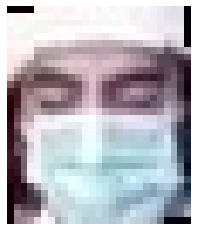

frame78_face_6
0.07209052098600277
(241.57999999999993, 75.35000000000002)


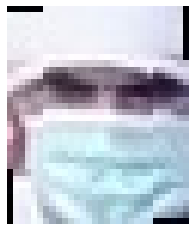

frame79_face_2
0.05928710708729634
(86.53999999999996, 66.88)


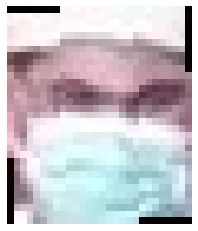

frame79_face_5
0.05982973758439425
(661.46, 68.88)


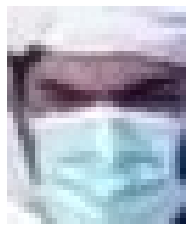

frame79_face_4
0.06151150971775532
(325.53999999999996, 66.88)


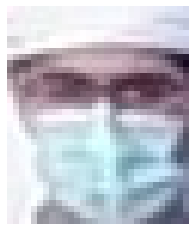

frame79_face_1
0.06207377885442089
(178.53999999999996, 86.88)


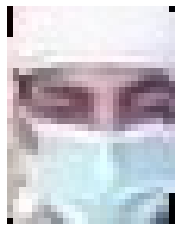

frame79_face_3
0.06241650220721262
(200.46000000000004, 22.879999999999995)


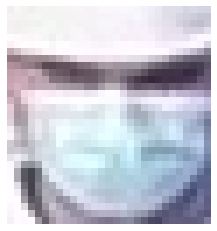

frame79_face_6
0.06538227325083812
(100.46000000000004, 77.88)


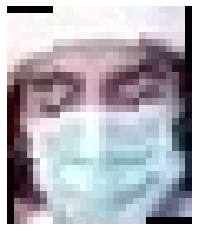

frame79_face_7
0.06773554507237045
(243.46000000000004, 76.88)


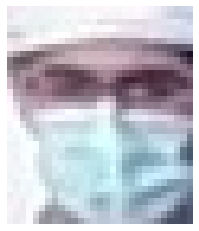

frame80_face_1
0.0587890986617331
(174.67000000000007, 89.39999999999998)


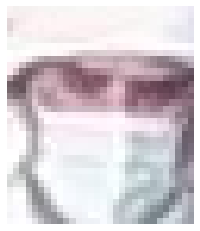

frame80_face_3
0.06138333356688219
(502.3299999999999, 112.39999999999998)


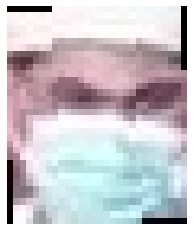

frame80_face_4
0.062387474274941734
(665.3299999999999, 69.39999999999998)


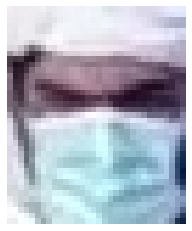

frame80_face_2
0.06407529279881385
(321.6700000000001, 69.39999999999998)


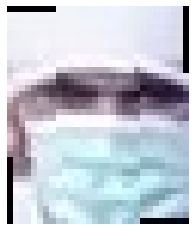

frame80_face_5
0.06441105495252908
(81.67000000000007, 69.39999999999998)


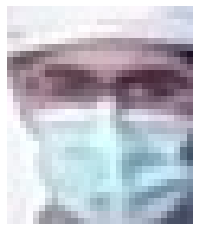

frame81_face_1
0.05932194458034934
(174.3900000000001, 89.08000000000004)


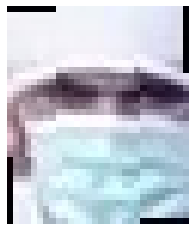

frame81_face_4
0.06229252708552413
(81.3900000000001, 69.08000000000004)


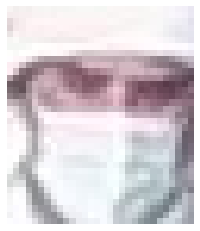

frame81_face_3
0.06241390103685418
(502.6099999999999, 112.08000000000004)


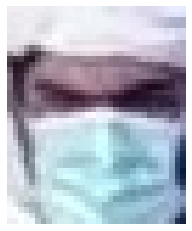

frame81_face_2
0.06288905022717173
(321.3900000000001, 69.08000000000004)


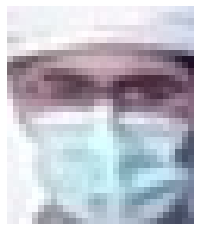

frame82_face_1
0.0580447359567674
(171.07999999999993, 88.75999999999999)


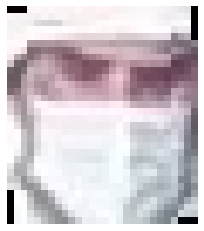

frame82_face_2
0.06494456043694552
(505.9200000000001, 109.75999999999999)


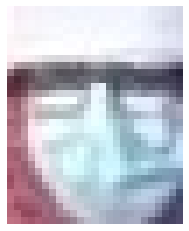

frame82_face_3
0.06934049277723253
(7.079999999999927, 110.75999999999999)


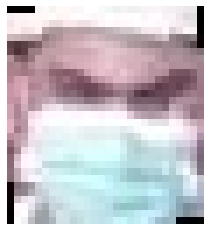

frame83_face_5
0.05965187569174868
(673.22, 65.44000000000005)


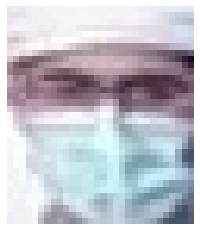

frame83_face_1
0.061131709377121424
(168.77999999999997, 88.44000000000005)


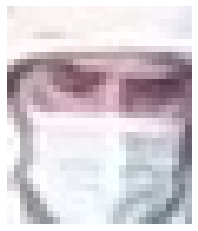

frame83_face_2
0.06354047241857652
(508.22, 108.44000000000005)


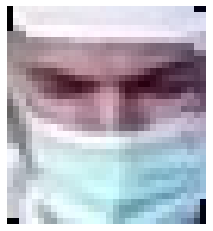

frame83_face_4
0.06378724689515691
(421.78, 7.559999999999945)


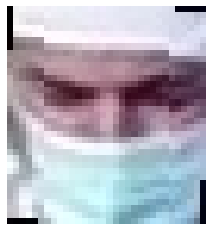

frame84_face_3
0.05560055077042947
(419.47, 8.879999999999995)


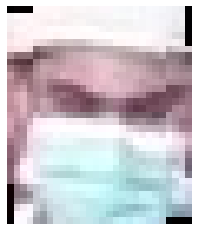

frame84_face_4
0.06002553001849065
(676.53, 64.12)


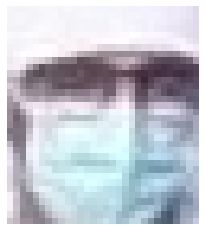

frame84_face_6
0.060816179875447074
(710.53, 11.120000000000005)


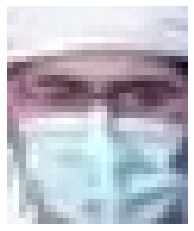

frame84_face_1
0.061259463280536997
(164.47000000000003, 89.12)


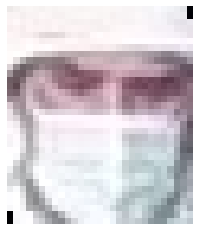

frame84_face_2
0.06436274250747553
(509.53, 105.12)


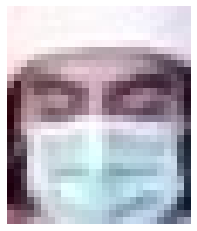

frame84_face_8
0.06835913137470995
(253.52999999999997, 80.12)


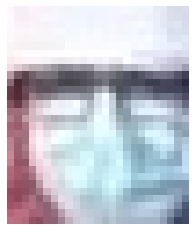

frame84_face_5
0.07337988489461056
(2.4700000000000273, 112.12)


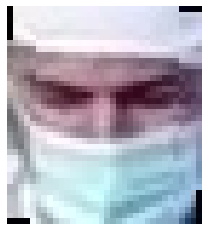

frame85_face_4
0.055705158710479874
(418.1700000000001, 13.200000000000045)


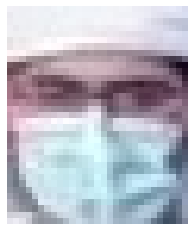

frame85_face_3
0.06017153908276529
(161.17000000000007, 88.79999999999995)


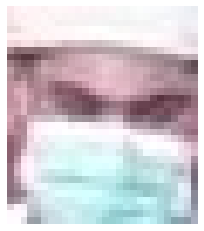

frame85_face_6
0.06241990991206792
(679.8299999999999, 62.799999999999955)


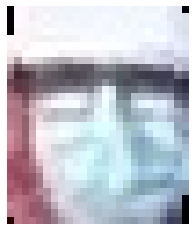

frame85_face_5
0.06381615898625392
(0.17000000000007276, 110.79999999999995)


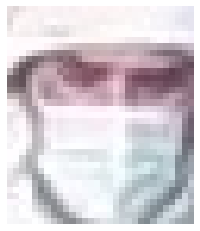

frame85_face_2
0.0658887342398291
(509.8299999999999, 100.79999999999995)


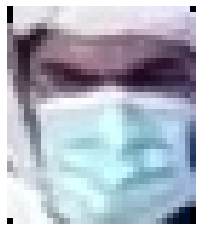

frame85_face_1
0.06652061482106553
(315.1700000000001, 61.799999999999955)


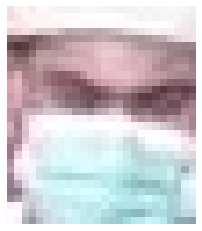

frame86_face_3
0.0587300470875336
(681.81, 61.32000000000005)


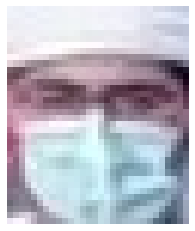

frame86_face_2
0.06106520889634259
(161.19000000000005, 89.32000000000005)


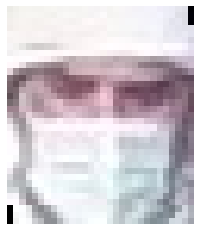

frame86_face_5
0.06661928244355797
(510.80999999999995, 101.32000000000005)


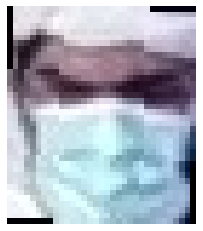

frame86_face_1
0.06745172995449766
(315.19000000000005, 62.32000000000005)


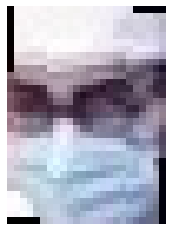

frame86_face_6
0.07120256690681925
(217.19000000000005, 106.32000000000005)


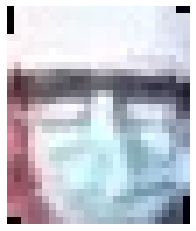

frame86_face_4
0.0727886662900139
(0.8099999999999454, 111.32000000000005)


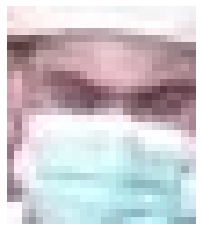

frame87_face_4
0.05902280756660716
(682.79, 61.84000000000003)


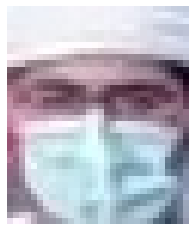

frame87_face_2
0.061910411411421395
(160.21000000000004, 89.84000000000003)


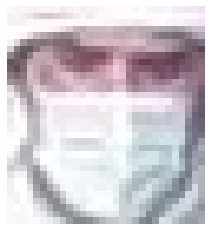

frame87_face_6
0.06682630870542428
(510.78999999999996, 98.84000000000003)


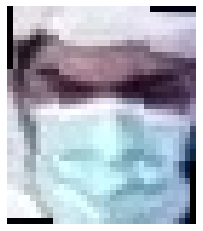

frame87_face_1
0.06901064870404616
(314.21000000000004, 62.84000000000003)


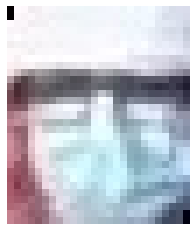

frame87_face_3
0.07107569784955481
(1.7899999999999636, 111.84000000000003)


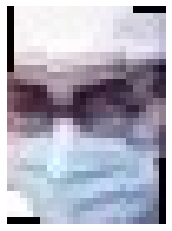

frame87_face_5
0.07176869941482511
(216.21000000000004, 106.84000000000003)


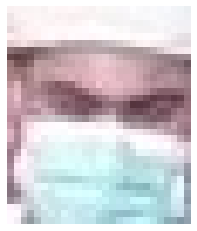

frame88_face_3
0.05605444379516644
(683.77, 60.360000000000014)


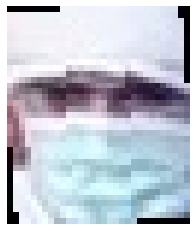

frame88_face_6
0.05805223281703664
(65.23000000000002, 68.36000000000001)


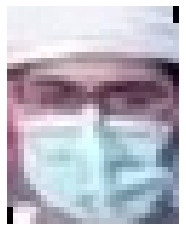

frame88_face_1
0.06163918284601955
(160.23000000000002, 88.36000000000001)


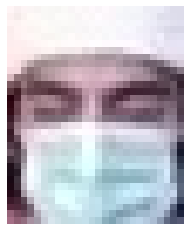

frame88_face_5
0.06350089715719687
(257.77, 79.36000000000001)


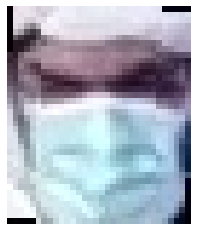

frame88_face_2
0.06471575858749512
(314.23, 60.360000000000014)


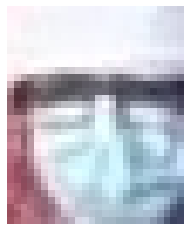

frame88_face_4
0.07442813258643777
(1.7699999999999818, 111.36000000000001)


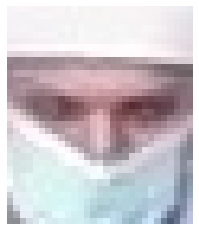

frame89_face_7
0.054118064164722424
(666.75, 32.120000000000005)


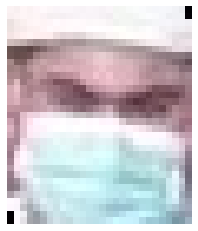

frame89_face_4
0.05624272635452687
(684.75, 57.879999999999995)


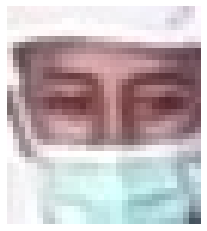

frame89_face_6
0.058538887102551285
(363.75, 8.120000000000005)


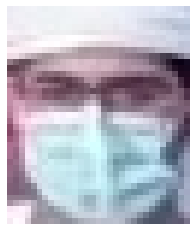

frame89_face_2
0.06013099799308952
(160.25, 87.88)


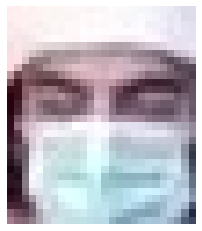

frame89_face_5
0.061054673854031405
(257.75, 78.88)


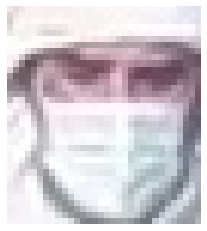

frame89_face_8
0.06594760362591179
(506.75, 96.88)


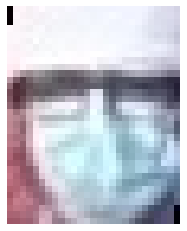

frame89_face_3
0.06872581703584146
(2.75, 108.88)


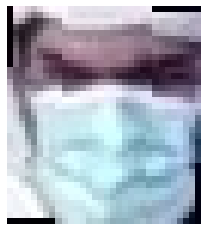

frame89_face_1
0.06915876704517021
(316.25, 57.879999999999995)


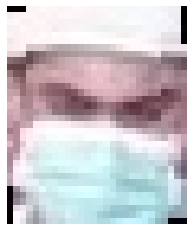

frame90_face_3
0.055642752847203214
(685.73, 57.39999999999998)


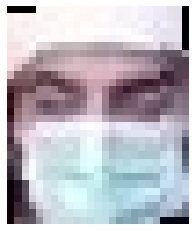

frame90_face_4
0.061435935641619754
(258.73, 77.39999999999998)


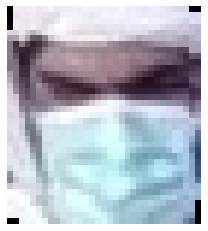

frame90_face_1
0.06726633515023428
(319.27, 57.39999999999998)


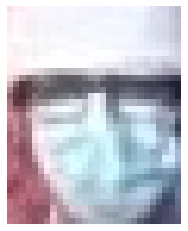

frame90_face_2
0.07253656812157616
(2.730000000000018, 107.39999999999998)


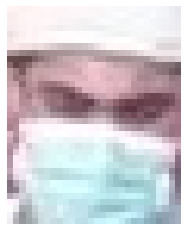

frame91_face_3
0.05581255986753875
(686.06, 57.42999999999995)


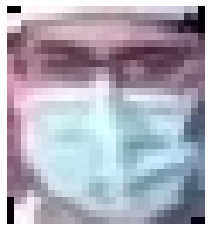

frame91_face_4
0.06210120392634211
(160.94000000000005, 85.42999999999995)


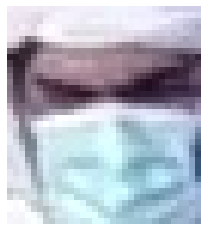

frame91_face_2
0.06729676234806925
(320.94000000000005, 57.42999999999995)


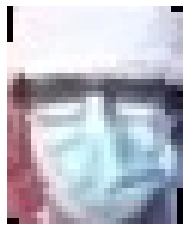

frame91_face_1
0.0835534161091328
(3.0599999999999454, 106.42999999999995)


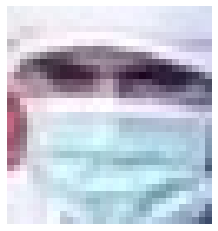

frame92_face_4
0.054263202502887076
(71.61999999999989, 66.45000000000005)


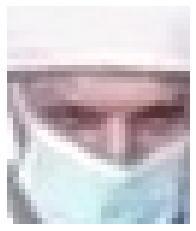

frame92_face_6
0.05446478746479577
(668.3800000000001, 31.549999999999955)


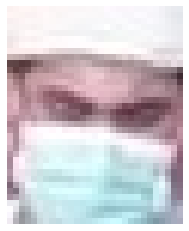

frame92_face_3
0.05616658452374812
(686.3800000000001, 58.450000000000045)


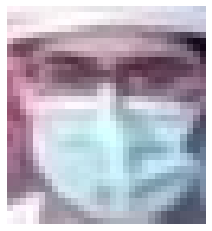

frame92_face_1
0.06105517566481966
(163.6199999999999, 84.45000000000005)


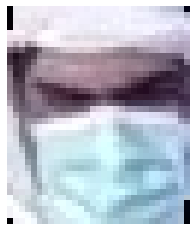

frame92_face_5
0.06203708494598226
(323.6199999999999, 56.450000000000045)


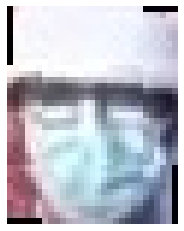

frame92_face_2
0.07741155954031664
(4.380000000000109, 105.45000000000005)


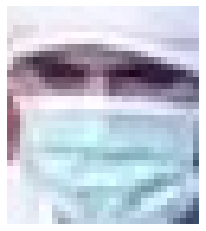

frame93_face_4
0.05144467626305527
(70.28999999999996, 66.48000000000002)


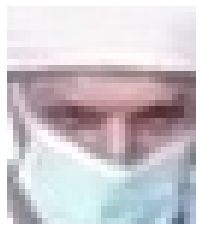

frame93_face_6
0.05451935074259162
(668.71, 30.519999999999982)


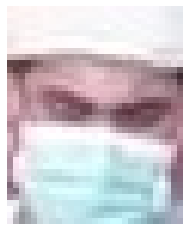

frame93_face_3
0.056111926608229945
(686.71, 59.48000000000002)


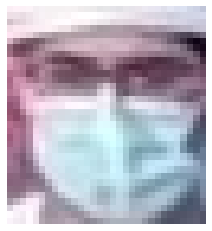

frame93_face_1
0.06216483216892077
(163.28999999999996, 85.48000000000002)


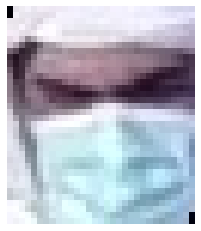

frame93_face_5
0.06415616732132345
(323.28999999999996, 57.48000000000002)


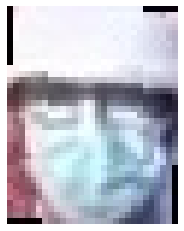

frame93_face_2
0.07109917562254853
(4.710000000000036, 106.48000000000002)


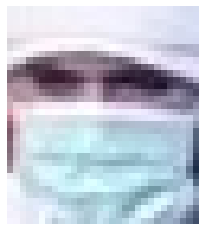

frame94_face_3
0.047751456000517334
(72.13000000000011, 68.84000000000003)


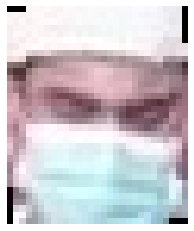

frame94_face_4
0.058003042738544286
(686.8699999999999, 62.84000000000003)


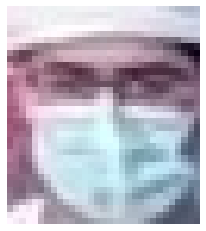

frame94_face_1
0.06067969930143979
(165.1300000000001, 86.84000000000003)


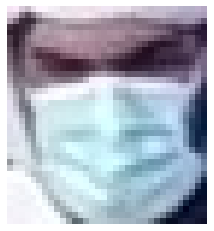

frame94_face_2
0.0618267443821473
(326.1300000000001, 53.84000000000003)


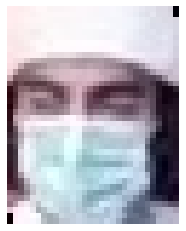

frame94_face_6
0.06610349344790911
(258.8699999999999, 73.84000000000003)


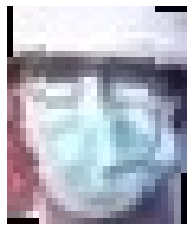

frame94_face_5
0.06931594556587939
(5.869999999999891, 105.84000000000003)


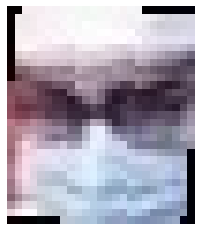

frame94_face_7
0.07127578661487077
(230.1300000000001, 119.84000000000003)


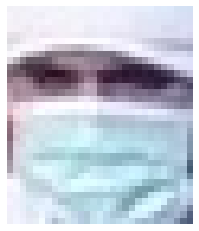

frame95_face_6
0.04781643393371804
(74.97000000000003, 69.20000000000005)


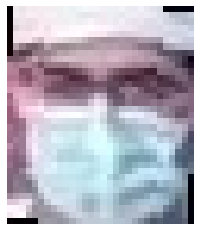

frame95_face_1
0.05868664649681665
(165.97000000000003, 88.20000000000005)


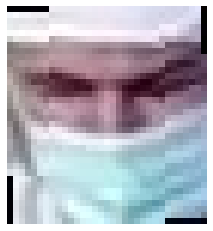

frame95_face_5
0.05935636765425367
(417.97, 11.799999999999955)


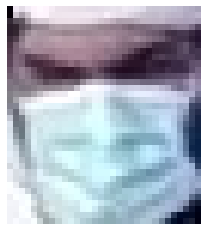

frame95_face_3
0.06250949620969026
(327.97, 58.200000000000045)


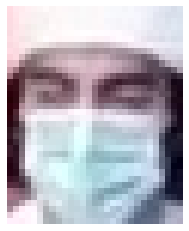

frame95_face_7
0.06924937386689367
(258.03, 75.20000000000005)


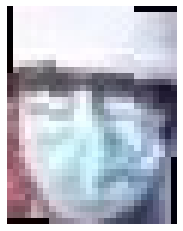

frame95_face_2
0.07118842216573473
(7.029999999999973, 108.20000000000005)


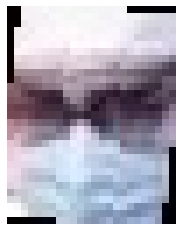

frame95_face_4
0.07323979143349768
(229.97000000000003, 121.20000000000005)


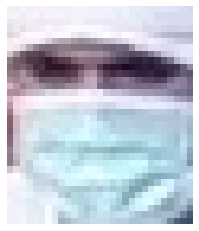

frame96_face_2
0.055129422889892976
(79.56999999999994, 68.91999999999996)


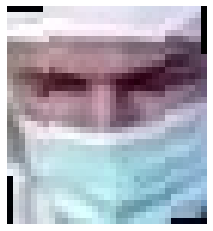

frame96_face_6
0.06092870589412047
(419.56999999999994, 9.080000000000041)


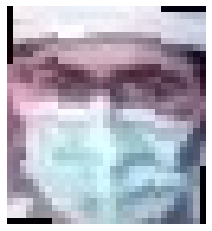

frame96_face_1
0.061537575980485704
(168.56999999999994, 89.91999999999996)


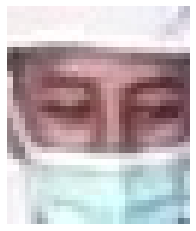

frame96_face_7
0.06167091384407719
(357.43000000000006, 0.08000000000004093)


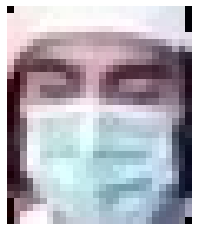

frame96_face_5
0.0628386962637636
(257.43000000000006, 77.91999999999996)


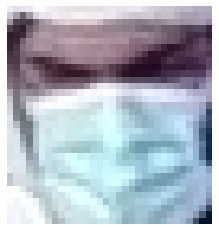

frame96_face_4
0.0690429857737247
(332.56999999999994, 62.91999999999996)


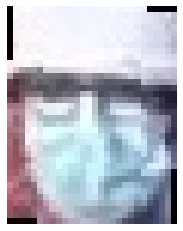

frame96_face_3
0.07454901103954081
(6.430000000000064, 111.91999999999996)


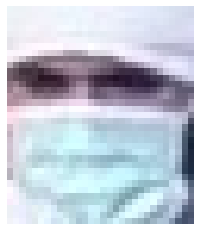

frame97_face_5
0.05206913244893718
(82.92000000000007, 71.53999999999996)


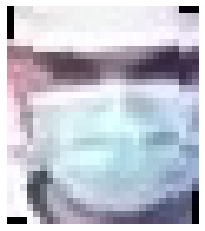

frame97_face_6
0.06003836189864742
(96.07999999999993, 83.53999999999996)


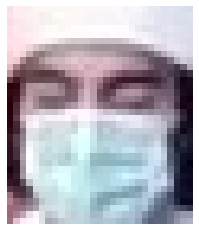

frame97_face_4
0.06130694702984951
(257.0799999999999, 81.53999999999996)


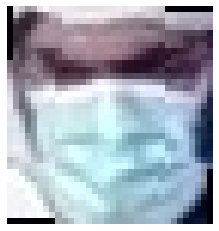

frame97_face_3
0.0655597429394057
(335.9200000000001, 64.53999999999996)


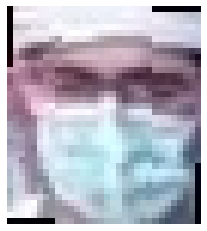

frame97_face_1
0.06704299856374896
(173.92000000000007, 90.53999999999996)


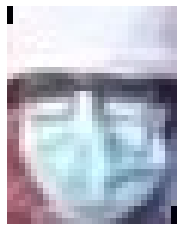

frame97_face_2
0.07634124491101568
(7.079999999999927, 115.53999999999996)


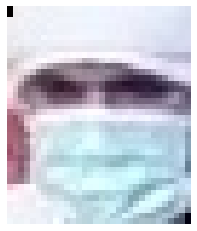

frame98_face_2
0.05660315034090457
(91.26999999999998, 70.83000000000004)


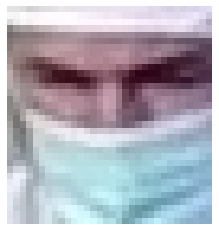

frame98_face_6
0.059788519931356365
(425.27, 4.169999999999959)


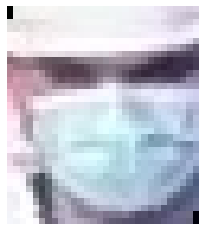

frame98_face_4
0.06120689780431576
(94.73000000000002, 84.83000000000004)


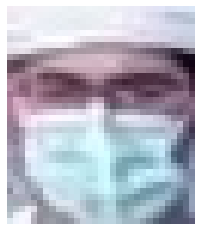

frame98_face_1
0.06476433966970108
(175.26999999999998, 92.83000000000004)


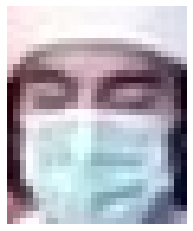

frame98_face_7
0.0653691457208696
(256.73, 83.83000000000004)



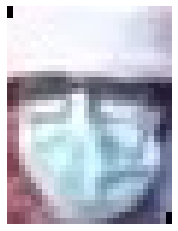

frame98_face_3
0.06813181623218612
(7.730000000000018, 117.83000000000004)


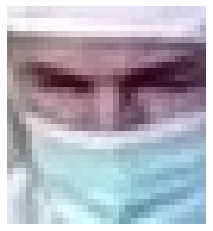

frame99_face_6
0.05507862706989064
(425.6199999999999, 3.6900000000000546)


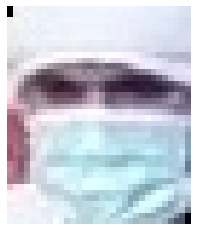

frame99_face_2
0.055898903337754824
(91.61999999999989, 71.30999999999995)


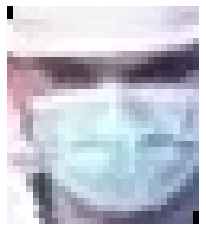

frame99_face_5
0.0626804053159653
(94.38000000000011, 85.30999999999995)


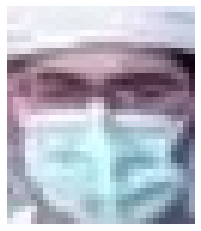

frame99_face_1
0.06329021095724585
(175.6199999999999, 93.30999999999995)


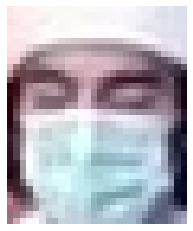

frame99_face_7
0.06534221423074271
(256.3800000000001, 84.30999999999995)


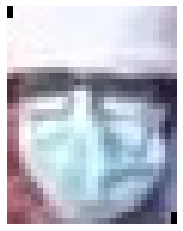

frame99_face_3
0.06606380650719679
(7.380000000000109, 118.30999999999995)


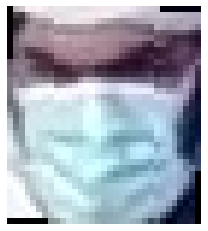

frame99_face_4
0.06907558534579494
(336.6199999999999, 66.30999999999995)


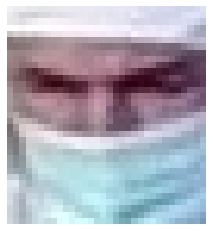

frame100_face_1
0.05141856097403419
(426.97, 4.2000000000000455)


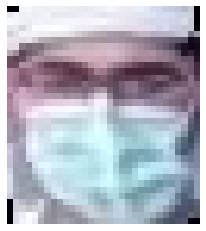

frame100_face_2
0.059814889910168256
(178.97000000000003, 92.79999999999995)


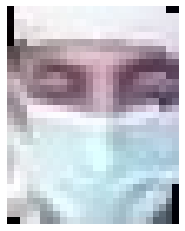

frame100_face_4
0.061989750416706735
(228.02999999999997, 25.799999999999955)


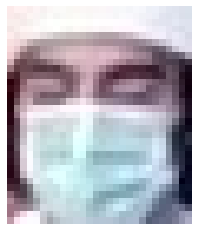

frame100_face_3
0.06595042933923112
(256.03, 84.79999999999995)


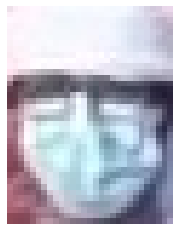

frame100_face_5
0.06775823230245448
(7.029999999999973, 118.79999999999995)


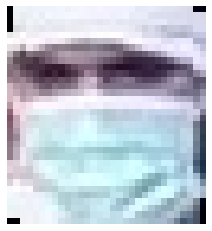

frame101_face_6
0.052674418565294534
(99.21000000000004, 69.88)


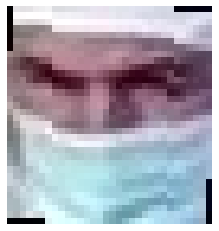

frame101_face_2
0.056482336331686867
(429.21000000000004, 6.1200000000000045)


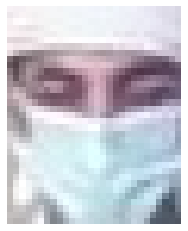

frame101_face_3
0.05953672737302984
(226.78999999999996, 23.879999999999995)


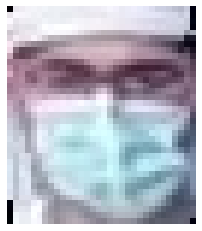

frame101_face_1
0.059567667445306505
(183.21000000000004, 90.88)


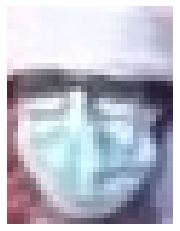

frame101_face_5
0.06341778171461798
(7.789999999999964, 118.88)


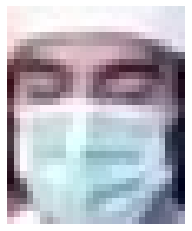

frame101_face_4
0.06775252373667584
(255.78999999999996, 84.88)


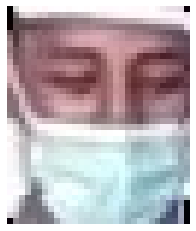

frame101_face_7
0.0711573755125211
(354.78999999999996, 2.1200000000000045)


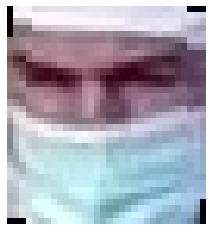

frame102_face_8
0.05542644546483799
(430.43000000000006, 10.009999999999991)


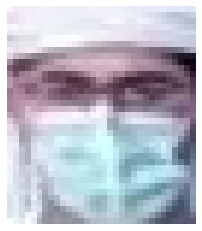

frame102_face_1
0.06098619784912307
(184.43000000000006, 92.99000000000001)


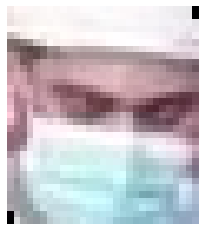

frame102_face_3
0.06165319294926186
(693.5699999999999, 65.99000000000001)


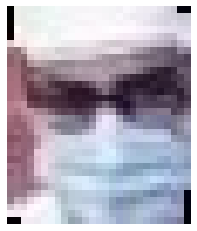

frame102_face_4
0.0638510460498406
(240.43000000000006, 117.99000000000001)


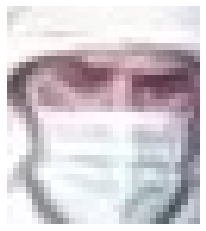

frame102_face_6
0.06394960066731581
(507.56999999999994, 116.99000000000001)



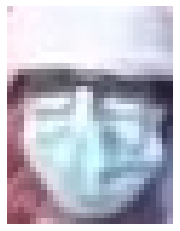

frame102_face_5
0.0656627733865206
(7.569999999999936, 118.99000000000001)


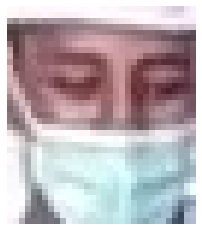

frame102_face_2
0.07155075233267794
(355.56999999999994, 3.009999999999991)


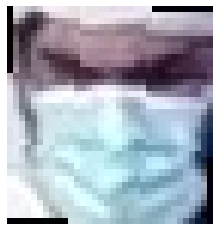

frame102_face_7
0.08098655946393774
(342.43000000000006, 66.99000000000001)


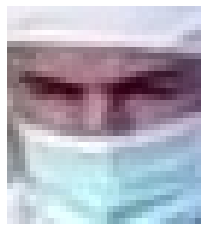

frame103_face_4
0.04741395179178187
(434.6400000000001, 11.909999999999968)


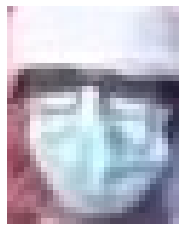

frame103_face_9
0.05743223188772284
(7.3599999999999, 119.09000000000003)


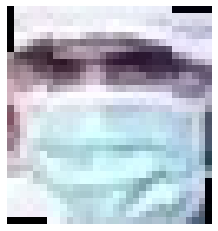

frame103_face_5
0.061128346308205406
(106.6400000000001, 70.09000000000003)


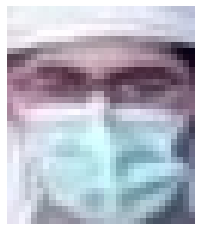

frame103_face_1
0.061402530694529944
(184.6400000000001, 93.09000000000003)


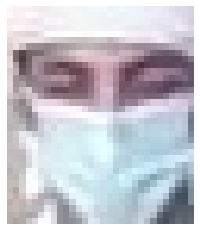

frame103_face_7
0.06228005160876571
(225.3599999999999, 19.090000000000032)


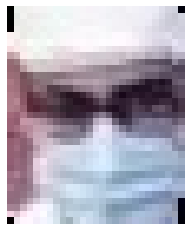

frame103_face_3
0.06289925587588963
(239.6400000000001, 117.09000000000003)



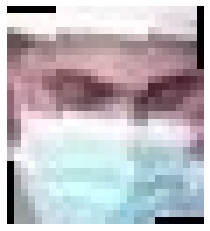

frame103_face_6
0.06636218405718675
(697.3599999999999, 63.09000000000003)


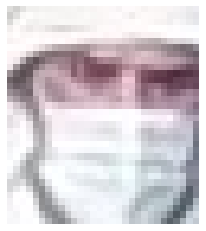

frame103_face_10
0.06785212789277462
(509.3599999999999, 115.09000000000003)


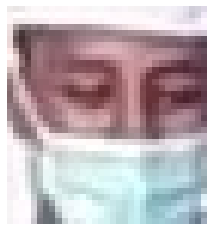

frame103_face_8
0.07029471647863328
(355.3599999999999, 2.909999999999968)


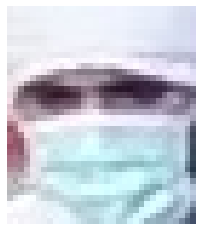

frame104_face_6
0.0549619662341323
(110.8599999999999, 71.20000000000005)


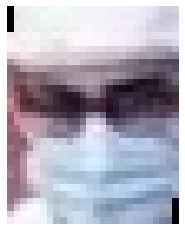

frame104_face_3
0.0588669557873176
(237.8599999999999, 116.20000000000005)



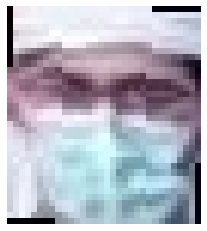

frame104_face_1
0.06021840845983706
(186.8599999999999, 94.20000000000005)


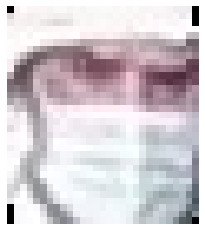

frame104_face_4
0.06203843083223992
(512.1400000000001, 113.20000000000005)


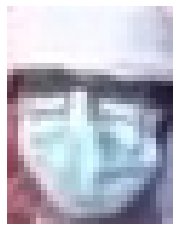

frame104_face_5
0.0649647812208588
(9.1400000000001, 119.20000000000005)


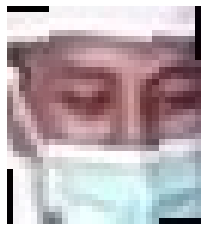

frame104_face_2
0.06520496515717078
(357.1400000000001, 3.7999999999999545)


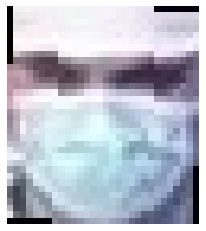

frame104_face_8
0.06536571395038016
(98.1400000000001, 79.20000000000005)


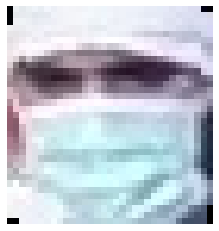

frame105_face_7
0.055156719736480286
(109.06999999999994, 70.29999999999995)


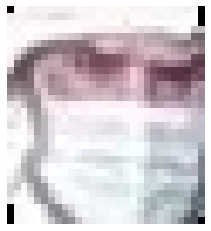

frame105_face_4
0.05795995289935951
(512.9300000000001, 113.29999999999995)


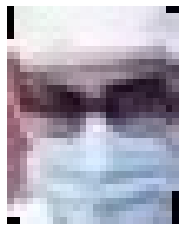

frame105_face_3
0.059618746283599755
(237.06999999999994, 116.29999999999995)



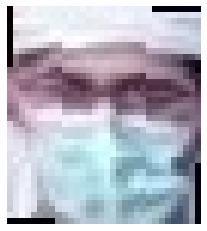

frame105_face_1
0.0600586289225391
(186.06999999999994, 94.29999999999995)


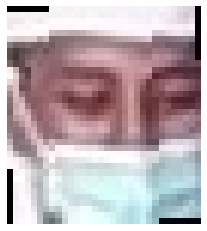

frame105_face_2
0.06429003408079303
(357.93000000000006, 3.7000000000000455)


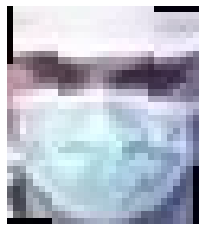

frame105_face_8
0.06491913688853523
(98.93000000000006, 79.29999999999995)


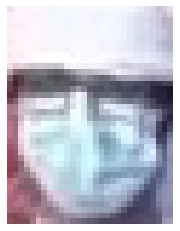

frame105_face_5
0.06636579505988294
(9.930000000000064, 119.29999999999995)


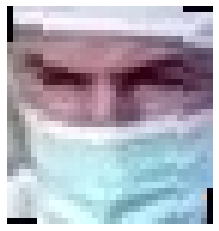

frame106_face_6
0.05232479262579193
(439.1700000000001, 17.82000000000005)


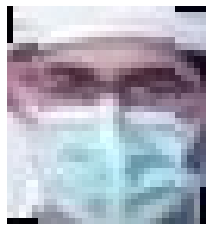

frame106_face_2
0.0557996704786512
(185.17000000000007, 94.17999999999995)


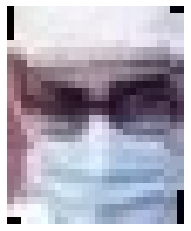

frame106_face_3
0.05787840063478977
(234.17000000000007, 117.17999999999995)


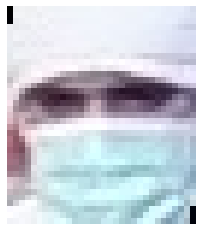

frame106_face_8
0.05908231346789783
(110.17000000000007, 73.17999999999995)


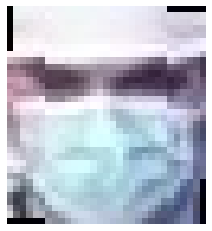

frame106_face_9
0.06278940535845512
(101.82999999999993, 79.17999999999995)


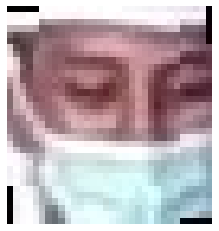

frame106_face_5
0.06648930634876926
(361.8299999999999, 5.82000000000005)


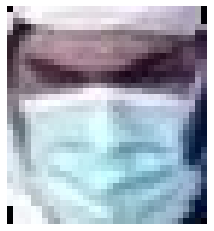

frame106_face_4
0.06899310467975228
(338.1700000000001, 62.17999999999995)


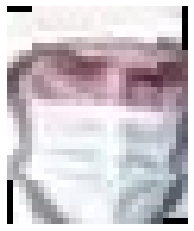

frame106_face_1
0.07075778408351241
(519.8299999999999, 110.17999999999995)


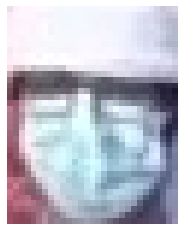

frame106_face_7
0.07476636524972746
(11.829999999999927, 120.17999999999995)


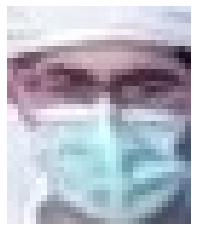

frame107_face_2
0.05338960976916185
(185.3499999999999, 92.23000000000002)


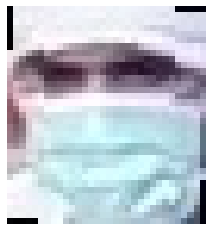

frame107_face_9
0.054179627329182134
(109.34999999999991, 71.23000000000002)


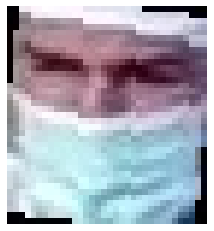

frame107_face_1
0.05706257140574966
(440.3499999999999, 20.769999999999982)



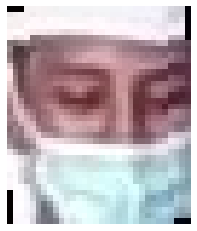

frame107_face_8
0.060899519718668915
(365.6500000000001, 8.769999999999982)


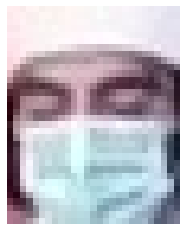

frame107_face_10
0.06440338315200977
(258.6500000000001, 84.23000000000002)


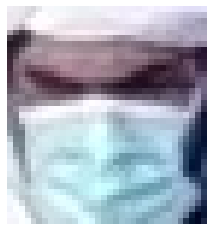

frame107_face_3
0.06557123930636088
(336.3499999999999, 62.23000000000002)


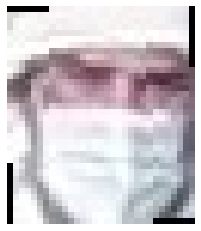

frame107_face_7
0.06739741405982225
(522.6500000000001, 109.23000000000002)


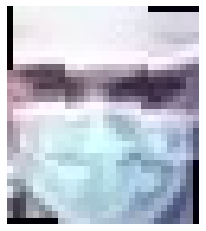

frame107_face_4
0.06986787541066242
(104.65000000000009, 80.23000000000002)


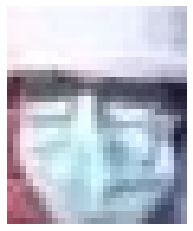

frame107_face_5
0.07212498442079696
(13.650000000000091, 122.23000000000002)


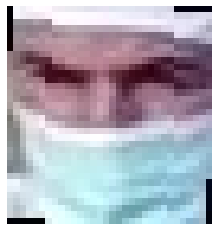

frame108_face_1
0.05368824247706405
(442.5899999999999, 16.779999999999973)


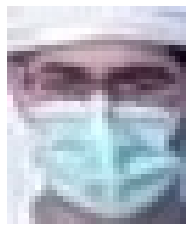

frame108_face_4
0.05575573041210646
(183.58999999999992, 91.22000000000003)


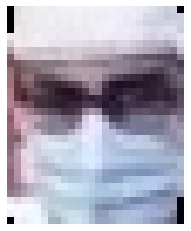

frame108_face_8
0.058333641423664706
(229.58999999999992, 121.22000000000003)


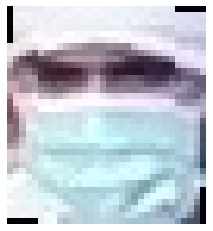

frame108_face_9
0.059707333416520014
(107.58999999999992, 73.22000000000003)


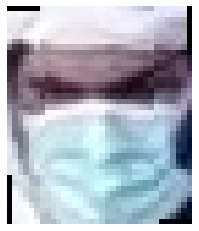

frame108_face_7
0.06014708317940087
(334.5899999999999, 60.22000000000003)


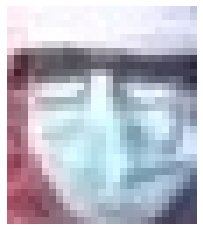

frame108_face_3
0.06532000416823114
(14.410000000000082, 121.22000000000003)


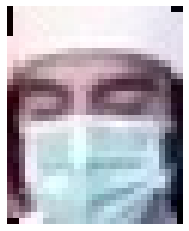

frame108_face_2
0.06639458068371995
(259.4100000000001, 83.22000000000003)


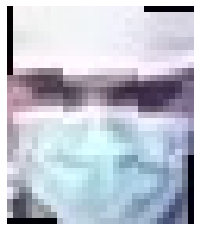

frame108_face_6
0.07058010354001687
(107.41000000000008, 82.22000000000003)


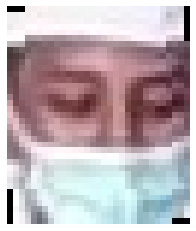

frame108_face_5
0.07150001359340497
(371.4100000000001, 7.779999999999973)


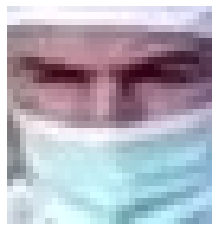

frame109_face_2
0.04943518306257555
(443.8299999999999, 15.789999999999964)


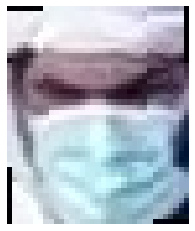

frame109_face_5
0.05837181570023431
(332.8299999999999, 59.210000000000036)


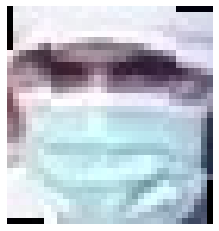

frame109_face_9
0.059202873903629216
(105.82999999999993, 74.21000000000004)


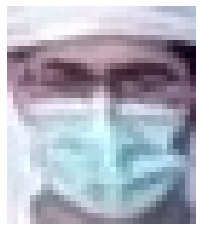

frame109_face_1
0.05948308035921235
(181.82999999999993, 91.21000000000004)


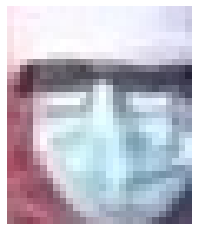

frame109_face_4
0.06332754336858815
(15.170000000000073, 121.21000000000004)


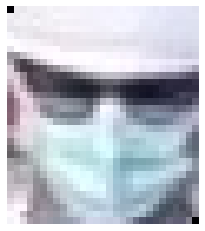

frame109_face_7
0.06366647610283815
(397.1700000000001, 54.210000000000036)


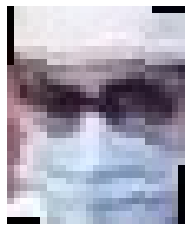

frame109_face_3
0.06397908830240706
(227.82999999999993, 124.21000000000004)


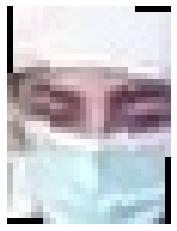

frame109_face_10
0.0680610502006016
(230.17000000000007, 20.210000000000036)


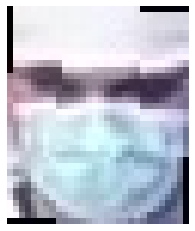

frame109_face_8
0.07051515997168245
(110.17000000000007, 82.21000000000004)


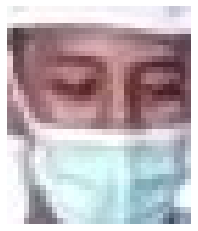

frame109_face_6
0.12389585431655481
(375.1700000000001, 11.789999999999964)


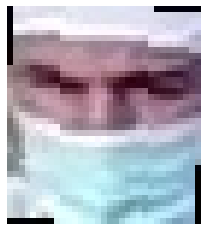

frame110_face_2
0.0524741758914431
(445.06999999999994, 14.799999999999955)


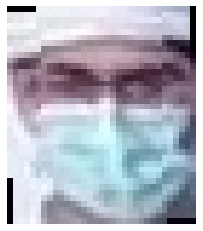

frame110_face_1
0.0580464439683811
(181.06999999999994, 91.20000000000005)


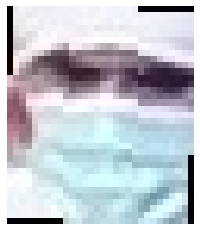

frame110_face_12
0.06080187541910809
(105.06999999999994, 76.20000000000005)


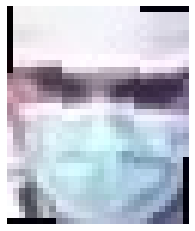

frame110_face_8
0.06236898423672732
(111.93000000000006, 84.20000000000005)


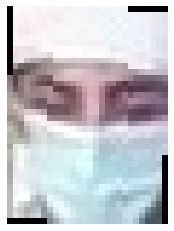

frame110_face_7
0.06296699657544869
(230.93000000000006, 19.200000000000045)


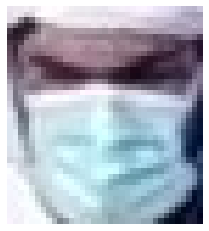

frame110_face_3
0.06368077465918875
(329.06999999999994, 58.200000000000045)


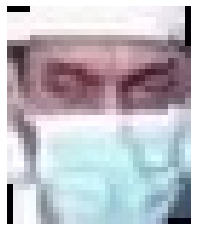

frame110_face_4
0.06447356189434472
(514.9300000000001, 39.200000000000045)


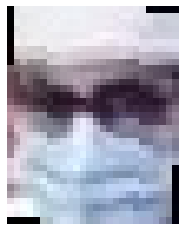

frame110_face_9
0.06843549975717189
(225.06999999999994, 127.20000000000005)


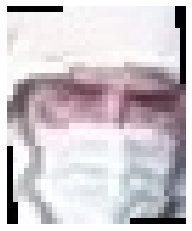

frame110_face_5
0.06872626652645131
(540.9300000000001, 113.20000000000005)


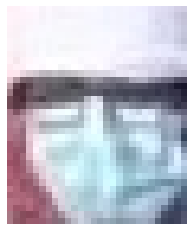

frame110_face_6
0.06925862005765593
(17.930000000000064, 122.20000000000005)


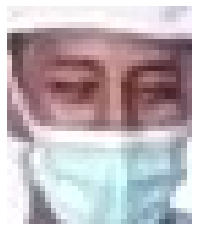

frame110_face_10
0.09402164583295547
(379.93000000000006, 10.799999999999955)


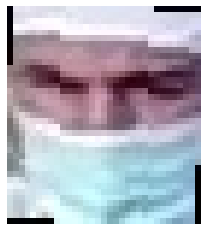

frame111_face_2
0.05247174913265118
(444.01, 14.559999999999945)


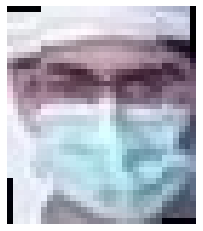

frame111_face_1
0.05581366945885258
(180.01, 91.44000000000005)


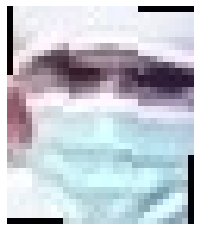

frame111_face_11
0.060582226776348835
(104.00999999999999, 76.44000000000005)


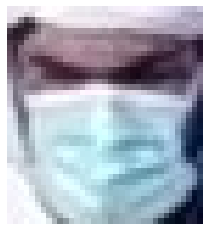

frame111_face_3
0.06275484393583608
(328.01, 58.440000000000055)


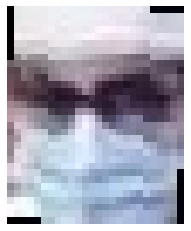

frame111_face_9
0.06346715984729034
(224.01, 127.44000000000005)


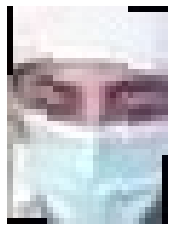

frame111_face_7
0.06443629090821512
(231.99, 19.440000000000055)


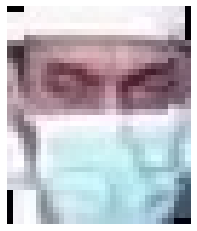

frame111_face_4
0.06492059569627373
(515.99, 39.440000000000055)


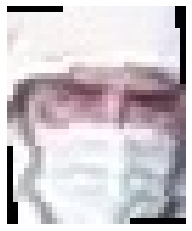

frame111_face_5
0.06651088661362181
(541.99, 113.44000000000005)


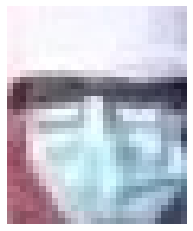

frame111_face_6
0.0686791048917279
(18.99000000000001, 122.44000000000005)


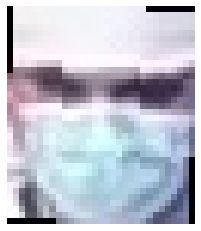

frame111_face_8
0.06944829144249265
(112.99000000000001, 84.44000000000005)


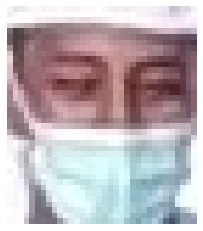

frame111_face_10
0.13051498122529137
(380.99, 10.559999999999945)


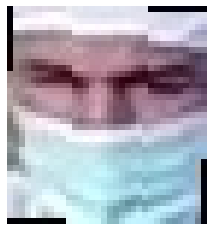

frame112_face_2
0.057383893241904294
(443.95000000000005, 12.190000000000055)


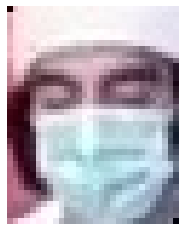

frame112_face_7
0.0595390527073234
(262.04999999999995, 82.80999999999995)


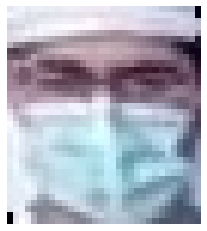

frame112_face_1
0.05989880640218925
(175.95000000000005, 92.80999999999995)


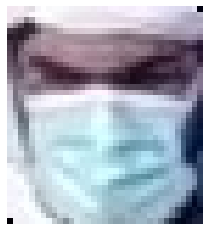

frame112_face_3
0.06448961416136356
(324.95000000000005, 61.809999999999945)


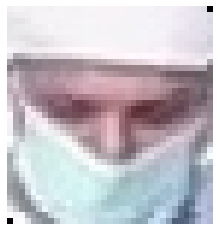

frame112_face_13
0.06505028551605718
(722.05, 28.190000000000055)


In [ ]:
import matplotlib.image as mpimg
for i,j,k in false_positives:
  try:
    img = mpimg.imread(project_dir +"/extracted_faces/" + challenge_type+ "/"+ i+ ".jpg")
    plt.axis('Off')
    plt.imshow(img)
    plt.show()
    print(i)
    print(k)
    print(j)
  except:
    print()

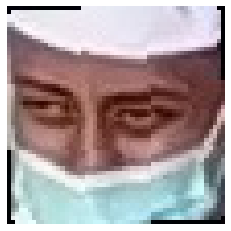

frame281_face_5
0.6773807986053862
(559.1700000000001, 16.660000000000082)


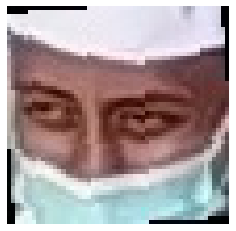

frame282_face_6
0.6693731771435003
(558.05, 16.319999999999936)


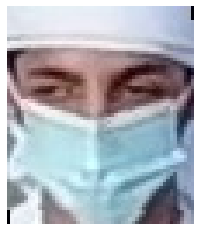

frame304_face_13
0.6637594646209803
(480.1500000000001, 113.97000000000003)


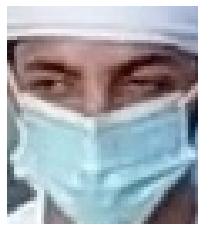

frame330_face_13
0.6579772279454115
(513.23, 150.0)


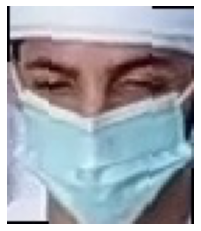

frame359_face_11
0.6742945997776906
(582.43, 198.1400000000001)


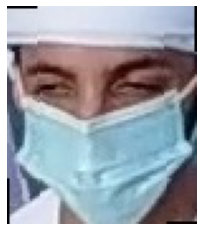

frame376_face_10
0.6787829364996997
(728.39, 244.72000000000003)


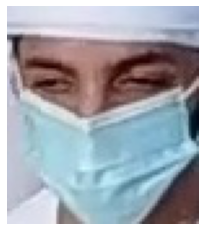

frame379_face_12
0.6830367499372008
(738.1, 245.70000000000005)


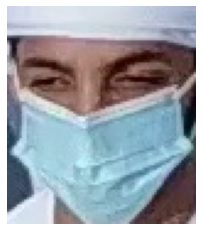

frame384_face_2
0.7413035453532251
(739.99, 279.72)


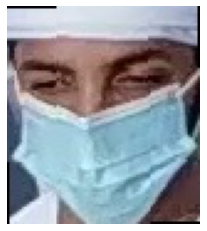

frame385_face_11
0.6904036133932776
(739.05, 295.0)


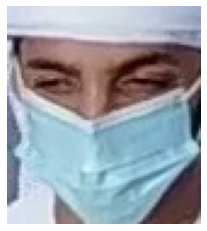

frame390_face_6
0.6668758094956435
(741.5699999999999, 318.28999999999996)


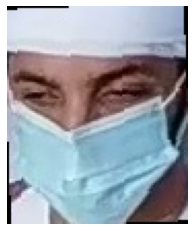

frame407_face_13
0.8075494464939634
(963.6800000000001, 400.67999999999984)


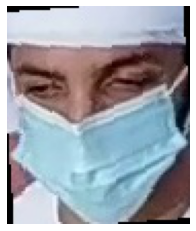

frame409_face_11
0.8087831449020579
(999.8, 397.84000000000015)


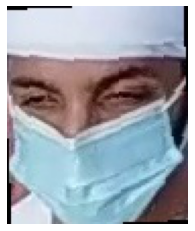

frame413_face_12
0.6711593690154919
(1039.52, 403.0)


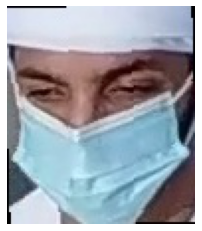

frame416_face_8
0.6617264603562691
(1056.7, 355.0)


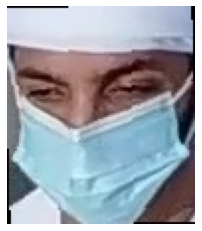

frame417_face_7
0.6534537996682099
(1056.7, 355.0)


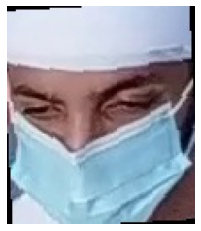

frame435_face_5
0.6657078280491534
(1000, 1000)


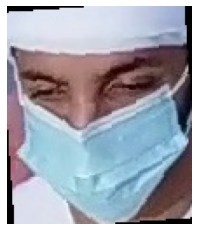

frame429_face_6
0.6961554132792711
(1000, 1000)


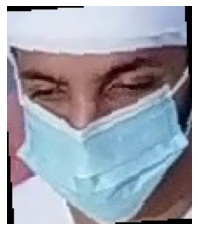

frame428_face_5
0.7516725314173279
(1000, 1000)


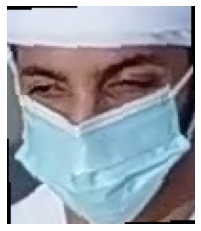

frame420_face_6
0.8093222017375099
(1000, 1000)


In [ ]:
import matplotlib.image as mpimg
for i,j,k in true_negatives:
  img = mpimg.imread(project_dir + "/extracted_faces/" + challenge_type+ "/"+ i+ ".jpg")
  plt.axis('Off')
  plt.imshow(img)
  plt.show()
  print(i)
  print(k)
  print(j)

In [ ]:
for i,j,k in false_negatives:
  try:
    img = mpimg.imread(project_dir + "/extracted_faces/" + challenge_type+ "/"+ i+ ".jpg")
    plt.axis('Off')
    plt.imshow(img)
    plt.show()
    print(i)
    print(k)
    print(j)
  except:
    print()

# Analysis

In [ ]:
!pip install pandas 

In [ ]:
import pandas as pd

In [ ]:
tp = pd.DataFrame([k for i,j,k in true_positives])
fp = pd.DataFrame([k for i,j,k in false_positives])

## Mean and STD

In [ ]:
tp_mean = round(tp.mean().values[0], 4)
fp_mean = round(fp.mean().values[0], 4)
tp_std = round(tp.std().values[0], 4)
fp_std = round(fp.std().values[0], 4)

print("Mean of true positives: ", tp_mean)
print("Std of true positives: ", tp_std)
print("Mean of false positives: ", fp_mean)
print("Std of false positives: ", fp_std)

IndexError: ignored

## Distribution

In [ ]:
tp[0].plot.kde()
fp[0].plot.kde()

In [ ]:
print(float(tp.max()))
print(float(fp.min()))

The max of positives overlaps with the minimums of the negatives.
This overlap makes a single distinguising threshold difficult to choose

## Using 2 Sigma, which is 95% confidence to get finetuned threshold

In [ ]:
threshold = round(tp_mean + 2 * tp_std, 4)
threshold